SCENARIOS WITH INCREASING 
===========================

$S = \sigma + i \omega$

$ \zeta = \frac{\sigma} {\sqrt{\sigma^2 +\omega^2}}$

$\sigma = -0.183$

$\omega = 4.662$

In [1]:
import numpy as np
import ewtpy
import scipy.stats as st
from scipy.signal import butter, lfilter, freqz
from timeit import default_timer as timer
import pandas as pd
import scipy as sp
import matplotlib
import matplotlib.pyplot as plt
from pylab import rcParams
import sklearn
from pylab import *
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy import signal
# import ewtpy
import warnings
from scipy import fftpack
from scipy import signal
from scipy.linalg import eig
from scipy.signal import hilbert
from vmdpy import VMD
import pywt
from PyLMD import LMD

import pyramses
import scipy as sp
import cmath
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image
from pyhht.visualization import plot_imfs
from pylab import rcParams
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.linalg import hankel
import scipy as sp

import pyramses
import scipy as sp
import cmath
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image
from pyhht.visualization import plot_imfs
from pylab import rcParams
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.linalg import hankel
import scipy as sp

In [2]:
# import os
# os.chdir('C:/Users/Ambreen/Documents/ewtpy-master/example')
# from ipynb.fs.full.mat_pan import *

# Scenario setup

In this section, we set up the scenario to be analysed and monitored. First, we load the required modules: 

In [3]:
case = pyramses.cfg() # Create a new scenario

After making changes in dyn_A KPSS, following versions were generated
-------------

In [4]:
case.addData('dyn_A.DAT') # Dynamic data fileuse with trip gen

In [5]:
case.addData('volt_rat_A.dat') # Power-flow (static) data
case.addData('settings1.dat') # Solver settings
case.addObs("obs.dat") # File with the variables to be saved for offline analysis
case.addTrj("out.trj") # File for saving the variables for offline analysis

In [6]:
case.addDst('short.dst') # Description of disturbance

# Execute simulation and monitoring

In [7]:
ram = pyramses.sim() # Create a new simulator instance
ret = ram.execSim(case) # Start the simulation of the scenarion paused at t=0 seconds

Then, we run the remaining of the system analysis. The simulation-monitoring loop stops when we reach the time horizon or when we have a violation of voltage or machine speed constraints.

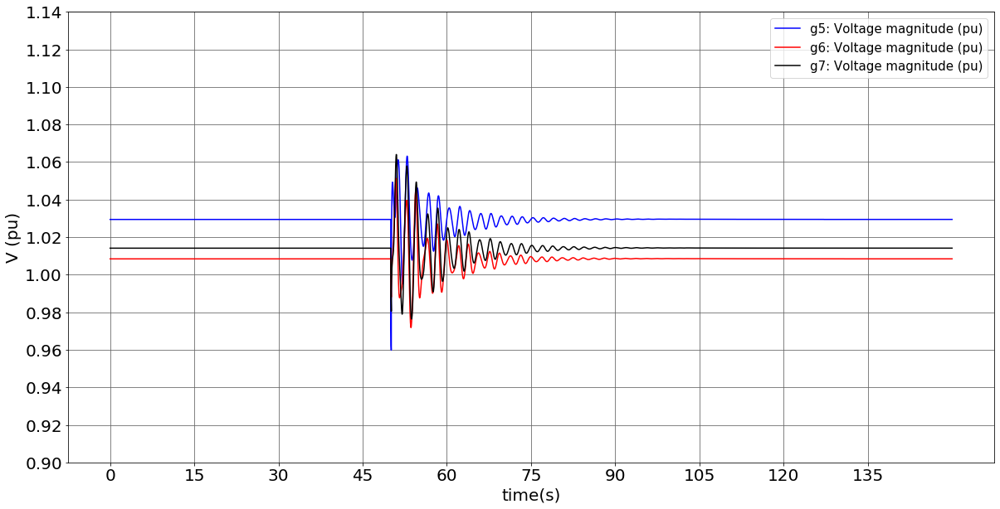

In [8]:
ext = pyramses.extractor(case.getTrj())
v4041 = ext.getBus('g5').mag
v4042 = ext.getBus('g6').mag
v4044 = ext.getBus('g7').mag


import pylab as plot
params = {'legend.fontsize': 15,
          'legend.handlelength': 2}
plot.rcParams.update(params)

fig=plt.figure(figsize=(20,10), facecolor='w', edgecolor='k')
plt.plot(v4041.time, v4041.value, 'b', label=v4041.msg)
plt.plot(v4042.time, v4042.value, 'r', label=v4042.msg)
plt.plot(v4044.time, v4044.value, 'k', label=v4044.msg)
plt.ylabel('V (pu)', size  = 20)
plt.xlabel('time(s)', size = 20)
plt.legend(loc='upper right')
plt.xticks(np.arange(0, 145, 15))
plt.yticks(np.arange(0.90, 1.15, 0.02))
# plt.ylim(0.95, 1.15)
plt.grid(b=True, which='major', color='#666666', linestyle='-')

# fig.suptitle('Horizontally stacked subplots', size = 10)

for ax in fig.axes:
    matplotlib.pyplot.sca(ax)
    plt.xticks(fontsize=20) 
    plt.yticks(fontsize=20)

plt.show()

Make Data Frame for all voltages
==========================

In [9]:
bus_name = ram.getAllCompNames("BUS")

valu = []
main = []

class dataframe:
    def __init__(self,bus_name):
        self.busName = bus_name
        

    def V_mag(self):
    
        for i in self.busName:
            a = ext.getBus(i).mag
            main.append((a))
            
        return (main)

    def vu(self):
    
        val = self.V_mag()
            
        for i in range(0,len(self.busName)):

            mag=val[i].value
            valu.append(mag)

    def make_df(self):
        
        y = self.vu()
        df = pd.DataFrame(valu)
        df = df.T
        df.columns = self.busName
        df['Time'] = main[0].time
        df.set_index("Time", inplace = True)
        return df

r = dataframe(bus_name)
vol_mag = r.make_df()
vol_mag.head()

,g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,...,42,43,46,47,51,61,62,63,71,72
Time,,,,,,,,,,,,,,,,,,,,,
0.000,1.0684,1.0565,1.0595,1.0339,1.0294,1.0084,1.0141,1.0498,0.9988,1.0157,...,0.995224,1.001287,0.999033,0.994964,0.997757,0.994882,1.000212,0.9992,1.002757,0.997403
0.001,1.0684,1.0565,1.0595,1.0339,1.0294,1.0084,1.0141,1.0498,0.9988,1.0157,...,0.995224,1.001287,0.999033,0.994964,0.997757,0.994882,1.000212,0.9992,1.002757,0.997403
0.002,1.0684,1.0565,1.0595,1.0339,1.0294,1.0084,1.0141,1.0498,0.9988,1.0157,...,0.995224,1.001287,0.999033,0.994964,0.997757,0.994882,1.000212,0.9992,1.002757,0.997403
0.022,1.0684,1.0565,1.0595,1.0339,1.0294,1.0084,1.0141,1.0498,0.9988,1.0157,...,0.995224,1.001287,0.999033,0.994964,0.997757,0.994882,1.000212,0.9992,1.002757,0.997403
0.042,1.0684,1.0565,1.0595,1.0339,1.0294,1.0084,1.0141,1.0498,0.9988,1.0157,...,0.995224,1.001287,0.999033,0.994964,0.997757,0.994882,1.000212,0.9992,1.002757,0.997403


Text(0.5, 0, 'time(s)')

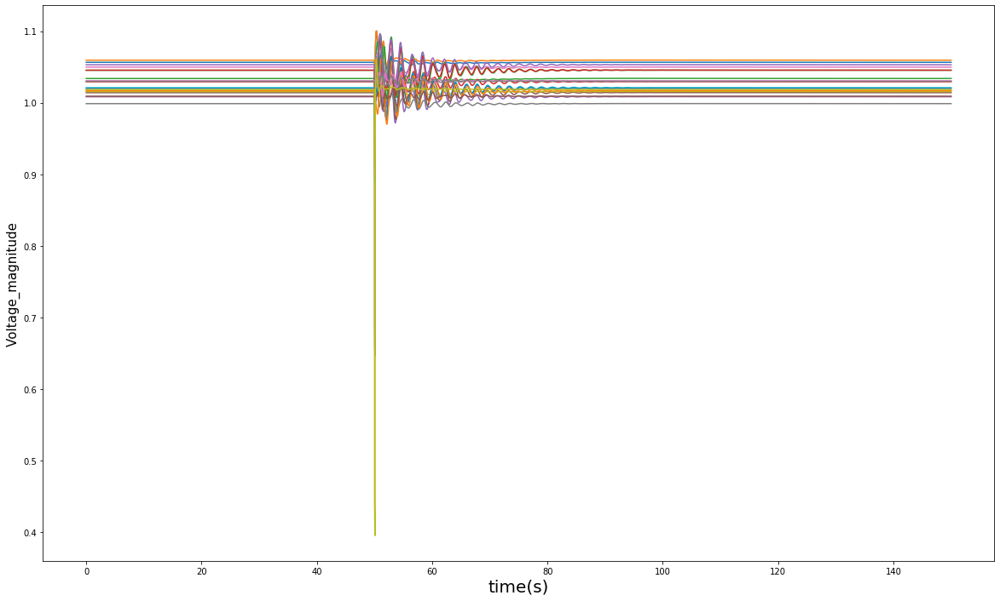

In [10]:
fig=plt.figure(figsize=(20,12))

plt.plot(vol_mag.iloc[:,1:20])
# plt.title('Voltage Magnitude for all busses', size = 20, color = 'b')
plt.ylabel('Voltage_magnitude',size = 15)
plt.xlabel('time(s)',size = 20)


In [11]:
del(ram)
del(case)

EWT
======

In [178]:
def pca(data_without_time,n_component):
    
    '''takes the data without time
       returns reduced data '''
    
    
#     X = data_without_time.values
#     pca = PCA(n_components=2)
#     x_2d = pca.fit_transform(X)
    
    
    X = data_without_time.values
    X_std = StandardScaler().fit_transform(X) #scale data
    pca = PCA(n_components=4, svd_solver='full')
    x_2d = pca.fit_transform(X_std)
    print(pca.explained_variance_ratio_)
    print('total explained variance:',np.sum(pca.explained_variance_ratio_)*100)
    
    reduced_data = pd.DataFrame(x_2d)
    reduced_data=reduced_data
    
    plt.plot(pca.explained_variance_ratio_)
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance (Eigen value)')
    plt.show()
    return (reduced_data)

In [179]:
aa=0
bb=5000

vm= vol_mag.iloc[aa:bb,0:20].reset_index(drop=False)
um= vol_mag.iloc[aa:bb,1:20].reset_index(drop=False)
time = vol_mag.iloc[aa:bb,].index

In [180]:
# pc =  pca(um,3)

In [181]:
# plt.plot(time,pc[0])

EWT
=======

In [182]:
def lowpassfilter(signal, thresh, wavelet="db4"):
    thresh = thresh*np.nanmax(signal)
    coeff = pywt.wavedec(signal, wavelet, mode="per" )
    coeff[1:] = (pywt.threshold(i, value=thresh, mode="soft" ) for i in coeff[1:])
    reconstructed_signal = pywt.waverec(coeff, wavelet, mode="per" )
    return reconstructed_signal

WAVELET
===========

Add Noise
--------

In [189]:
def add_noise(signal,target_noise):
    x_volts = signal
    x_watts = x_volts ** 2
    # Set a target SNR
    target_snr_db = target_noise
    # Calculate signal power and convert to dB 
    sig_avg_watts = np.mean(x_watts)
    sig_avg_db = 10 * np.log10(sig_avg_watts)
    # Calculate noise according to [2] then convert to watts
    noise_avg_db = sig_avg_db - target_snr_db
    noise_avg_watts = 10 ** (noise_avg_db / 10)
    # Generate an sample of white noise
    mean_noise = 0
    stdd = np.sqrt(noise_avg_watts)
#     print(stdd)
    noise_volts = np.random.normal(mean_noise, np.sqrt(noise_avg_watts), len(x_watts))
    signal_with_noise = x_volts + noise_volts
    return(signal_with_noise)

In [190]:
# PC,TD=pca_noise(um,'yes','PC1',50)

In [191]:
# fig, (ax1,ax2,ax3) = plt.subplots(1, 3,gridspec_kw={'hspace': 0.15, 'wspace': 0.2},figsize=(20,6))

# ax1.plot(PC['PC1'],c='b')
# ax2.plot(PC['PC2'],c='r')
# ax3.plot(PC['PC3'],c='orange')
# ax4.plot(PC['PC4'],c='g')
# plt.show()

PCA noise
-------

In [194]:
def fft(signal, time,xlim1,xlim2):
    s = signal
    fft = np.fft.fft(s)
    t = time
    T = t[20] - t[19]  # sampling interval 
    N = s.size

    # 1/T = frequency
    f = np.linspace(0, 1 / T, N)
    fig, ax = plt.subplots(figsize = (12,4))
    plt.ylabel("Amplitude")
    plt.xlabel("Frequency [Hz]")
    plt.bar(f[:N // 2], np.abs(fft)[:N // 2] * 1 / N, width=0.2, edgecolor = 'white')  # 1 / N is a normalization factor
#     ax.axvline(x=0.54, color = 'r', label = '3 X std', linestyle = '--')
    plt.xlim(xlim1,xlim2)
    # plt.ylim(0,0.2)
    plt.show()

In [195]:
def pca_noise(data,plot,PC,target_noise):
        data = data
        time = data['Time'].values
        data_without_time = data.iloc[:,1:]
        target_noise=target_noise
        
        gm=[]
        for j in range(0,18):
            hm  = add_noise(data_without_time.iloc[:,j],target_noise)
            gm.append(hm)
        noise_data = pd.DataFrame(gm)
        noise_data = noise_data.T

#         fig, ax = plt.subplots(figsize=(15, 5))
#         plt.plot(time,noise_data['g6'])
#         plt.title('Voltage with noise')
#         plt.xlabel('time (s)', size = 20)
#         plt.ylabel('Voltage p.u.', size = 20)
#         plt.show()


        X_s = StandardScaler(with_std=False).fit_transform(noise_data) #scale data
        pca2 = PCA(n_components=4)#choose number of components
        x_2 = pca2.fit_transform(X_s)#apply pca
        yf2 = pd.DataFrame(x_2 ,columns = ['PC1', 'PC2','PC3','PC4'])#create a data frame
        mean = np.mean(np.mean(data_without_time))
        yf2=yf2+1
        



        plot=plot #takes the arguments 'yes' or 'no'
        PC=PC #specify which PCA to be plotted 'PC1','PC2','PC3','PC4'

        if plot=='no':
            pass
        elif plot=='yes':
            fig, ax = plt.subplots(figsize=(15, 5))
            plt.plot(time,(yf2[PC]))
            plt.title(PC +' with noise')
            plt.xlabel('time(s)', size = 20)
            plt.ylabel('Voltage p.u', size = 20)
            plt.show()
        
        return(yf2,time)

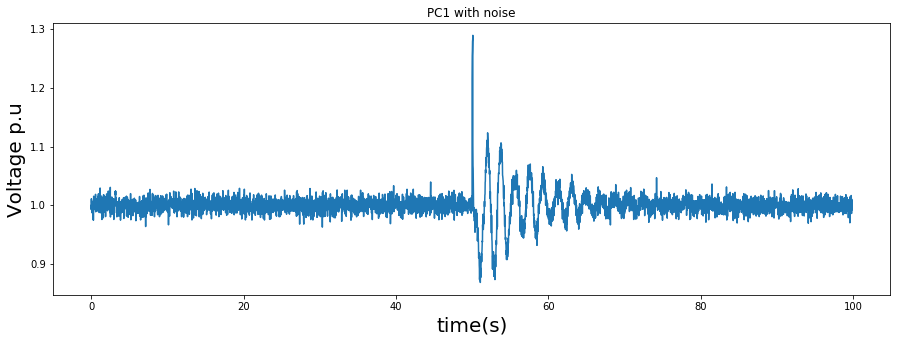

In [196]:
yf2,time= pca_noise(um,'yes','PC1',40)

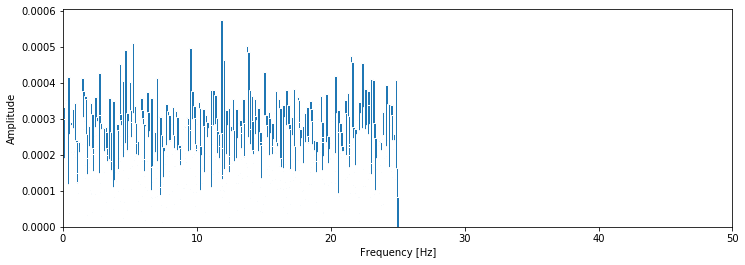

In [200]:
fft(signal.detrend(yf2['PC1'][0:2500]), time,0,50)

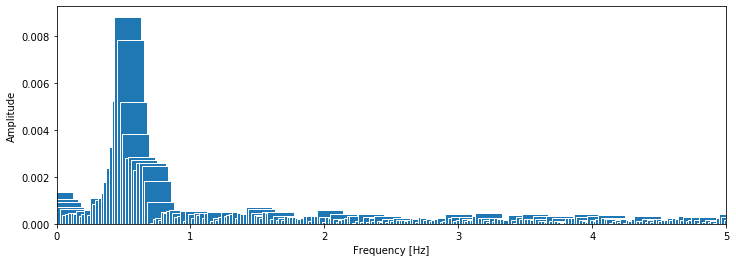

In [201]:
fft(signal.detrend(yf2['PC1'][2550:5000]), time,0,5)

In [22]:
# pc_with_noise=thq['PC1']
# Sg = lowpassfilter(pc_with_noise,0.001)
# gdd = Sg-gtt

In [23]:
# pc_without_noise,ta5=wpca(um,'np','PC1')
# noise = np.random.normal(0, 0.01, len(signal))

In [24]:
def wpca(data,plot,PC):
    data = data
    time = data['Time'].values
    data_without_time = data.iloc[:,1:]
    X_s = StandardScaler(with_std=False).fit_transform(data_without_time) #scale data
    pca2 = PCA(n_components=4, svd_solver='full')#choose number of components
    x_2 = pca2.fit_transform(X_s)#apply pca
    yf2 = pd.DataFrame(x_2 ,columns = ['PC1', 'PC2','PC3','PC4'])#create a data frame
    mean = np.mean(np.mean(data_without_time))
    yf2= yf2+1
    
    plot=plot #takes the arguments 'yes' or 'no'
    PC=PC #specify which PCA to be plotted 'PC1','PC2','PC3','PC4'

    if plot=='no':
        pass
    elif plot=='yes':
        fig, ax = plt.subplots(figsize=(15, 5))
        plt.plot(time,(yf2[PC]))
        plt.title('PCA')
        plt.xlabel('time(s)', size = 20)
        plt.ylabel('Voltage p.u', size = 20)
        plt.show()
        
    return(yf2,time)


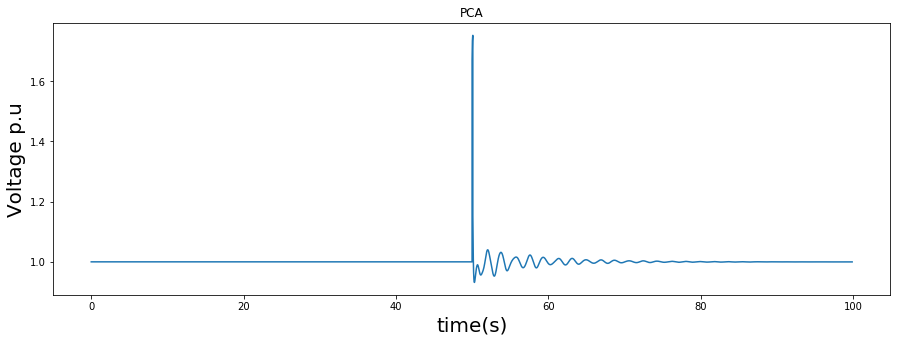

In [25]:
pc,ttt=wpca(um,'yes','PC1')

In [26]:
# pc,ttt= pca_noise(um,'yes','PC1',40)

In [27]:
t =ttt
f1 = pc['PC1']
f2 = pc['PC2']
f3 = pc['PC3']

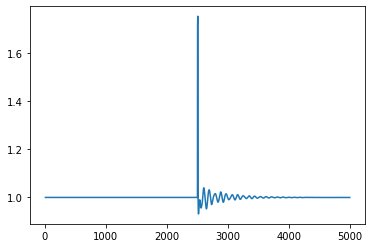

In [28]:
plt.plot(f1[10:])

Mean Squared Error
---------------

In [29]:
def MSEF(y1):
#     y_bar = 0.77
    y_bar = 0.537
    y = y1
    y = y.dropna()
    y= y.reset_index(drop = True)
    summation = 0  #variable to store the summation of differences
    n = len(y) #finding total number of items in list
    summ = []
    for i in range (0,n):  #looping through each element of the list
      difference = y[i] - y_bar  #finding the difference between observed and predicted value
      squared_difference = difference**2  #taking square of the differene 
      summation = summation + squared_difference  #taking a sum of all the differences
      psum = summation + squared_difference 
      summ.append(squared_difference )
    MSE = summation/n  #dividing summation by total values to obtain average
    print ("The Mean Square Error is: " , MSE)
    return(MSE)

In [30]:
def MSED(y):
#     y_bar = 3.9
    y_bar = 3.7
    y = y
    y = y.dropna()
    y= y.reset_index(drop = True)
    summation = 0  #variable to store the summation of differences
    n = len(y) #finding total number of items in list
    summ = []
    for i in range (0,n):  #looping through each element of the list
      difference = y[i] - y_bar  #finding the difference between observed and predicted value
      squared_difference = difference**2  #taking square of the differene 
      summation = summation + squared_difference  #taking a sum of all the differences
      psum = summation + squared_difference 
      summ.append(squared_difference )
    MSE = summation/n  #dividing summation by total values to obtain average
    print ("The Mean Square Error is: " , MSE)
    return(MSE)

Detect probability
-------

In [31]:
def moda(IF,IR,time1,time2):
    threshold = 0.037
    mode= pd.DataFrame(IR, columns = ['ratio'])
    mode['frequency'] = IF
    mode['S.time'] = time1
    mode['E.time'] = time2
    mode.loc[mode['ratio'] < 0.014, 'Anomaly'] = 'False' 
    mode.loc[mode['ratio'] >= threshold, 'Anomaly'] = 'True'
    mode.loc[mode['ratio'] > 0.052389, 'Anomaly'] = 'False'
    # defeine frequency
    def cat(u):
        if u == 0:
            return "False"
        if u < 0.43:
            return "False"
        if u > 0.82:
            return "False"
        else:
            return "True"
    mode['freq'] = mode['frequency'].apply(lambda u: cat(u))
#     mode['power'] = (power-np.mean(power))/np.std(power)
    
    return(mode)

In [240]:
# def get_wavelet(f,threshold,step):

#     #signal spectrum
#     ff = np.fft.fft(f)
#     ff = abs(ff[0:int(np.ceil(ff.size/2))])#one-sided magnitude

#     #============================================
#     #%% show boundaries
#     ff1 = np.fft.fft(f)
#     freq1=2*np.pi*np.arange(0,len(ff1))/len(ff1)

#     ff1 = abs(ff1[:ff1.size//2])#one-sided magnitude
#     freq1 = freq1[:freq1.size//2]    

#     # cutoff frequency below 0.1 and above 1
#     bd = np.where((freq1 > 0) & (freq1 < step))
#     ll = np.max(bd)
#     print('ll:',ll)

#     #========================================================

#     W = pd.DataFrame(freq1, columns = ['Frequency'])
#     W['Amplitude'] = ff1
#     #===============================================================
    
#     R = []
#     S = []
#     U= []
#     id1 =[]
#     id2 = []
#     while True:
#         for i in range((W.shape[0] +ll) // ll):
#             R.append(W.iloc[(i * ll)  : (i + 1) * ll])
#             col = list(W.head())
#             data = pd.DataFrame((R[i]), columns=col)

#             gmax = np.max(data['Amplitude'])
#             i1 = data['Amplitude'].where(data['Amplitude']== gmax)

#             S.append(gmax)
#             id1.append(i1)

#         break
#     #===========================================================

#     kd = []
#     for i in range(0,len(id1)):
#         gt = pd.DataFrame(id1[i])
#         gr = gt[gt['Amplitude'] > 0]
#         kd.append(gr)
# #         print('kd',len(kd))
# #     #===============================   
#     print('kd', len(kd))
#     print('o', len(kd[0]))
    
    
#     if len(kd) <= 1:
#         idx = []
#         amp = []
#         for i in range(len(kd[0])):
#             iddx = kd[i].index[0]
#             amm= kd[i].values[0][0]
#             amp.append(amm)
#             idx.append(iddx)
#     else:
#         idx = []
#         amp = []
#         for i in range(len(kd)):
#             iddx = kd[i].index[0]
#             amm= kd[i].values[0][0]
#             amp.append(amm)
#             idx.append(iddx)

#     #====================================

#     gf = pd.DataFrame()
#     gf['Amplitude'] = amp
#     gf['id1'] = idx
#     if np.max(gf['Amplitude'])>0.5:
#         gtac= gf[gf['Amplitude']> (threshold*np.std(ff1))]
#         #==============================


#         locmax = np.zeros(ff.size)
#         locmin = max(ff)*np.ones(ff.size)
#         locmax[idx] = amp
#         id1= gtac['id1']
#         N = len(id1) #this one says keep the min of N or locmax.size
#         print('N',N)
#         M = N
#         N=N
#         '''
#         # to keep the highest maxima we first sort the locmax argsort (locmax.argsort()[::-1]) with indices
#         #then we keep just N number of maxima (locmax.argsort()[::-1][:N])
#         #finally we sort the highest maxima by (np.sort(locmax.argsort()[::-1][:N]))'''
#         #keep the N-th highest maxima
#         maxidxs = np.sort(locmax.argsort()[::-1][:N])
#         #middle point between consecutive maxima
#         bound = np.zeros(N)
#         for i in range(N):
#             if i == 0:
#                 a = 0
#             else:
#                 a = maxidxs[i-1]           
#             bound[i] = (a + maxidxs[i])/2

#         #apply log if needed
#         if log == 1:
#             ff = np.log(ff)

#         presig = ff
#         boundaries =  bound
#         boundaries= boundaries+1
#         #================================
#         #apply log if needed
#         if log == 1:
#             ff = np.log(ff)

#         presig = ff
#         boundaries =  bound
#         boundaries= boundaries+1
#         #================================
#         NT = N-1
#         Nd=NT-len(boundaries)
#         deltaw=(np.pi-boundaries[-1])/(Nd+1)
#         for k in range(Nd):
#             boundaries = np.append(boundaries,boundaries[-1]+deltaw)
#         #===============================================================
#         boundaries = boundaries*np.pi/round(ff.size)
#         #==============================================================

#         if completion == 1 and len(boundaries)<N-1:
#             boundaries = EWT_Boundaries_Completion(boundaries,N-1) 
#         #Filtering
#         #extend the signal by mirroring to deal with boundaries
#         ltemp = int(np.ceil(f.size/2)) #to behave the same as matlab's round
#         fMirr =  np.append(np.flip(f[0:ltemp-1],axis = 0),f)  
#         fMirr = np.append(fMirr,np.flip(f[-ltemp-1:-1],axis = 0))
#         ffMirr = np.fft.fft(fMirr)

#         #build the corresponding filter bank
#         mfb=EWT_Meyer_FilterBank(boundaries,ffMirr.size)

#         #filter the signal to extract each subband
#         ewt = np.zeros(mfb.shape)
#         for k in range(mfb.shape[1]):
#             ewt[:,k] = np.real(np.fft.ifft(np.conjugate(mfb[:,k])*ffMirr))  
#         ewt = ewt[ltemp-1:-ltemp,:]
#     elif np.max(gf['Amplitude'])<0.5:
#         gtac= gf[gf['Amplitude']> (threshold)]
#         #==============================


#         locmax = np.zeros(ff.size)
#         locmin = max(ff)*np.ones(ff.size)
#         locmax[idx] = amp
#         id1= gtac['id1']
#         N = 2 #this one says keep the min of N or locmax.size
#         print('N',N)
#         M = N
#         N=N
#         '''
#         # to keep the highest maxima we first sort the locmax argsort (locmax.argsort()[::-1]) with indices
#         #then we keep just N number of maxima (locmax.argsort()[::-1][:N])
#         #finally we sort the highest maxima by (np.sort(locmax.argsort()[::-1][:N]))'''
#         #keep the N-th highest maxima
#         maxidxs = np.sort(locmax.argsort()[::-1][:N])
#         #middle point between consecutive maxima
#         bound = np.zeros(N)
#         for i in range(N):
#             if i == 0:
#                 a = 0
#             else:
#                 a = maxidxs[i-1]           
#             bound[i] = (a + maxidxs[i])/2

#         #apply log if needed
#         if log == 1:
#             ff = np.log(ff)

#         presig = ff
#         boundaries =  bound
#         boundaries= boundaries+1
#         #================================
#         #apply log if needed
#         if log == 1:
#             ff = np.log(ff)

#         presig = ff
#         boundaries =  bound
#         boundaries= boundaries+1
#         #================================
#         NT = N-1
#         Nd=NT-len(boundaries)
#         deltaw=(np.pi-boundaries[-1])/(Nd+1)
#         for k in range(Nd):
#             boundaries = np.append(boundaries,boundaries[-1]+deltaw)
#         #===============================================================
#         boundaries = boundaries*np.pi/round(ff.size)
#         #==============================================================

#         if completion == 1 and len(boundaries)<N-1:
#             boundaries = EWT_Boundaries_Completion(boundaries,N-1) 
#         #Filtering
#         #extend the signal by mirroring to deal with boundaries
#         ltemp = int(np.ceil(f.size/2)) #to behave the same as matlab's round
#         fMirr =  np.append(np.flip(f[0:ltemp-1],axis = 0),f)  
#         fMirr = np.append(fMirr,np.flip(f[-ltemp-1:-1],axis = 0))
#         ffMirr = np.fft.fft(fMirr)

#         #build the corresponding filter bank
#         mfb=EWT_Meyer_FilterBank(boundaries,ffMirr.size)

#         #filter the signal to extract each subband
#         ewt = np.zeros(mfb.shape)
#         for k in range(mfb.shape[1]):
#             ewt[:,k] = np.real(np.fft.ifft(np.conjugate(mfb[:,k])*ffMirr))  
#         ewt = ewt[ltemp-1:-ltemp,:]
    
#     return(ewt,boundaries)

In [294]:
def get_wavelet(f,threshold,step):

    #signal spectrum
    ff = np.fft.fft(f)
    ff = abs(ff[0:int(np.ceil(ff.size/2))])#one-sided magnitude

    #============================================
    #%% show boundaries
    ff1 = np.fft.fft(f)
    freq1=2*np.pi*np.arange(0,len(ff1))/len(ff1)

    ff1 = abs(ff1[:ff1.size//2])#one-sided magnitude
    freq1 = freq1[:freq1.size//2]    

    # cutoff frequency below 0.1 and above 1
    bd = np.where((freq1 > 0) & (freq1 < step))
    ll = np.max(bd)
    print('ll:',ll)

    #========================================================

    W = pd.DataFrame(freq1, columns = ['Frequency'])
    W['Amplitude'] = ff1
    #===============================================================
    
    R = []
    S = []
    U= []
    id1 =[]
    id2 = []
    while True:
        for i in range((W.shape[0] +ll) // ll):
            R.append(W.iloc[(i * ll)  : (i + 1) * ll])
            col = list(W.head())
            data = pd.DataFrame((R[i]), columns=col)

            gmax = np.max(data['Amplitude'])
            i1 = data['Amplitude'].where(data['Amplitude']== gmax)

            S.append(gmax)
            id1.append(i1)

        break
    #===========================================================

    kd = []
    for i in range(0,len(id1)):
        gt = pd.DataFrame(id1[i])
        gr = gt[gt['Amplitude'] > 0]
        kd.append(gr)
#         print('kd',len(kd))
#     #===============================   
    print('kd', len(kd))
    print('o', len(kd[0]))
    
    
    if len(kd) <= 1:
        idx = []
        amp = []
        for i in range(len(kd[0])):
            iddx = kd[i].index[0]
            amm= kd[i].values[0][0]
            amp.append(amm)
            idx.append(iddx)
    else:
        idx = []
        amp = []
        for i in range(len(kd)):
            iddx = kd[i].index[0]
            amm= kd[i].values[0][0]
            amp.append(amm)
            idx.append(iddx)

    #====================================

    gf = pd.DataFrame()
    gf['Amplitude'] = amp
    gf['id1'] = idx
    gtac= gf[gf['Amplitude']>threshold]
    #==============================


    locmax = np.zeros(ff.size)
    locmin = max(ff)*np.ones(ff.size)
    locmax[idx] = amp
    id1= gtac['id1']
    N = max(len(id1),1) #this one says keep the min of N or locmax.size
    print('N',N)
    M = N
    N=N
    '''
    # to keep the highest maxima we first sort the locmax argsort (locmax.argsort()[::-1]) with indices
    #then we keep just N number of maxima (locmax.argsort()[::-1][:N])
    #finally we sort the highest maxima by (np.sort(locmax.argsort()[::-1][:N]))'''
    #keep the N-th highest maxima
    maxidxs = np.sort(locmax.argsort()[::-1][:N])
    #middle point between consecutive maxima
    bound = np.zeros(N)
    for i in range(N):
        if i == 0:
            a = 0
        else:
            a = maxidxs[i-1]           
        bound[i] = (a + maxidxs[i])/2

    #apply log if needed
    if log == 1:
        ff = np.log(ff)

    presig = ff
    boundaries =  bound
    boundaries= boundaries+1
    #================================
    #apply log if needed
    if log == 1:
        ff = np.log(ff)

    presig = ff
    boundaries =  bound
    boundaries= boundaries+1
    #================================
    NT = N-1
    Nd=NT-len(boundaries)
    deltaw=(np.pi-boundaries[-1])/(Nd+1)
    for k in range(Nd):
        boundaries = np.append(boundaries,boundaries[-1]+deltaw)
    #===============================================================
    boundaries = boundaries*np.pi/round(ff.size)
    #==============================================================

    if completion == 1 and len(boundaries)<N-1:
        boundaries = EWT_Boundaries_Completion(boundaries,N-1) 
    #Filtering
    #extend the signal by mirroring to deal with boundaries
    ltemp = int(np.ceil(f.size/2)) #to behave the same as matlab's round
    fMirr =  np.append(np.flip(f[0:ltemp-1],axis = 0),f)  
    fMirr = np.append(fMirr,np.flip(f[-ltemp-1:-1],axis = 0))
    ffMirr = np.fft.fft(fMirr)

    #build the corresponding filter bank
    mfb=EWT_Meyer_FilterBank(boundaries,ffMirr.size)

    #filter the signal to extract each subband
    ewt = np.zeros(mfb.shape)
    for k in range(mfb.shape[1]):
        ewt[:,k] = np.real(np.fft.ifft(np.conjugate(mfb[:,k])*ffMirr))  
    ewt = ewt[ltemp-1:-ltemp,:]
    
    return(ewt,boundaries)

In [295]:

        N = 4 #number of supports
        completion = 0
        detect = "locmax" #detection mode: locmax, locmaxmin, locmaxminf
        reg = 'none' #spectrum regularization - it is smoothed with an average (or gaussian) filter 
        lengthFilter = 0 #length or average or gaussian filter
        sigmaFilter = 0 #sigma of gaussian filter
        threshold = 0
        step = 0.0001

In [296]:
# -*- coding: utf-8 -*-
"""
Created on Tue Dec 18 11:45:32 2018
Empirical Wavelet Transform implementation for 1D signals
Original paper: 
Gilles, J., 2013. Empirical Wavelet Transform. IEEE Transactions on Signal Processing, 61(16), pp.3999–4010. 
Available at: http://ieeexplore.ieee.org/lpdocs/epic03/wrapper.htm?arnumber=6522142.
Original Matlab toolbox: https://www.mathworks.com/matlabcentral/fileexchange/42141-empirical-wavelet-transforms
 
@author: Vinícius Rezende Carvalho
Programa de pós graduação em engenharia elétrica - PPGEE UFMG
Universidade Federal de Minas Gerais - Belo Horizonte, Brazil
Núcleo de Neurociências - NNC 
"""

import numpy as np
#%EWT functions 
def EWT1D(f, N = 5, log = 0,detect = "locmax", completion = 0, reg = 'average', lengthFilter = 10,sigmaFilter = 5,threshold = threshold,step = step):
    """
     =========================================================================
     ewt,  mfb ,boundaries = EWT1D(f, N = 5, log = 0,detect = "locmax", completion = 0, reg = 'average', lengthFilter = 10,sigmaFilter = 5):
     
     Perform the Empirical Wavelet Transform of f over N scales. See 
     also the documentation of EWT_Boundaries_Detect for more details about
     the available methods and their parameters.
    
     Inputs:
       -f: the 1D input signal 
     Optional Inputs:  
       -log: 0 or 1 to indicate if we want to work with
                    the log spectrum
       -method: 'locmax','locmaxmin','locmaxminf'
       -reg: 'none','gaussian','average'
       -lengthFilter: width of the above filters (Gaussian or average)
       -sigmaFilter: standard deviation of the above Gaussian filter
       -N: maximum number of supports (modes or signal components)
       -completion: 0 or 1 to indicate if we try to complete
                           or not the number of modes if the detection
                           find a lower number of mode than N 
     Outputs:
       -ewt: contains first the low frequency component and
             then the successives frequency subbands
       -mfb: contains the filter bank (in the Fourier domain)
       -boundaries: vector containing the set of boundaries corresponding
                    to the Fourier line segmentation (normalized between
                    0 and Pi)
     Original MATLAB Version:
     Author: Jerome Gilles
     Institution: UCLA - Department of Mathematics
     Year: 2013
     Version: 2.0
     
     Python Version: Vinícius Rezende Carvalho - vrcarva@ufmg.br
     Universidade Federal de Minas Gerais - Brasil
     Núcleo de Neurociências
    % =========================================================================
    """
    #signal spectrum
    ff = np.fft.fft(f)
    ff = abs(ff[0:int(np.ceil(ff.size/2))])#one-sided magnitude
    #extract boundaries of Fourier Segments
    boundaries = EWT_Boundaries_Detect(ff,log,detect,N,reg,lengthFilter,sigmaFilter)
    boundaries = boundaries*np.pi/round(ff.size)
    
    if completion == 1 and len(boundaries)<N-1:
        boundaries = EWT_Boundaries_Completion(boundaries,N-1) 
    #Filtering
    #extend the signal by mirroring to deal with boundaries
    ltemp = int(np.ceil(f.size/2)) #to behave the same as matlab's round
    fMirr =  np.append(np.flip(f[0:ltemp-1],axis = 0),f)  
    fMirr = np.append(fMirr,np.flip(f[-ltemp-1:-1],axis = 0))
    ffMirr = np.fft.fft(fMirr)
    
    #build the corresponding filter bank
    mfb=EWT_Meyer_FilterBank(boundaries,ffMirr.size)
    
    #filter the signal to extract each subband
    ewt = np.zeros(mfb.shape)
    for k in range(mfb.shape[1]):
        ewt[:,k] = np.real(np.fft.ifft(np.conjugate(mfb[:,k])*ffMirr))  
    ewt = ewt[ltemp-1:-ltemp,:]
    
    return ewt,  mfb ,boundaries 

def EWT_Boundaries_Detect(ff,log,detect, N, reg, lengthFilter,sigmaFilter):
    """This function segments f into a certain amount of supports by  using different technics: 
     - middle point between consecutive local maxima (default),
     - lowest minima between consecutive local maxima (locmaxmin),
     - lowest minima between consecutive local maxima of original spectrum (locmaxminf),


     Regularized version of the spectrum can be obtained by the
     following methods:
     - Gaussian filtering (its parameters are filter of width 
       lengthFilter and standard deviation sigmaFilter)scalesp
     - Average filtering (its parameters are filter of width 
       lengthFilter)

     Note: the detected boundaries are given in term of indices
    
     Inputs:
       -f: the function to segment
     Optional parameters:
       -log: 0 or 1 to indicate if we want to work with
                    the log of the ff
       -reg: 'none','gaussian','average'
       -lengthFilter: width of the above filters (Gaussian or average)
       -sigmaFilter: standard deviation of the above Gaussian filter
       -N: maximum number of supports (modes or signal components)       
       -completion: 0 or 1 to indicate if we try to complete
                           or not the number of modes if the detection
                           find a lower number of mode than N
    
     Outputs:
       -boundaries: list of detected boundaries
    
    TODO Preprocessing steps not yet implemented
       
    Original MATLAB version:
    Author: Jerome Gilles + Kathryn Heal
    Institution: UCLA - Department of Mathematics
    Year: 2013
    Version: 2.0
    
    Python Version: Vinícius Rezende Carvalho - vrcarva@ufmg.br
    Universidade Federal de Minas Gerais - Brasil
    Núcleo de Neurociências
    """
    from scipy.ndimage.filters import gaussian_filter
    #apply log if needed
    if log == 1:
        ff = np.log(ff)
    
    #Global trend removal - TODO
    
    #Regularization 
    if reg == 'average':
        regFilter = np.ones(lengthFilter)/lengthFilter 
        presig = np.convolve(ff,regFilter,mode = 'same') #for even lenght, numpy's convolve is shifted when compared with MATLAB's
   
    elif reg == 'gaussian':
        regFilter = np.zeros(lengthFilter)
        regFilter[regFilter.size//2] = 1 #prefer odd filter lengths - otherwise the gaussian is skewed
        presig = np.convolve(ff,gaussian_filter(regFilter,sigmaFilter),mode = 'same') 
    else:
        presig = ff

    #Boundaries detection
    if detect  == "locmax":#Mid-point between two consecutive local maxima computed on the regularized spectrum
        boundaries = LocalMax(presig,threshold = threshold,step = step)
        
    elif detect == "locmaxmin":#extract the lowest local minima between two selected local maxima
        boundaries =  LocalMaxMin(presig,N)
        
    elif detect == "locmaxminf":#We extract the lowest local minima on the original spectrum between 
                                #two local maxima selected on the regularized signal
        boundaries =  LocalMaxMin(presig,N,fm = ff)
        
        
    #elif detect == "adaptivereg": #TODO
    
    return boundaries+1

        
        
def LocalMax(ff,threshold,step):
    ff1 = np.fft.fft(ff)
    freq1=2*np.pi*np.arange(0,len(ff1))/len(ff1)
    ff1 = abs(ff1[:ff1.size//2])#one-sided magnitude
    freq1 = freq1[:freq1.size//2]    
    freq2 =freq1>0.1
    # cutoff frequency below 0.1 and above 1
    ad = np.where((freq1 > 0.99) & (freq1 < 1.01))
    bd = np.where((freq1 > 0.0001) & (freq1 < step+0.07))
#     print('bd',bd)
    ul=np.max(ad)
    ll = np.max(bd)
    print('ll:',ll)

    W = pd.DataFrame(freq1, columns = ['Frequency'])
    W['Amplitude'] = ff1
    W['id'] =W.index

    #===============================================================

    X = W
    S=X.shape[0]-ll
    U = S//ll
    R = []
    Z = []
    Q=[]
    fs = 50
    while True:
        for i in range((U-1)):
            R.append(X[(i * ll)  : (i + 1) * ll])
            col = list(W.head())
            data = pd.DataFrame((R[i]), columns=col)
            data.index = data['id']      
            gmax = np.max(data['Amplitude'])
            i1 = data['id'].where(data['Amplitude']== gmax)
            pp=i1.dropna()
            Z.append(pp.index.values[0])
            Q.append(gmax)
        break

    gf = pd.DataFrame()
    gf['Amplitude'] = Q
    gf['id1'] = Z
    gtac= gf[gf['Amplitude']> (threshold*np.std(ff1))]
    #==============================


    locmax = np.zeros(ff1.size)
    locmin = max(ff1)*np.ones(ff1.size)
    locmax[Z] = Q
    id1= gtac['id1']

    if len(id1)>0:
        N = len(id1) #this one says keep the min of N or locmax.size
        bound = Z
        maxidxs = np.sort(locmax.argsort()[::-1][:N])
        #middle point between consecutive maxima
        bound = np.zeros(N)
        for i in range(N):
            if i == 0:
                a = 0
            else:
                a = maxidxs[i-1]           
            bound[i] = (a + maxidxs[i])/2
    else:
        N=20-1
        locmax = np.zeros(ff.size)
        locmin = max(ff)*np.ones(ff.size)
        for i in np.arange(1,ff.size-1):
            if ff[i-1]<ff[i] and ff[i]>ff[i+1]:
                locmax[i] = ff[i]
            if ff[i-1]> ff[i] and ff[i] <= ff[i+1]:
                locmin[i] = ff[i]
        N = min(N,locmax.size) 
        #keep the N-th highest maxima
        maxidxs = np.sort(locmax.argsort()[::-1][:N])
        #middle point between consecutive maxima
        bound = np.zeros(N)
        for i in range(N):
            if i == 0:
                a = 0
            else:
                a = maxidxs[i-1]
            bound[i] = (a + maxidxs[i])/2

    return (np.array(bound))
    


def LocalMaxMin(f,N,fm = 0):
    """
    ===================================================================
     bound = LocalMaxMin(f,N,fm)
    
     This function segments f into a maximum of N supports by detecting
     the lowest local minima between the N largest local maxima. If the
     input fm is provided then the local maxima are computed on f and 
     the local minima on fm otherwise both are computed on f (this is
     useful if you want to compute the maxima on a regularized version
     of your signal while detecting the "true" minima).
    
     Note: the detected boundaries are given in term of indices
    
     Inputs:
       -f: the function to segment
       -N: maximal number of bands
    
     Optional input:
       -fm: function on which the local minima will be computed
    
     Outputs:
       -bound: list of detected boundaries
    
     Author: Jerome Gilles
     Institution: UCLA - Department of Mathematics
     Year: 2013
     Version: 2.0
     
     Python Version: Vinícius Rezende Carvalho - vrcarva@ufmg.br
     Universidade Federal de Minas Gerais - Brasil
     Núcleo de Neurociências
    ===================================================================
    """
    locmax= np.zeros(f.size)  
    if type(fm) == int: 
        f2 = f
    else:
        f2 = fm
    locmin = max(f2)*np.ones(f2.size)
    #detect local minima and maxima
    for i in np.arange(1,f.size-1):
        if ((f[i-1]<f[i]) and (f[i]>f[i+1])):
            locmax[i] = f[i]
        if ((f2[i-1]>f2[i]) and (f2[i]<f2[i+1])):
            locmin[i] = f2[i]
    #keep the N-th highest maxima and their index
    if N!=-1:
        N = N-1
        #keep the N-th highest maxima
        Imax = np.sort(locmax.argsort()[::-1][:N])
        #detect the lowest minima between two consecutive maxima
        bound = np.zeros(N)
        for i in range(N):
            if i == 0:
                a = 1
            else:
                a = Imax[i-1]
            lmin = np.sort(locmin[a:Imax[i]])
            ind = np.argsort(locmin[a:Imax[i]])
            tmpp = lmin[0]
            n = 0
            if n < len(lmin):
                n = 1
                while ((n<len(lmin)) and (tmpp==lmin[n])):
                    n = n+1
            bound[i] = a + ind[n//2]-1
    else:
        k = 0
        for i in range(locmin):
            if locmin[i]<max(f2):
                bound[k] = i-1
                k = k+1
    return bound
        
#TODO def Adaptive_Bounds_Adapt():

    
def EWT_Boundaries_Completion(boundaries,NT):
    """
    ======================================================================
    boundaries=EWT_Boundaries_Completion(boundaries,NT)

    This function permits to complete the boundaries vector to get a 
    total of NT boundaries by equally splitting the last band (highest
    frequencies)

    Inputs:
      -boundaries: the boundaries vector you want to complete
      -NT: the total number of boundaries wanted

    Output:
      -boundaries: the completed boundaries vector

    Author: Jerome Gilles
    Institution: UCLA - Department of Mathematics
    Year: 2013
    Version: 1.0
    
    Python Version: Vinícius Rezende Carvalho - vrcarva@ufmg.br
    Universidade Federal de Minas Gerais - Brasil
    Núcleo de Neurociências     
    %======================================================================
    """
    Nd=NT-len(boundaries)
    deltaw=(np.pi-boundaries[-1])/(Nd+1)
    for k in range(Nd):
        boundaries = np.append(boundaries,boundaries[-1]+deltaw)

def EWT_Meyer_FilterBank(boundaries,Nsig):
    """
     =========================================================================
     function mfb=EWT_Meyer_FilterBank(boundaries,Nsig)
    
     This function generate the filter bank (scaling function + wavelets)
     corresponding to the provided set of frequency segments
    
     Input parameters:
       -boundaries: vector containing the boundaries of frequency segments (0
                    and pi must NOT be in this vector)
       -Nsig: signal length
    
     Output:
       -mfb: cell containing each filter (in the Fourier domain), the scaling
             function comes first and then the successive wavelets
    
     Author: Jerome Gilles
     Institution: UCLA - Department of Mathematics
     Year: 2012
     Version: 1.0
     
     Python Version: Vinícius Rezende Carvalho - vrcarva@ufmg.br
     Universidade Federal de Minas Gerais - Brasil
     Núcleo de Neurociências 
     =========================================================================
     """
    Npic = len(boundaries)
    #compute gamma
    gamma = 1
    for k in range(Npic-1):
        r = (boundaries[k+1]-boundaries[k])/ (boundaries[k+1]+boundaries[k])
        if r < gamma:
            gamma = r
    r = (np.pi - boundaries[Npic-1])/(np.pi + boundaries[Npic-1])
    if r <gamma:
        gamma = r
    gamma = (1-1/Nsig)*gamma#this ensure that gamma is chosen as strictly less than the min

    
    mfb = np.zeros([Nsig,Npic+1])

    #EWT_Meyer_Scaling
    Mi=int(np.floor(Nsig/2))
    w=np.fft.fftshift(np.linspace(0,2*np.pi - 2*np.pi/Nsig,num = Nsig))
    w[0:Mi]=-2*np.pi+w[0:Mi]
    aw=abs(w)
    yms=np.zeros(Nsig)
    an=1./(2*gamma*boundaries[0])
    pbn=(1.+gamma)*boundaries[0]
    mbn=(1.-gamma)*boundaries[0]
    for k in range(Nsig):
       if aw[k]<=mbn:
           yms[k]=1
       elif ((aw[k]>=mbn) and (aw[k]<=pbn)):
           yms[k]=np.cos(np.pi*EWT_beta(an*(aw[k]-mbn))/2)
    yms=np.fft.ifftshift(yms) 
    mfb[:,0] = yms
    
    #generate rest of the wavelets
    for k in range(Npic-1):
        mfb[:,k+1] = EWT_Meyer_Wavelet(boundaries[k],boundaries[k+1],gamma,Nsig)

    mfb[:,Npic] = EWT_Meyer_Wavelet(boundaries[Npic-1],np.pi,gamma,Nsig)
    
    return mfb


def EWT_beta(x):
    """
    Beta = EWT_beta(x)
    function used in the construction of Meyer's wavelet
    """
    if x<0:
        bm=0
    elif x>1:
        bm=1
    else:
        bm=(x**4)*(35.-84.*x+70.*(x**2)-20.*(x**3))
    return bm

def EWT_Meyer_Wavelet(wn,wm,gamma,Nsig):
    """
    =========================================================
    ymw=EWT_Meyer_Wavelet(wn,wm,gamma,N)
    
    Generate the 1D Meyer wavelet in the Fourier
    domain associated to scale segment [wn,wm] 
    with transition ratio gamma
    
    Input parameters:
      -wn : lower boundary
      -wm : upper boundary
      -gamma : transition ratio
      -N : number of point in the vector
    
    Output:
      -ymw: Fourier transform of the wavelet on the band [wn,wm]

    Author: Jerome Gilles
    Institution: UCLA - Department of Mathematics
    Year: 2012
    Version: 1.0
    
    Python Version: Vinícius Rezende Carvalho - vrcarva@ufmg.br
    Universidade Federal de Minas Gerais - Brasil
    Núcleo de Neurociências 
    ==========================================================            
    """
    Mi=int(np.floor(Nsig/2))
    w=np.fft.fftshift(np.linspace(0,2*np.pi - 2*np.pi/Nsig,num = Nsig))
    w[0:Mi]=-2*np.pi+w[0:Mi]
    aw=abs(w)
    ymw=np.zeros(Nsig)
    an=1./(2*gamma*wn)
    am=1./(2*gamma*wm)
    pbn=(1.+gamma)*wn
    mbn=(1.-gamma)*wn
    pbm=(1.+gamma)*wm
    mbm=(1.-gamma)*wm

    for k in range(Nsig):
       if ((aw[k]>=pbn) and (aw[k]<=mbm)):
           ymw[k]=1
       elif ((aw[k]>=mbm) and (aw[k]<=pbm)):
           ymw[k]=np.cos(np.pi*EWT_beta(am*(aw[k]-mbm))/2)
       elif ((aw[k]>=mbn) and (aw[k]<=pbn)):
           ymw[k]=np.sin(np.pi*EWT_beta(an*(aw[k]-mbn))/2)

    ymw=np.fft.ifftshift(ymw)
    return ymw
            

In [339]:
def get_boundaries(pf,lim1,lim2,a):
    X = pf
    S=X.shape[0]-lim2
    U = S//lim1
    Y = []
    Z = []
    ge = []
    gp= []
    t1 = []
    t2 = []
    fs = 50
    while True:
        for i in range((U-1)):
            Y.append(X.iloc[(i * lim1)  : (i + 1) * lim1 + lim2])
            start = timer()


            col = list(X.head())
            data = pd.DataFrame(scale(Y[i]), columns=col)
            data1 = pd.DataFrame((Y[i]), columns=col)
            data = data.iloc[:,1:19]
            
            
            ta = data1['Time'].values
            delta_t = 0.019999
            data_without_time = data.iloc[:,1:]
             
            t1.append(ta[0])
            t2.append(ta[-1])



            yf,ta = pca_noise(data1,'yes','PC1',50)



        
            filter = 0.003
            a = a
            b = 0
            c = -1
            Fs = 50


            
            g = signal.detrend(yf['PC1'])
            h = signal.detrend(yf['PC2'])
            f = signal.detrend(yf['PC3'])

            N = 4 #number of supports
            detect = "locmax" #detection mode: locmax, locmaxmin, locmaxminf
            reg = 'none' #spectrum regularization - it is smoothed with an average (or gaussian) filter 
            lengthFilter = 0 #length or average or gaussian filter
            sigmaFilter = 0 #sigma of gaussian filter


#             ewt1,  mfb ,boundaries1 = ewtpy.EWT1D(g, 
#                                                 N = N,
#                                                 log = 0,
#                                                 detect = detect, 
#                                                 completion = 0, 
#                                                 reg = reg, 
#                                                 lengthFilter = lengthFilter,
#                                                 sigmaFilter = sigmaFilter)
#             plt.plot(ewt1[:,0])
#             plt.show()

#             ewt1,  mfb,boundaries1 =  EWT1D(g, N = 5, log = 0,detect = "locmax", completion = 0,
#                                            reg = 'average', lengthFilter = 10,sigmaFilter = 5, 
#                                            threshold = 0, step = 0.001)
        
        
#             ewt2,  mfb,boundaries2 =  EWT1D(h, N = 5, log = 0,detect = "locmax", completion = 0,
#                                            reg = 'average', lengthFilter = 10,sigmaFilter = 5, 
#                                            threshold = 0, step = 0.002)
        
#             ewt3,  mfb,boundaries3 =  EWT1D(f, N = 5, log = 0,detect = "locmax", completion = 0,
#                                    reg = 'average', lengthFilter = 10,sigmaFilter = 5, 
#                                    threshold = 0, step = 0.3)

            ewt1,boundaries1 = get_wavelet(g,0,0.08)
            ewt2,boundaries2 = get_wavelet(g,0.5,0.08)
            ewt3,boundaries3 = get_wavelet(g,0.7,0.08)
    
    
            plt.plot(ewt2[:,0])

            
            #%% show boundaries
            ff1 = np.fft.fft(g)
            freq1=2*np.pi*np.arange(0,len(ff1))/len(ff1)

            if Fs !=-1:
                freq1=freq1*Fs/(2*np.pi)
                boundariesPLT1=boundaries1*Fs/(2*np.pi)
            else:
                boundariesPLT1 = boundaries1

            ff1 = abs(ff1[:ff1.size//2])#one-sided magnitude
            freq1 = freq1[:freq1.size//2]

            
            #%% show boundaries
            ff2 = np.fft.fft(h)
            freq2=2*np.pi*np.arange(0,len(ff2))/len(ff2)

            if Fs !=-1:
                freq2=freq2*Fs/(2*np.pi)
                boundariesPLT2=boundaries2*Fs/(2*np.pi)
            else:
                boundariesPLT2 = boundaries2

            ff2 = abs(ff2[:ff2.size//2])#one-sided magnitude
            freq2 = freq2[:freq2.size//2]


            
            
            #%% show boundaries
            ff3 = np.fft.fft(f)
            freq3=2*np.pi*np.arange(0,len(ff3))/len(ff3)

            if Fs !=-1:
                freq3=freq3*Fs/(2*np.pi)
                boundariesPLT3=boundaries3*Fs/(2*np.pi)
            else:
                boundariesPLT3 = boundaries3

            ff3 = abs(ff3[:ff3.size//2])#one-sided magnitude
            freq3 = freq3[:freq3.size//2]

            fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,5))

            # fig.tight_layout()

            time = t = vol_mag.index
            # fig.suptitle('Horizontally stacked subplots', size = 10)
            ax1.plot(freq1,ff1, color = 'b', lw = 2)
            for bb in boundariesPLT1:
                ax1.plot([bb,bb],[0,max(ff1)],'k--', lw = 2)
                ax1.set_ylabel('Amplitude',size = 20)


            # fig.suptitle('Horizontally stacked subplots', size = 10)
            ax2.plot(freq2,ff2, color = 'g', lw = 2)
            for bb in boundariesPLT2:
                ax2.plot([bb,bb],[0,max(ff2)],'k--', lw = 2)


            ax3.plot(freq3,ff3, color = 'r', lw = 2)
            for bb in boundariesPLT3:
                ax3.plot([bb,bb],[0,max(ff3)],'k--', lw = 2)


            for ax in fig.axes:
                matplotlib.pyplot.sca(ax)
                plt.xlabel('Frequency', size = 20)
                plt.xlim(0,2)

            for ax in fig.axes:
                matplotlib.pyplot.sca(ax)
                plt.legend()
            plt.show()

        break



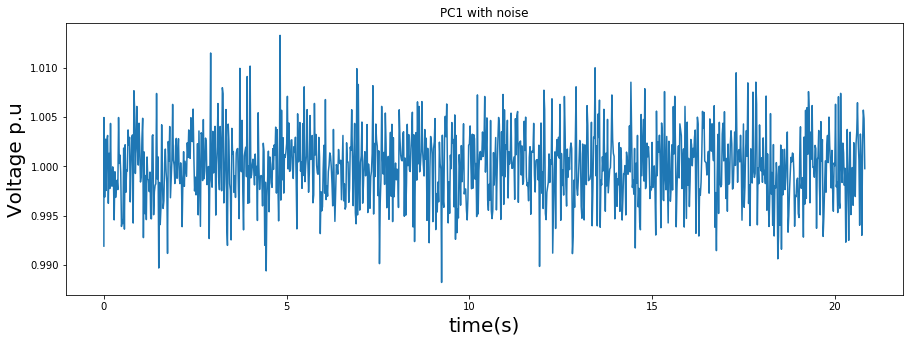

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


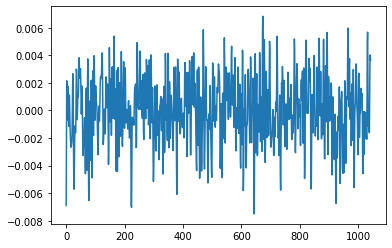

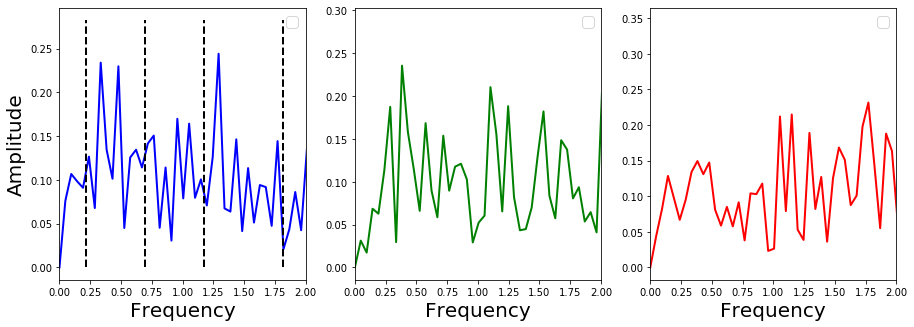

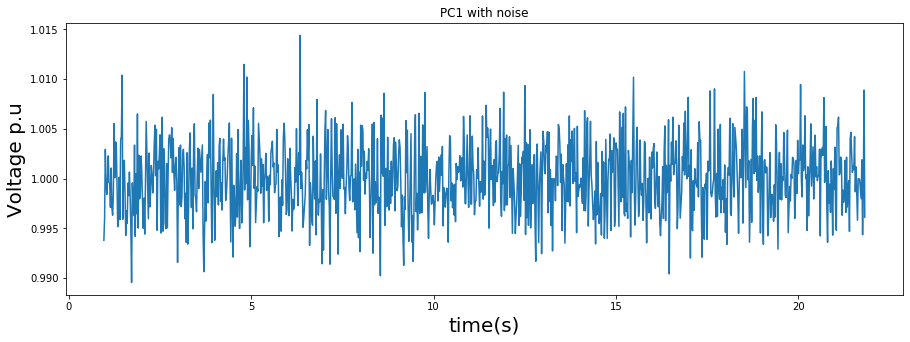

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


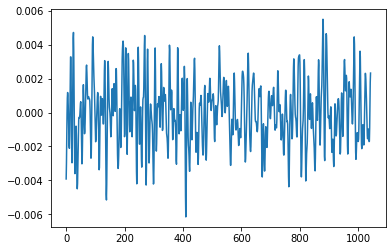

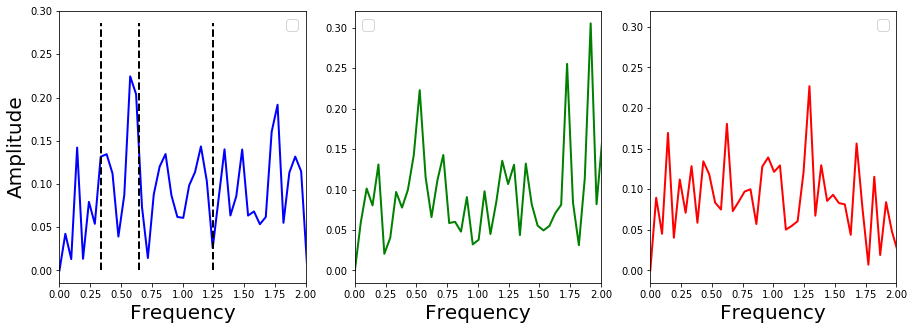

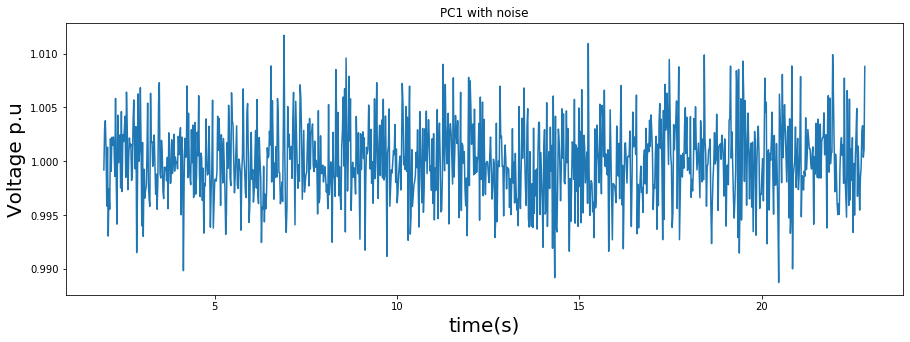

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


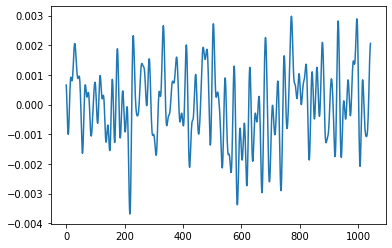

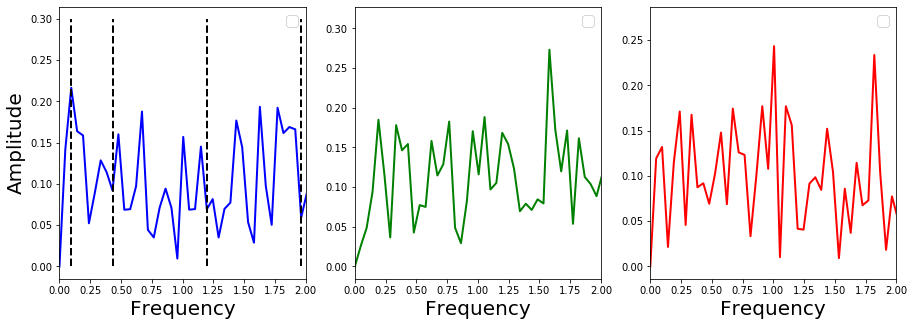

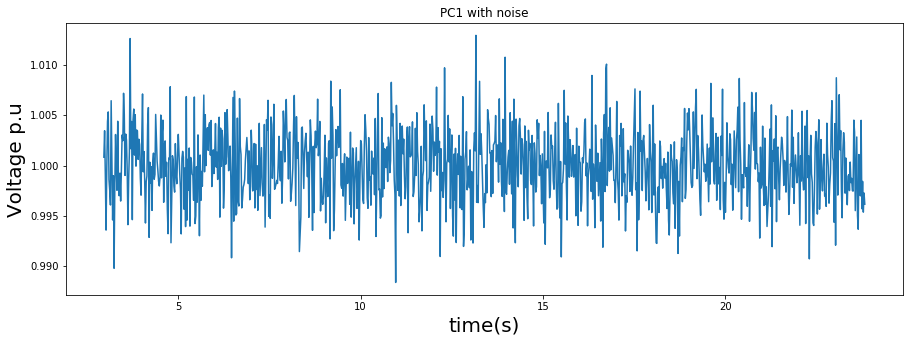

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


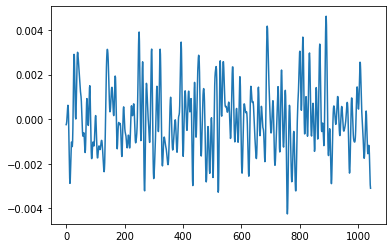

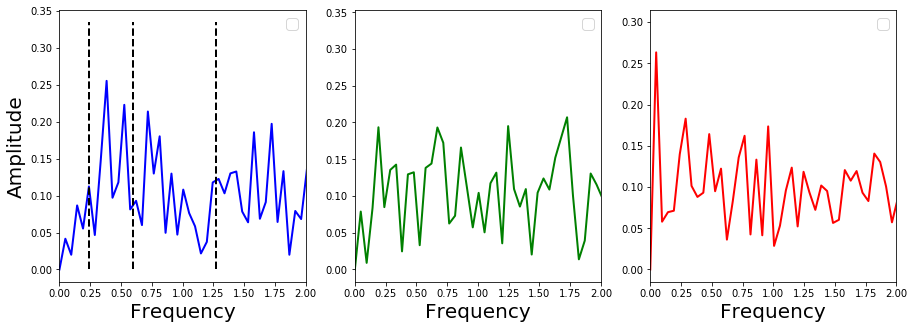

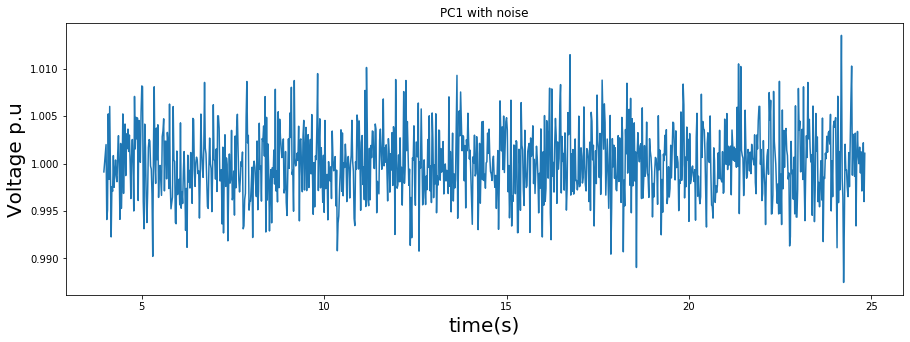

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 1


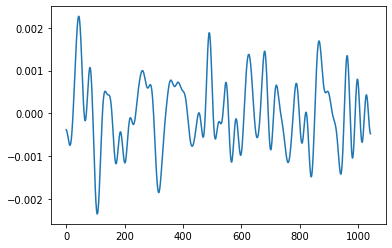

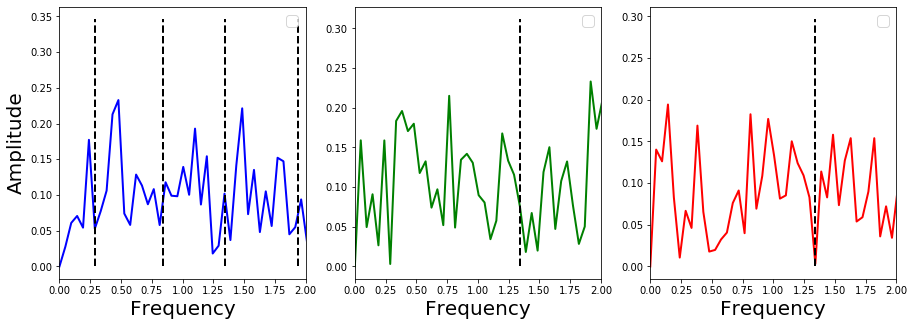

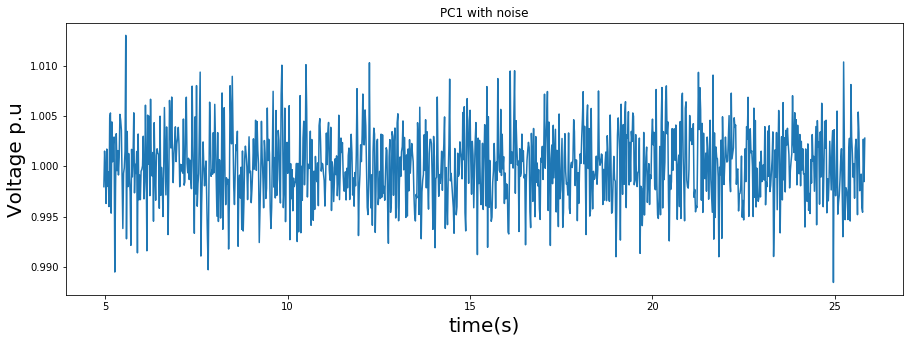

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


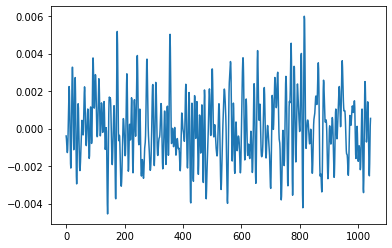

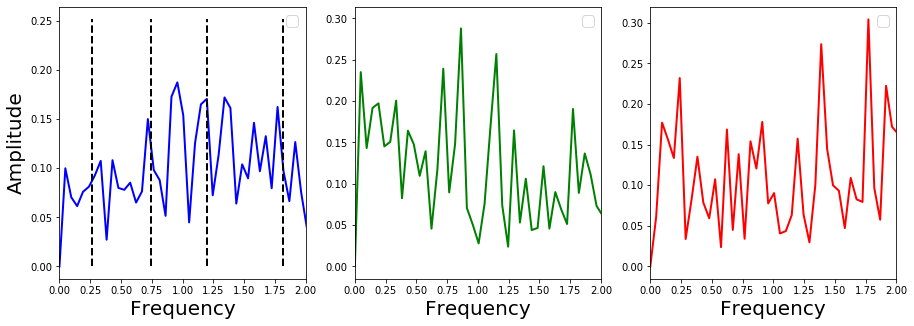

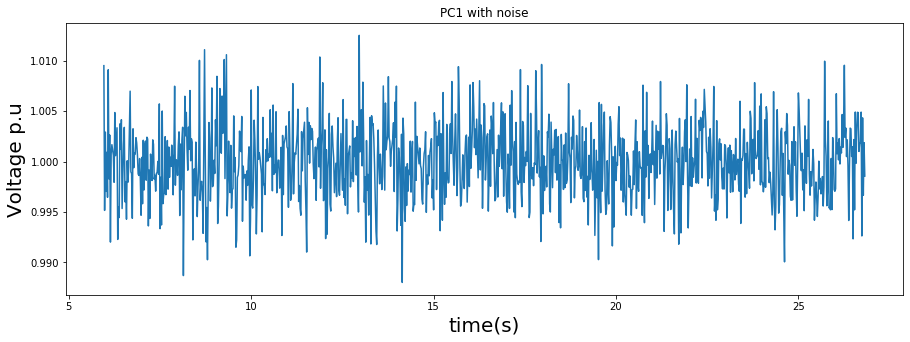

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


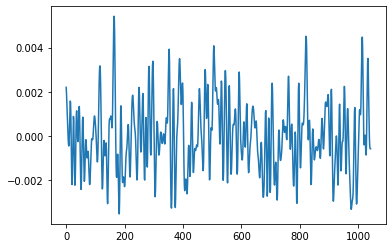

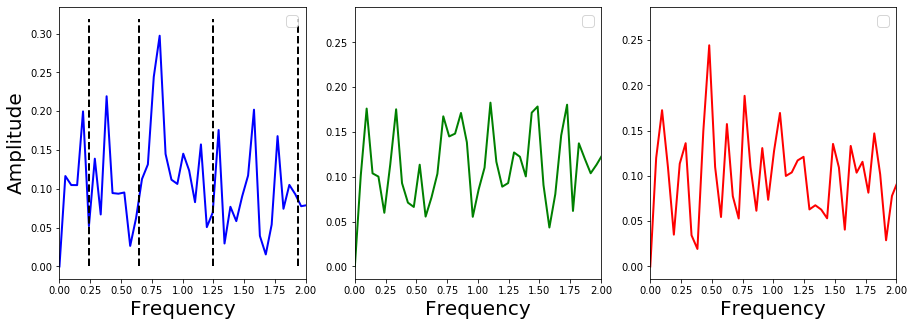

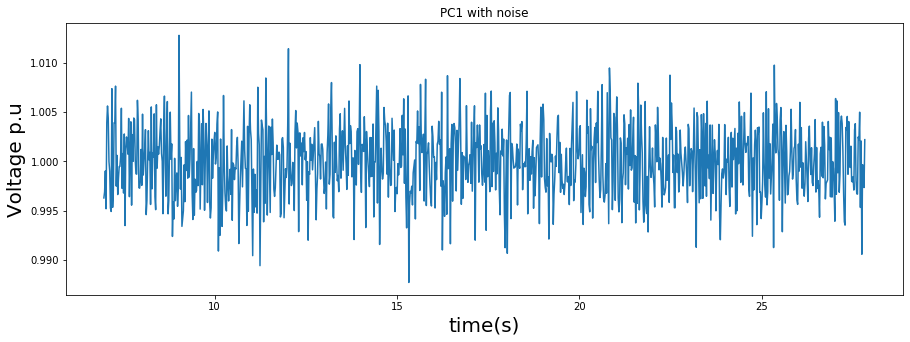

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 1


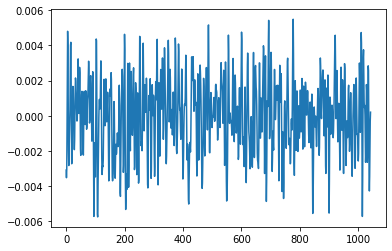

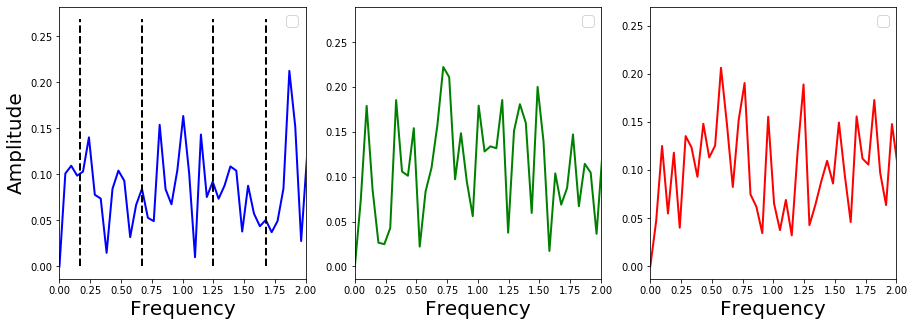

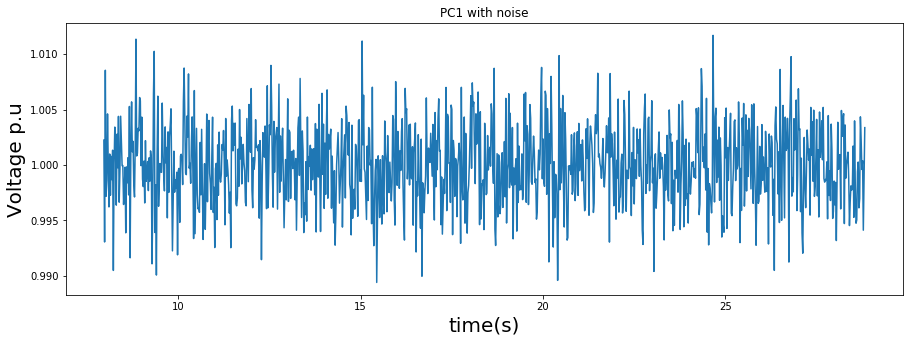

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


N 1


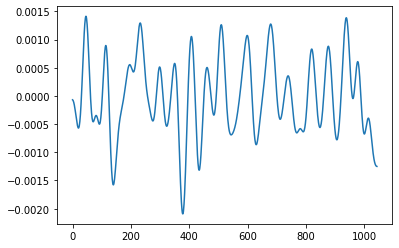

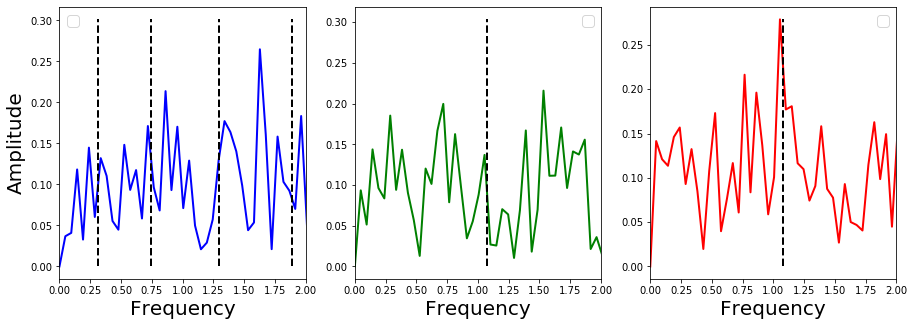

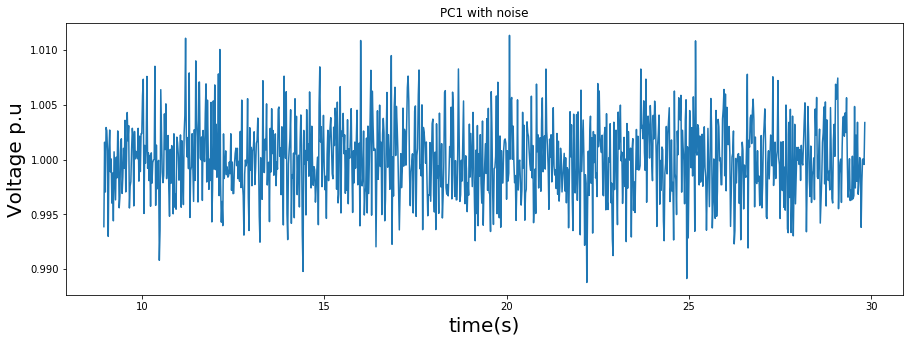

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


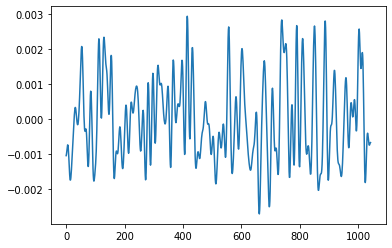

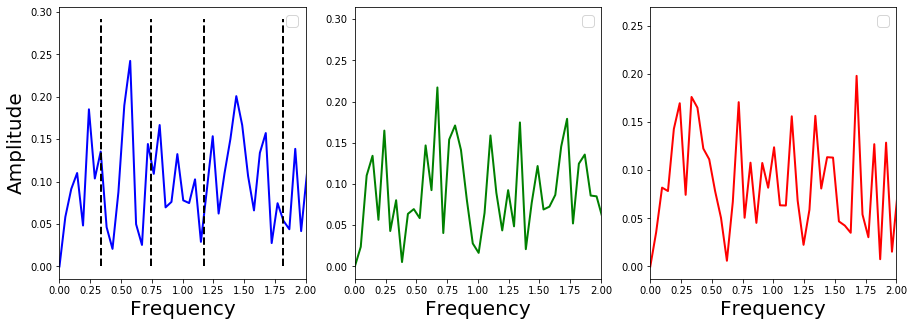

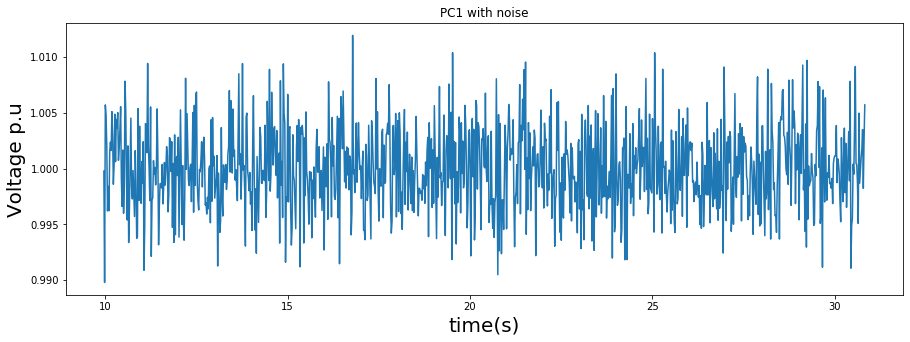

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 1


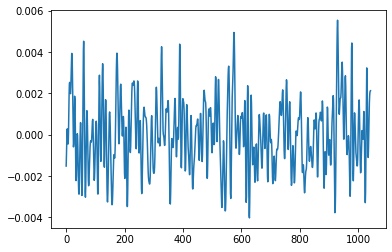

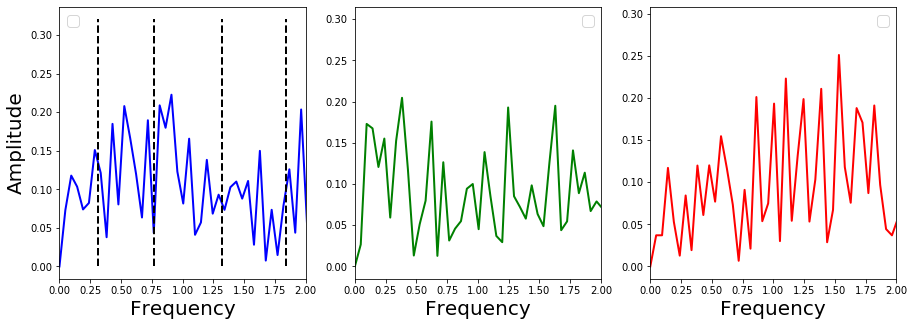

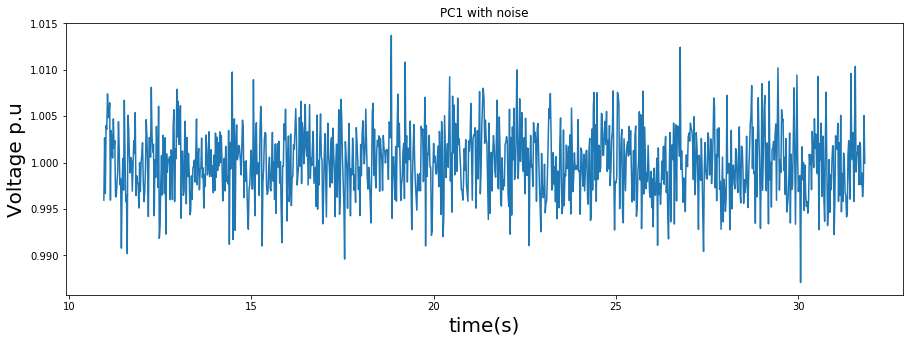

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


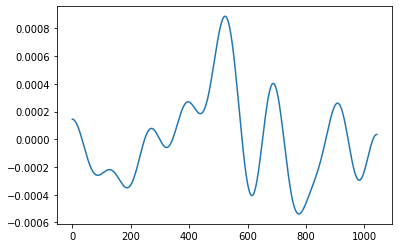

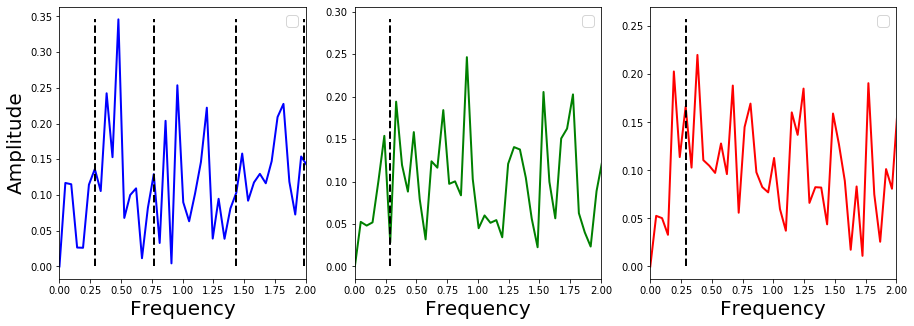

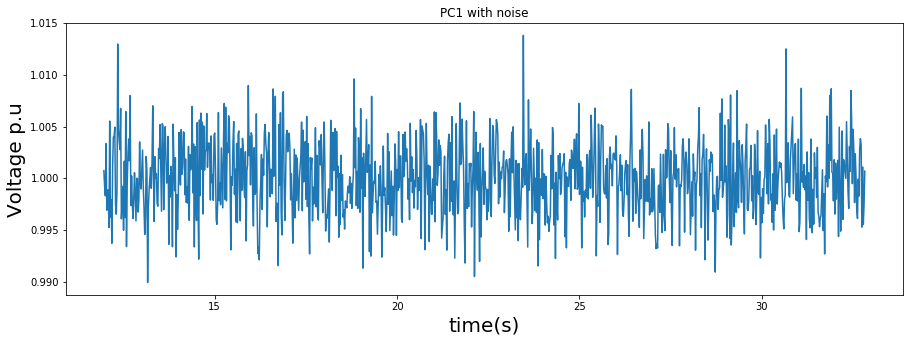

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 1


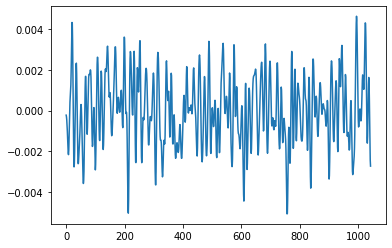

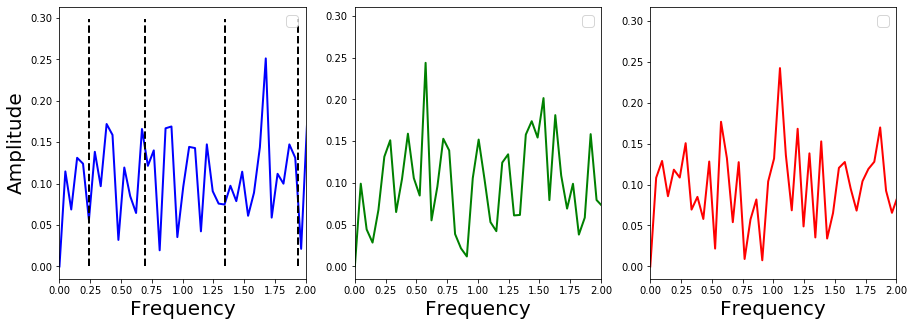

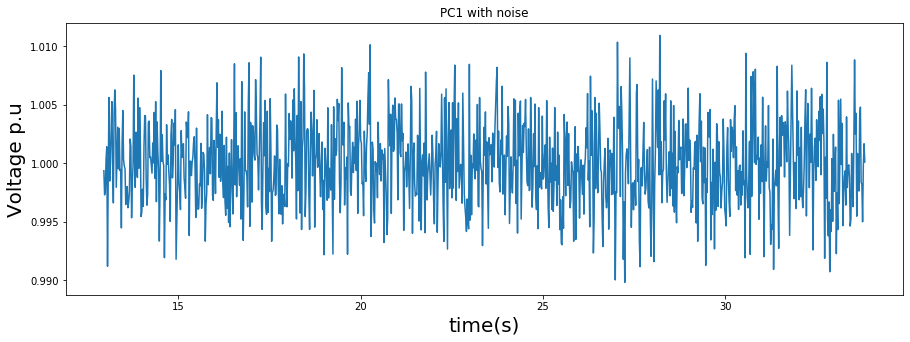

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


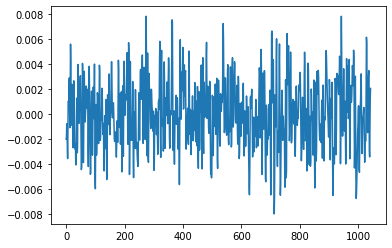

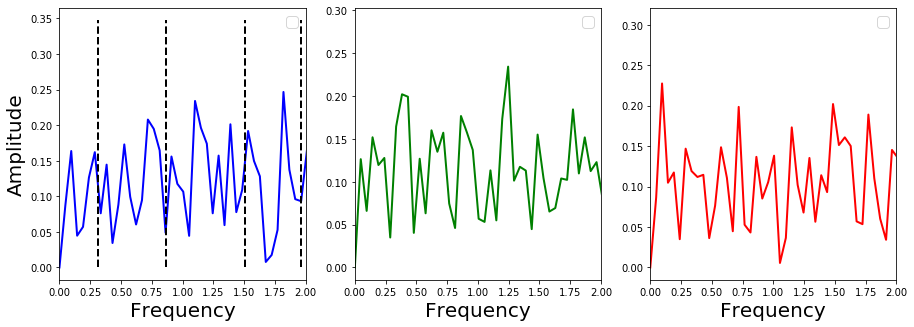

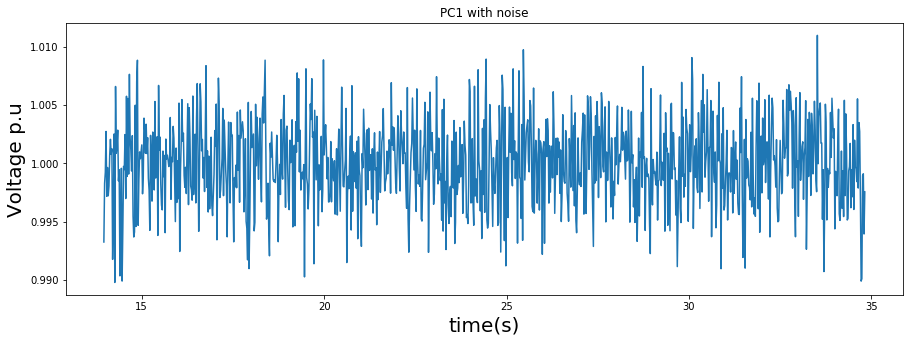

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


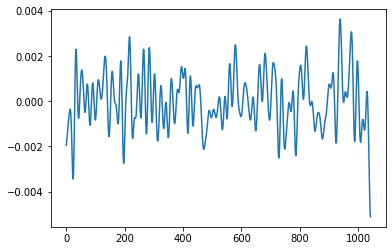

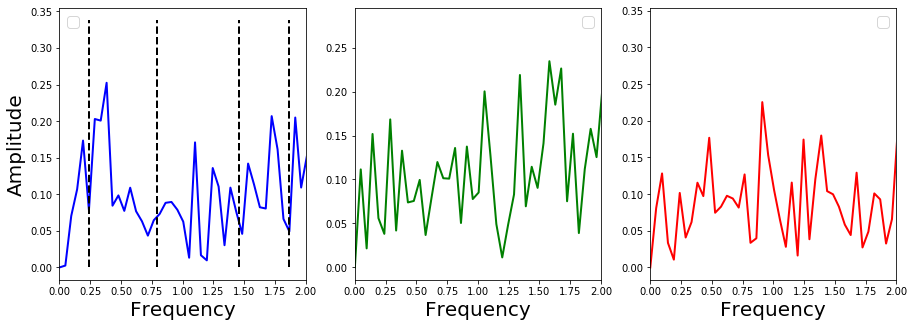

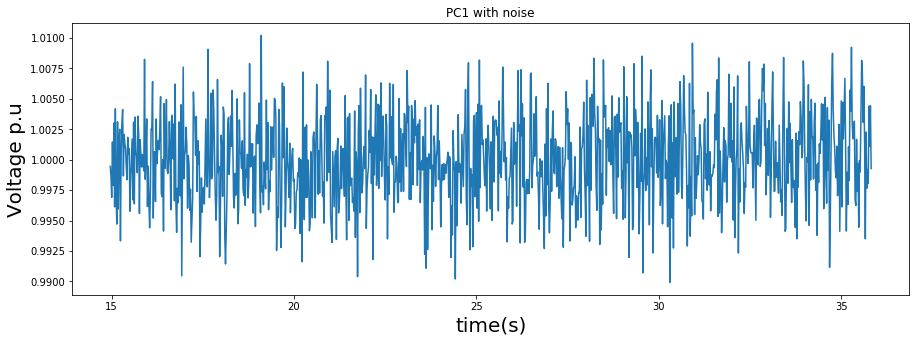

ll: 13
kd 41
o 1
N 41
ll: 13


No handles with labels found to put in legend.


kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.


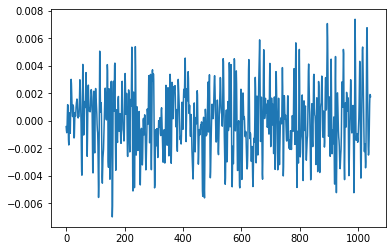

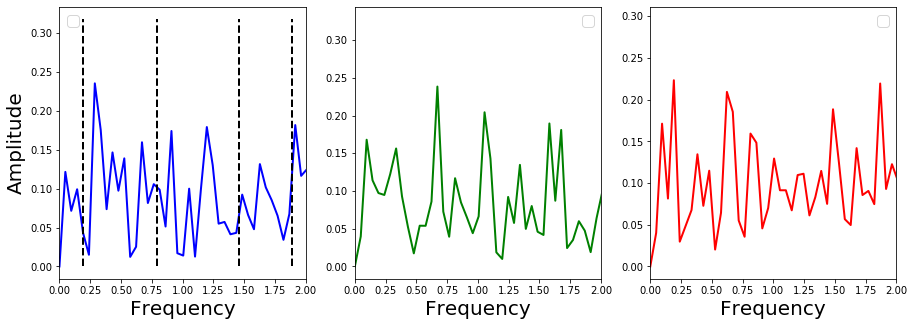

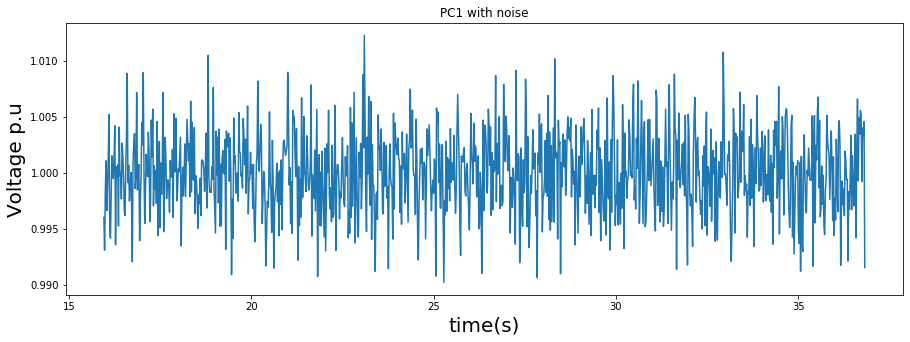

ll: 13
kd 41
o 1
N 41
ll: 13


No handles with labels found to put in legend.


kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.


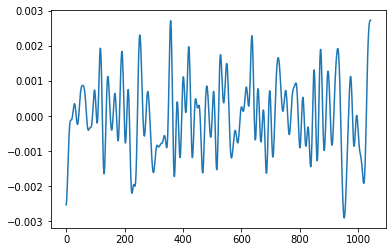

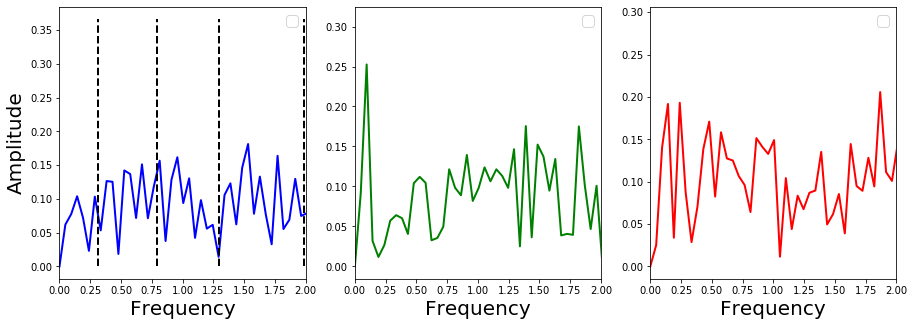

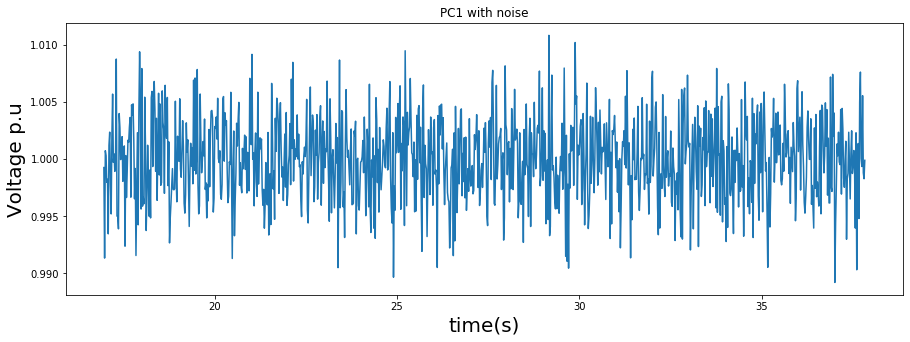

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


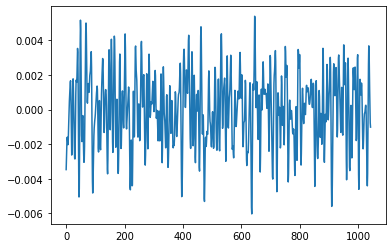

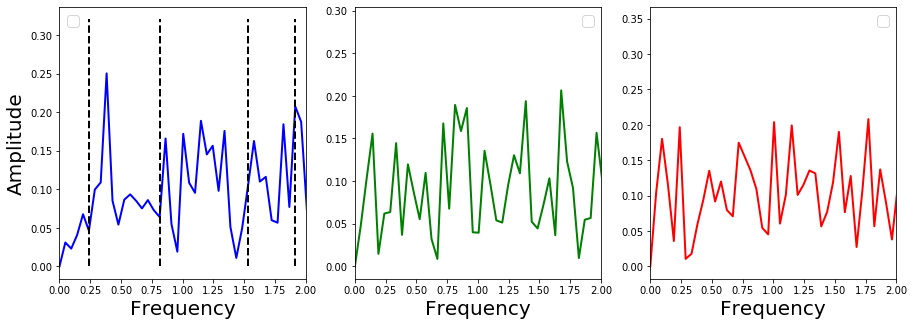

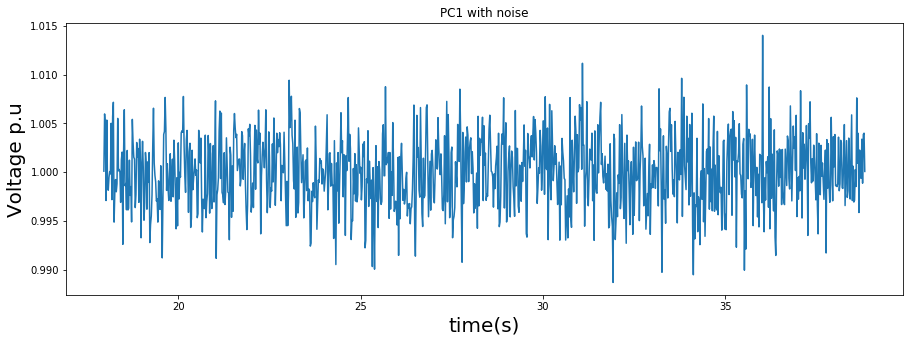

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 1


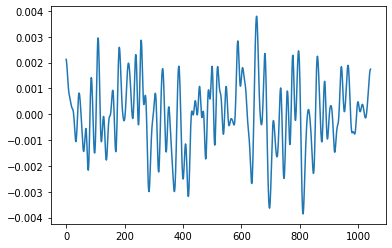

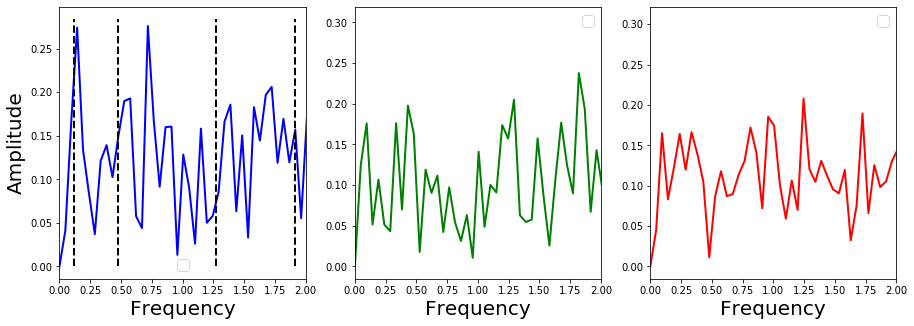

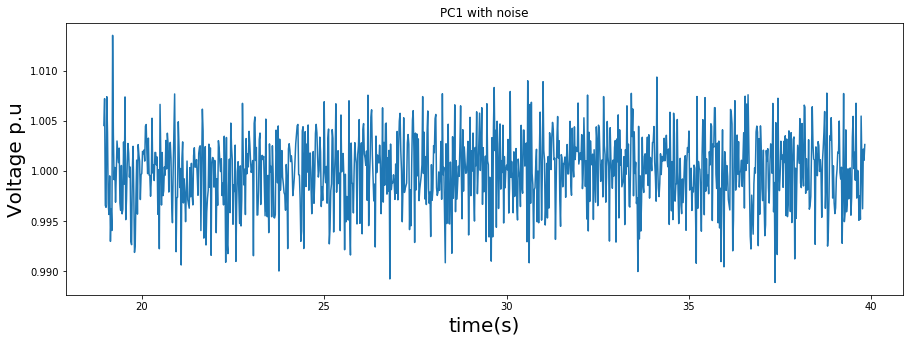

ll: 13
kd 41
o 1
N 41
ll: 13


No handles with labels found to put in legend.


kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.


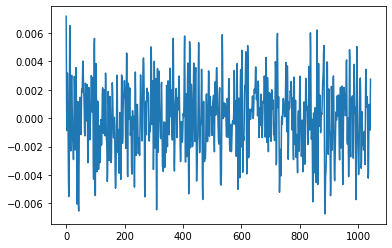

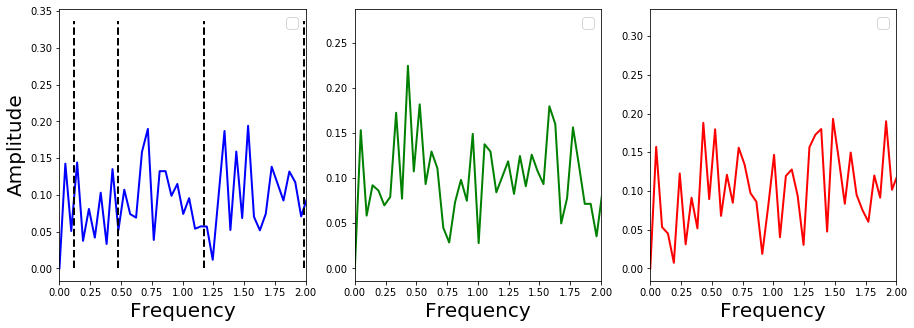

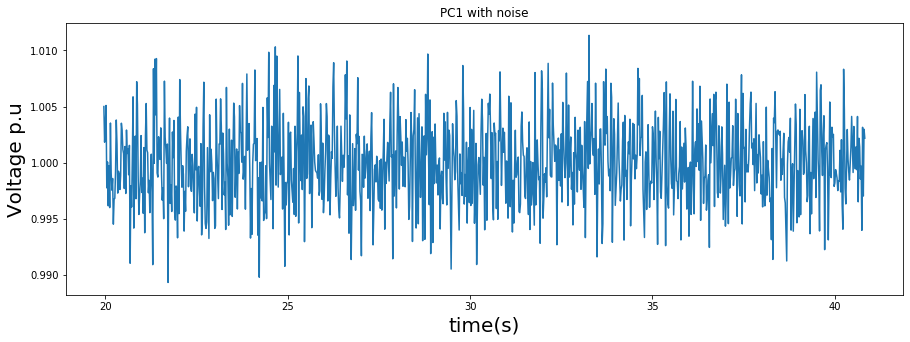

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


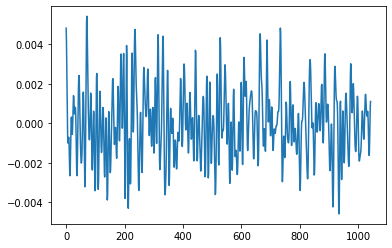

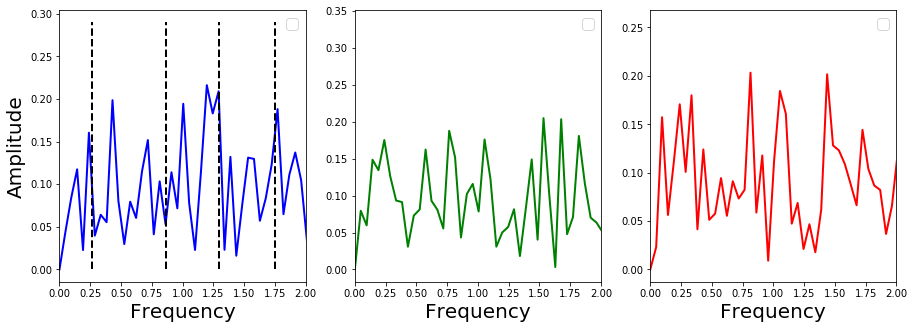

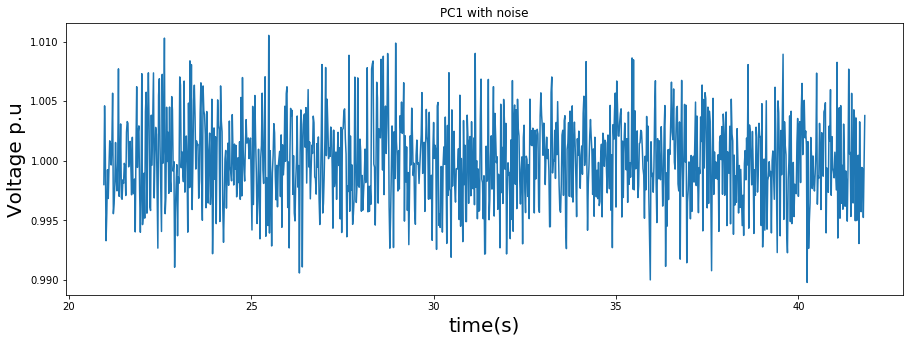

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 1


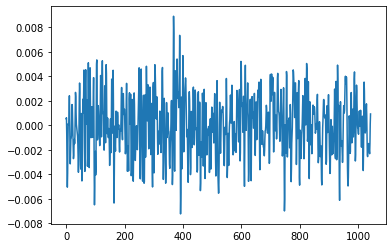

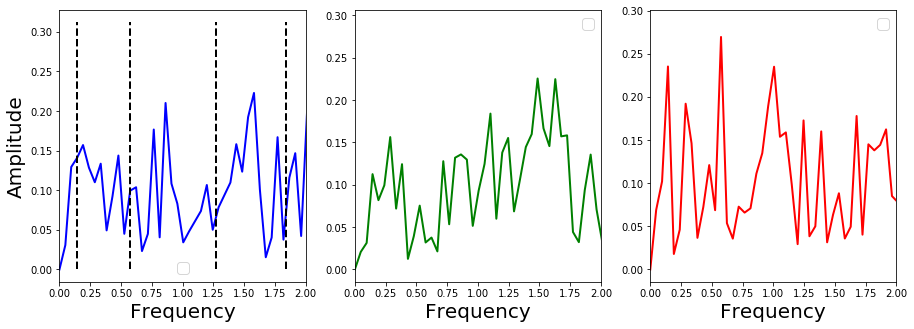

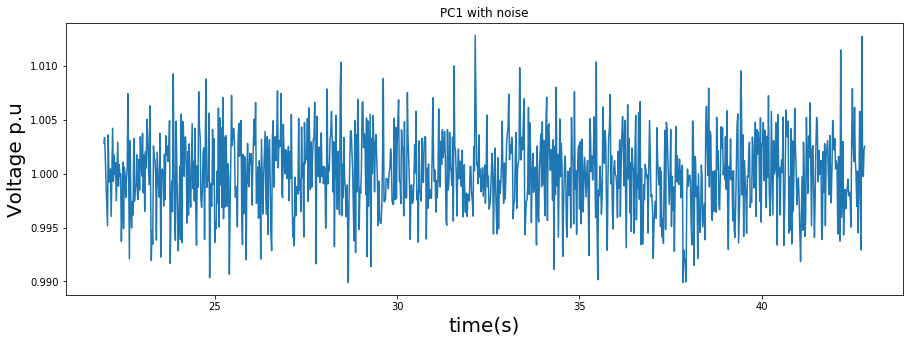

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


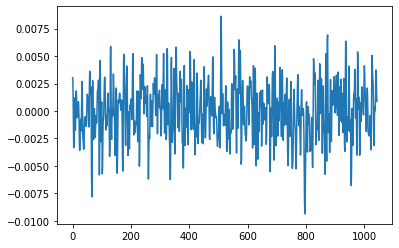

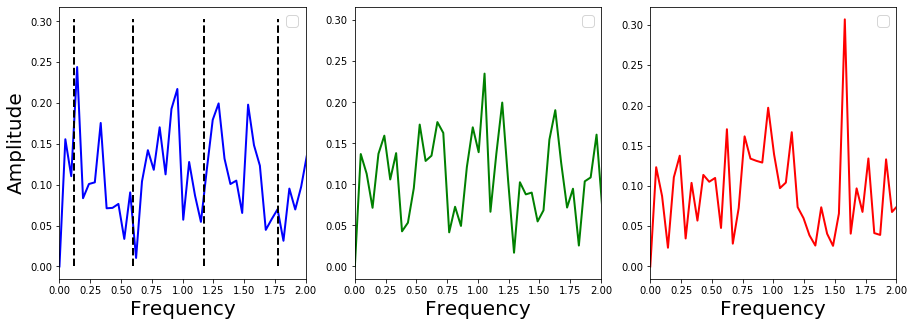

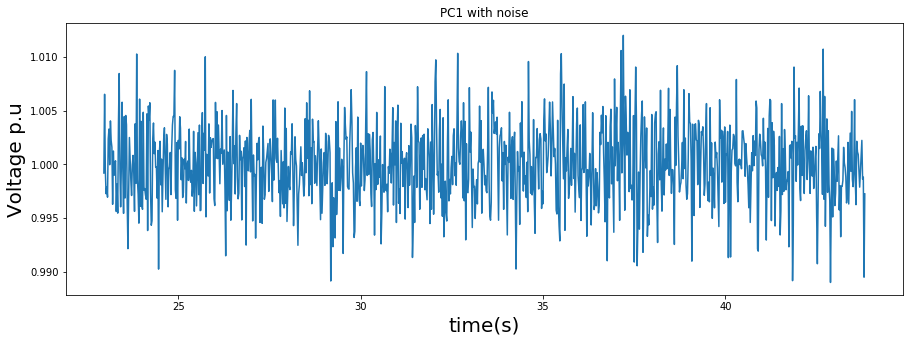

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 1


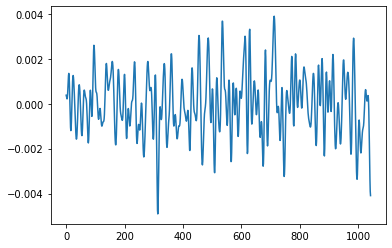

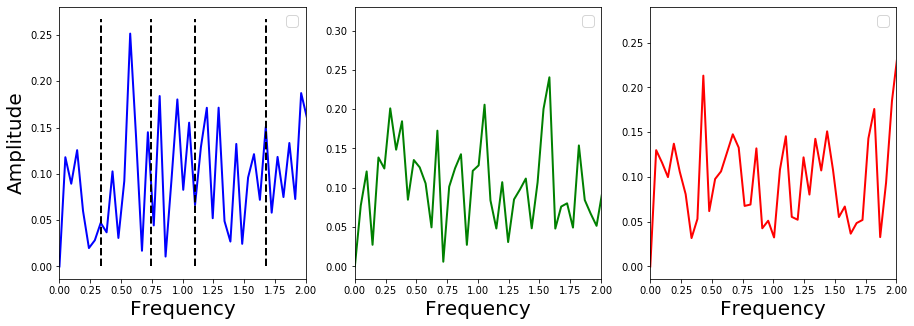

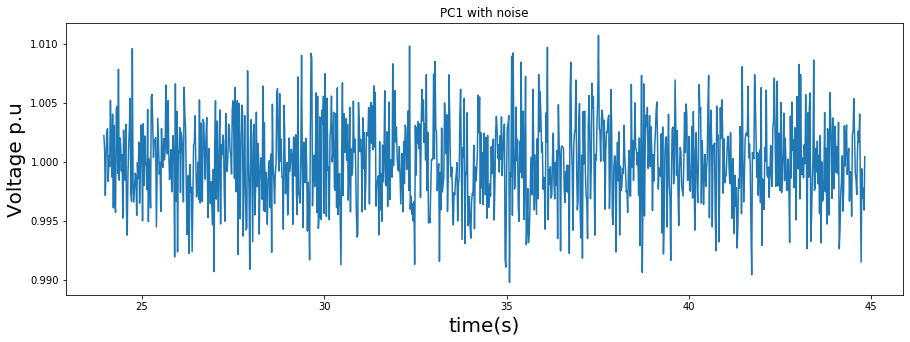

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 1


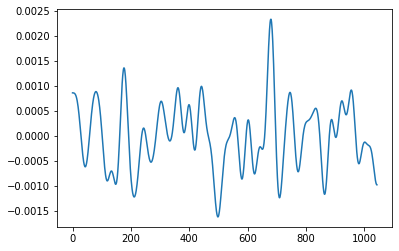

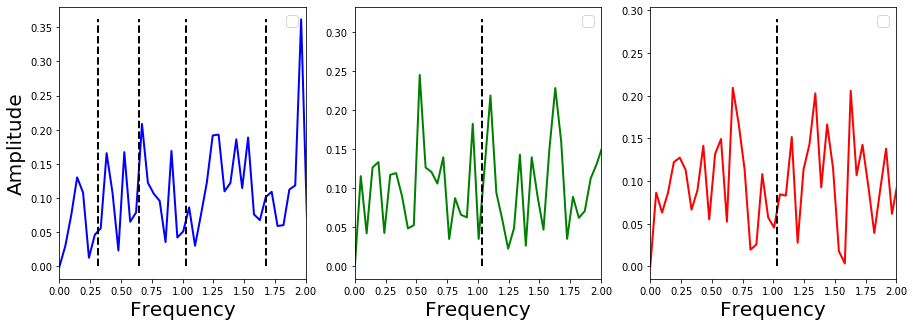

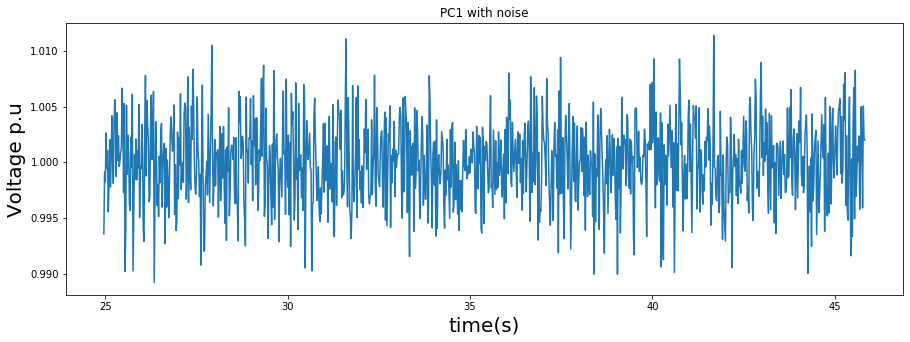

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 1


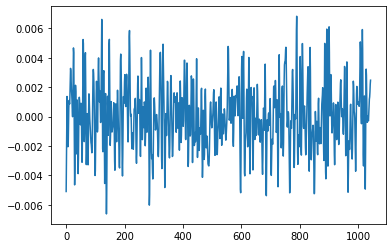

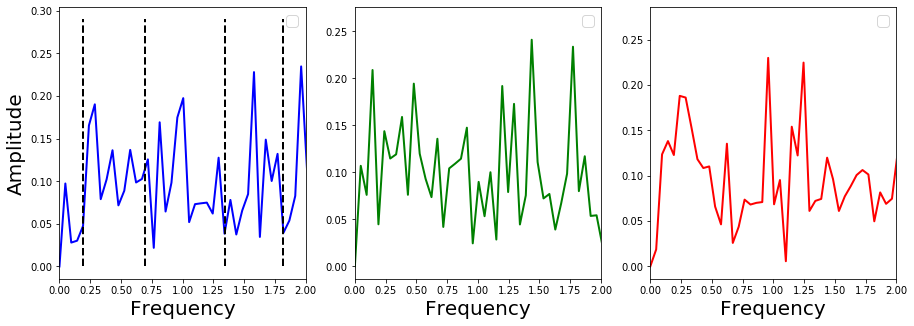

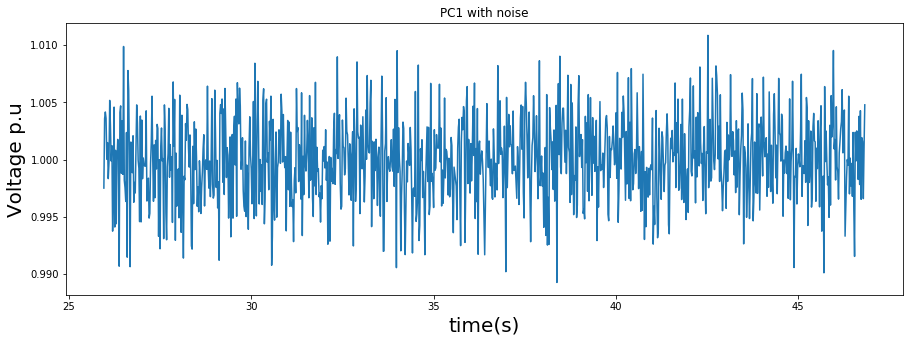

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 1


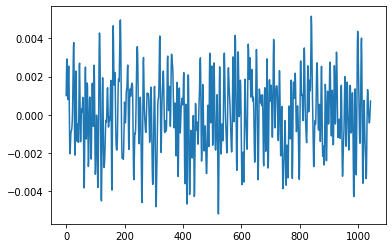

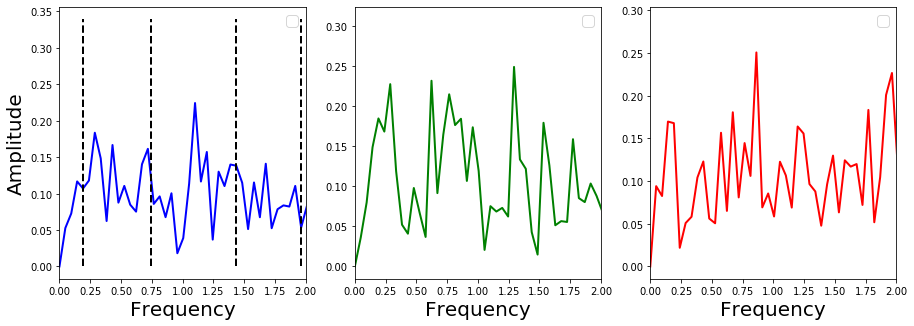

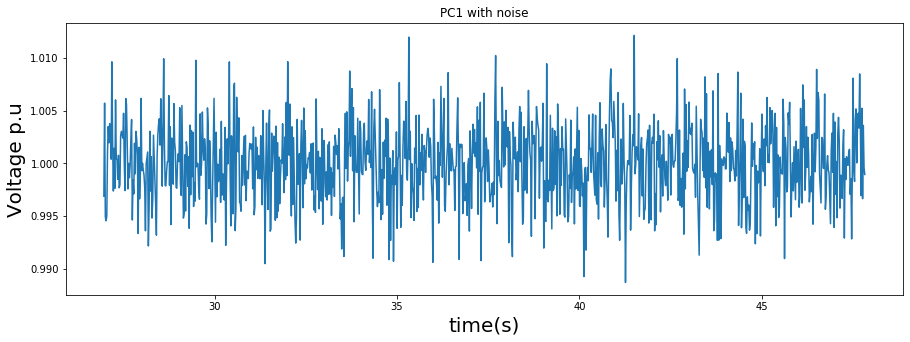

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


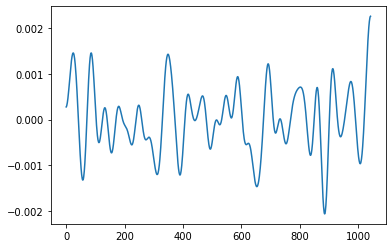

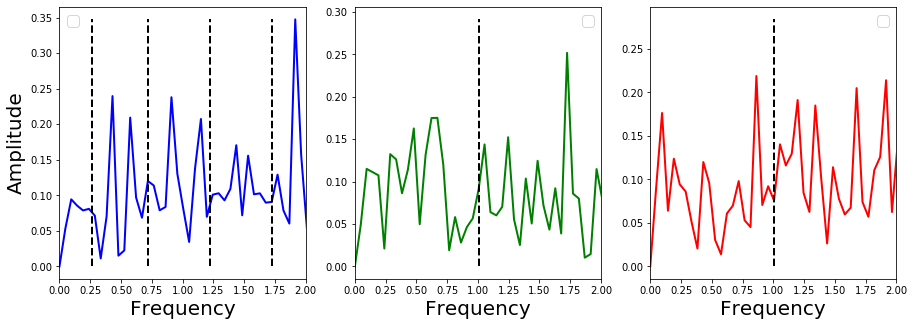

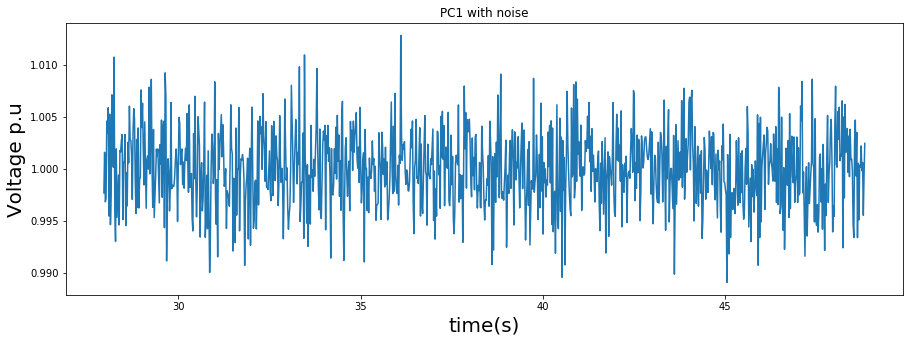

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


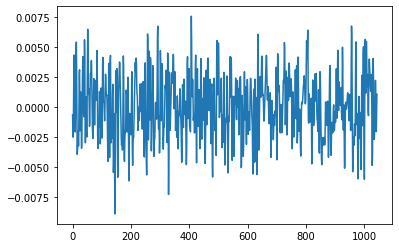

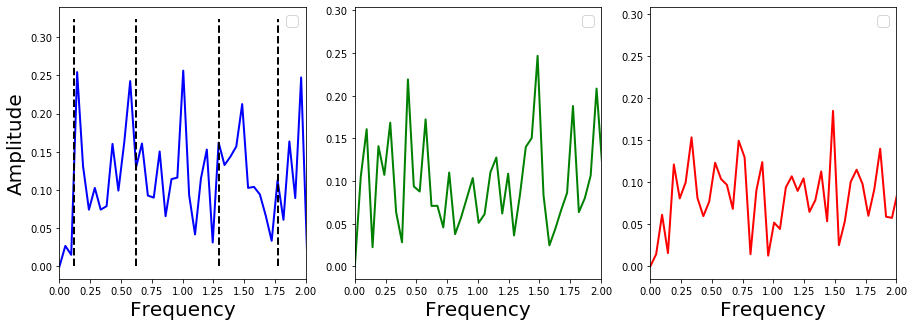

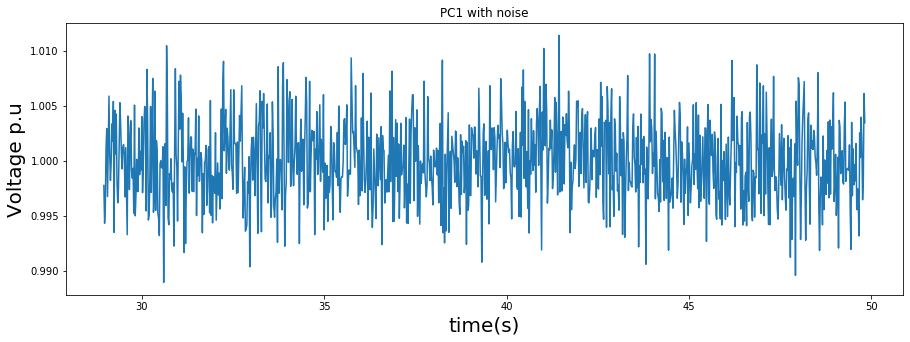

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


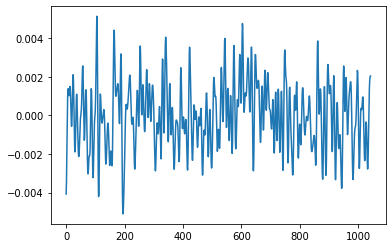

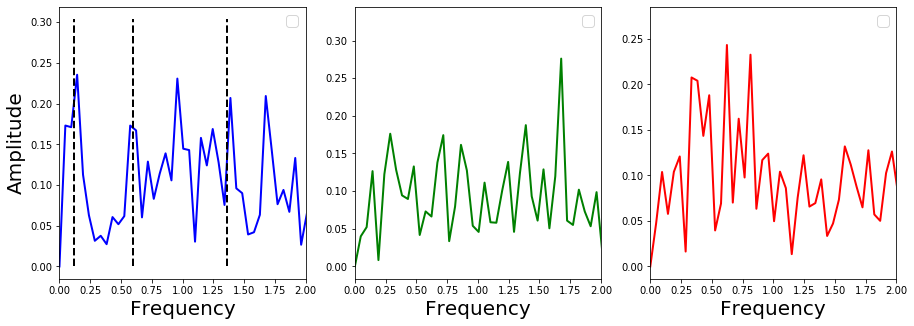

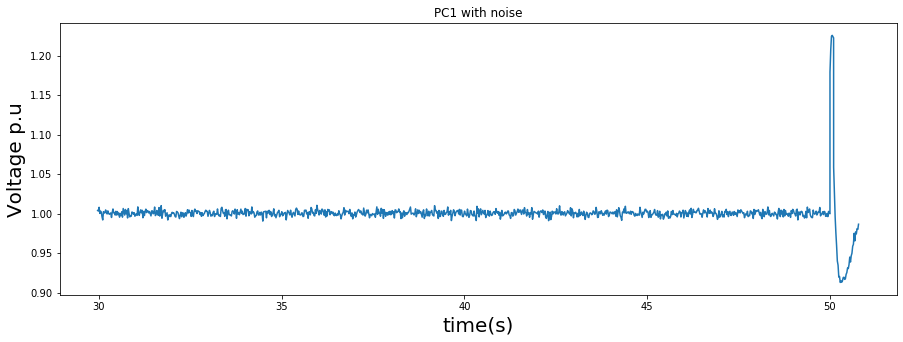

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 10
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 8


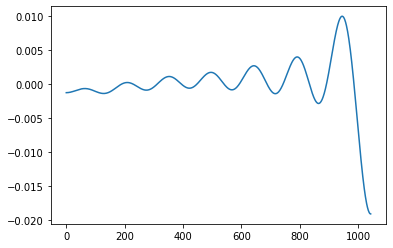

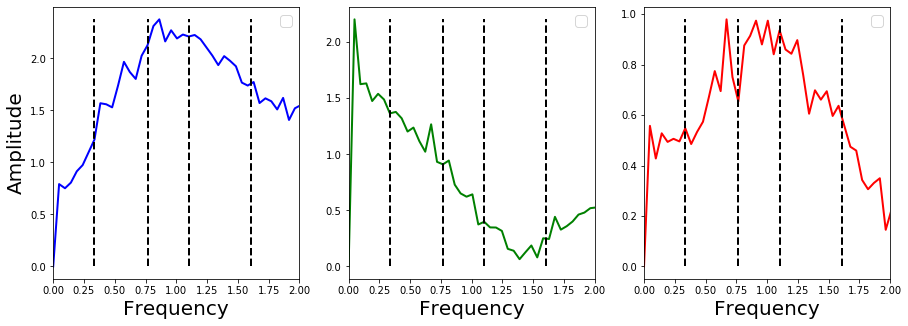

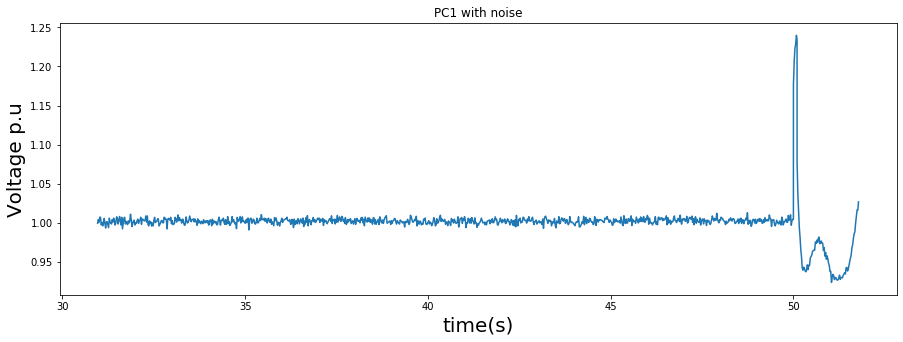

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 10
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 8


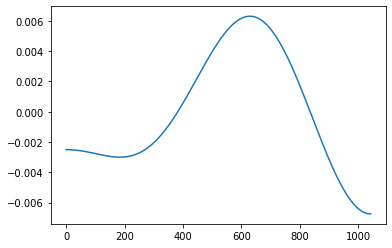

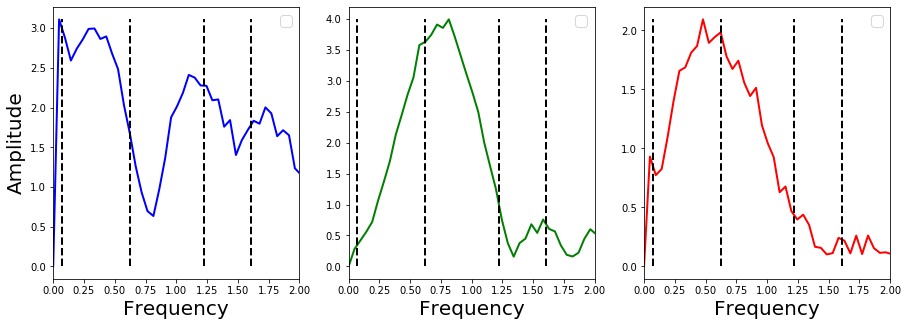

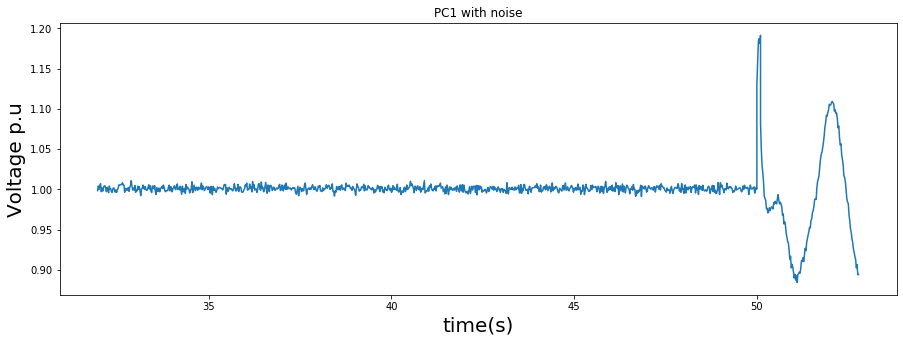

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 11
ll: 13
kd 41
o 1
N 8


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


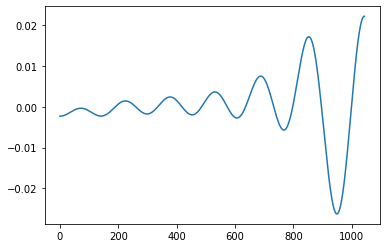

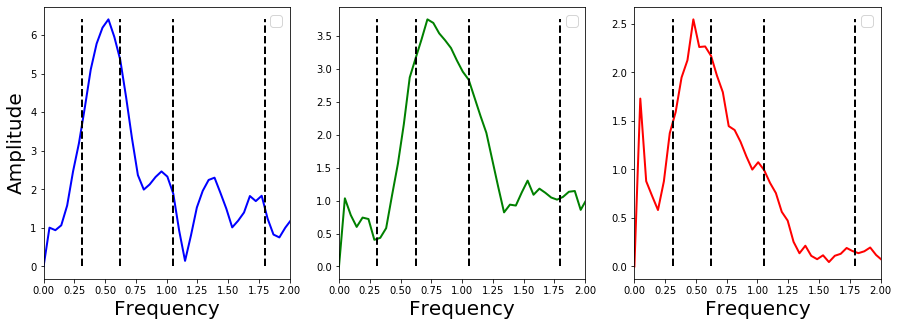

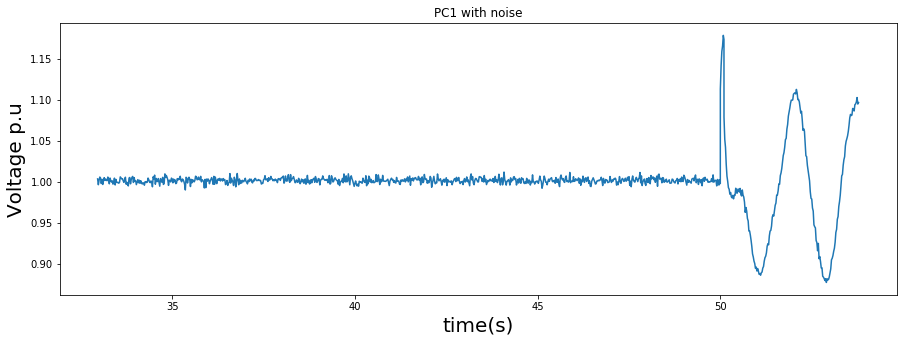

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 10
ll: 13
kd 41
o 1
N 7


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


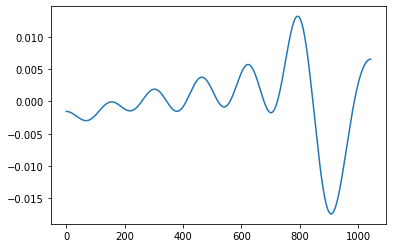

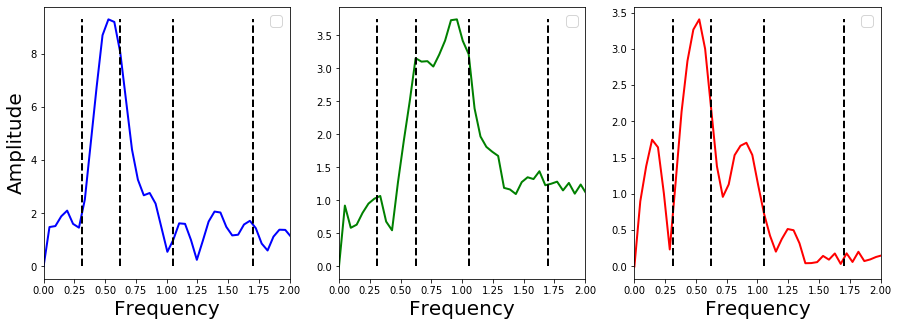

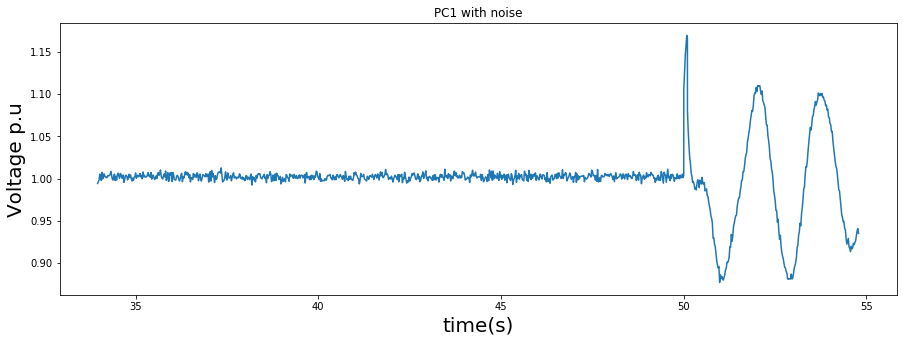

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13
kd 41
o 1
N 7


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


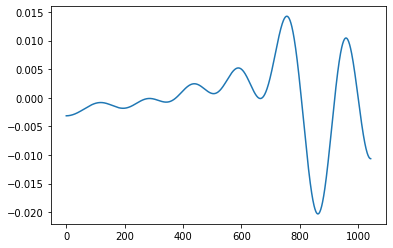

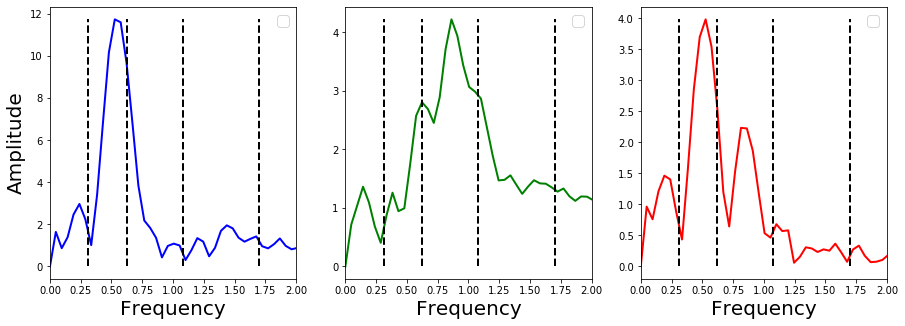

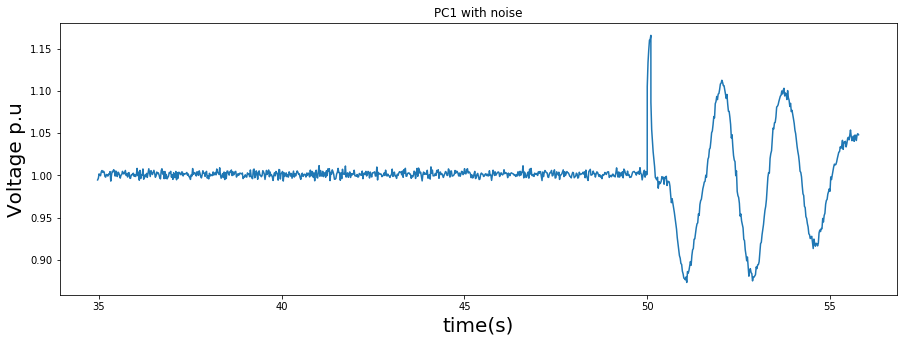

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 6


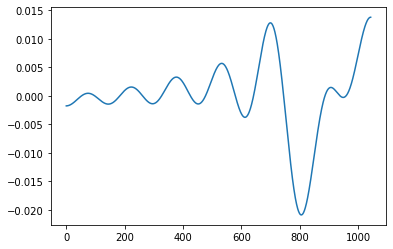

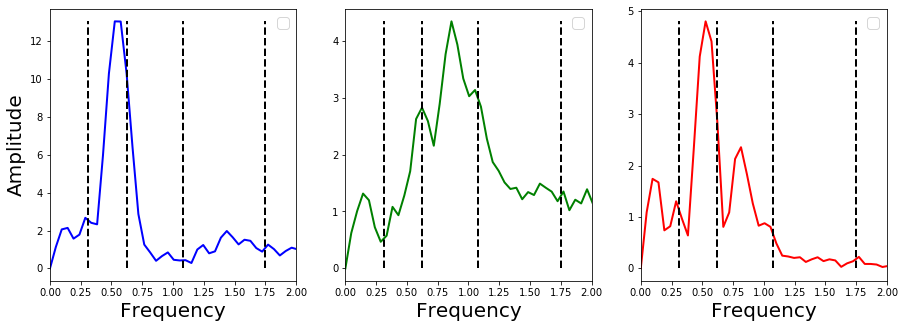

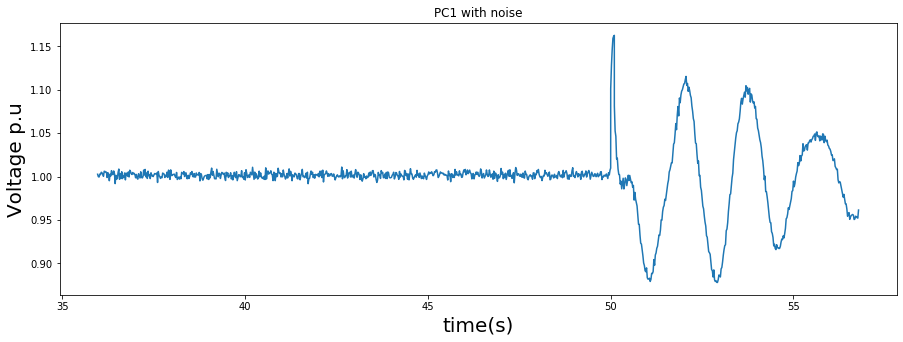

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 9
ll: 13
kd 41
o 1
N 6


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


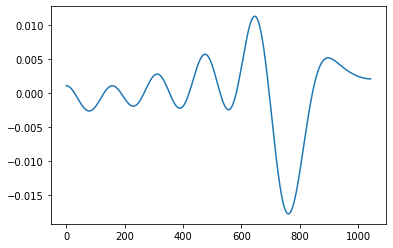

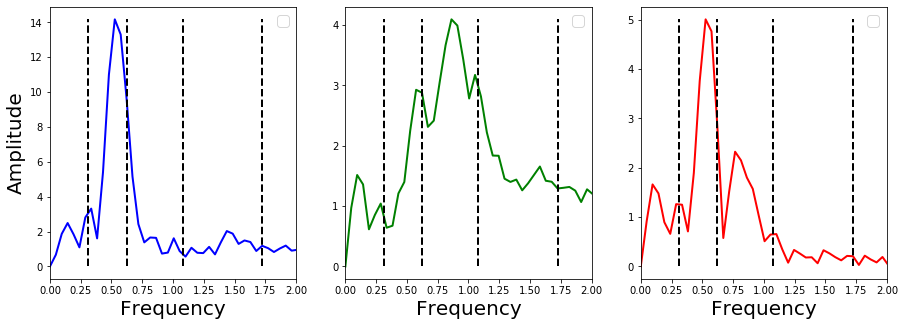

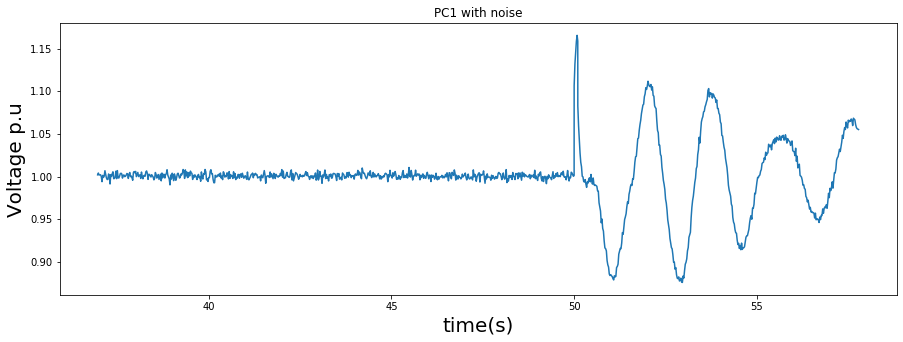

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13
kd 41
o 1
N 7


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


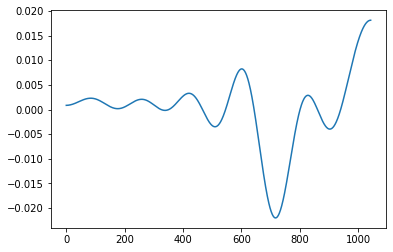

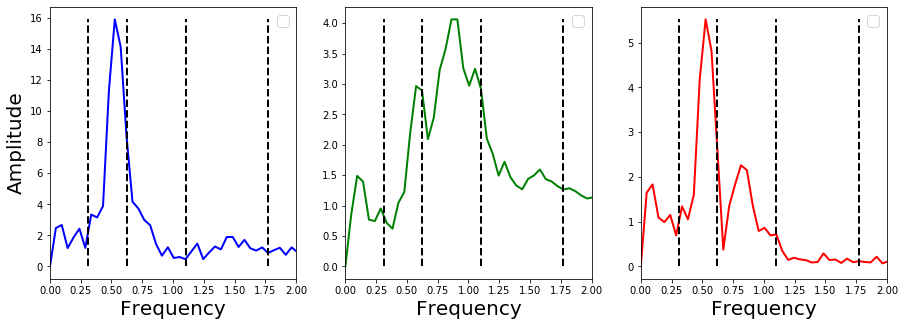

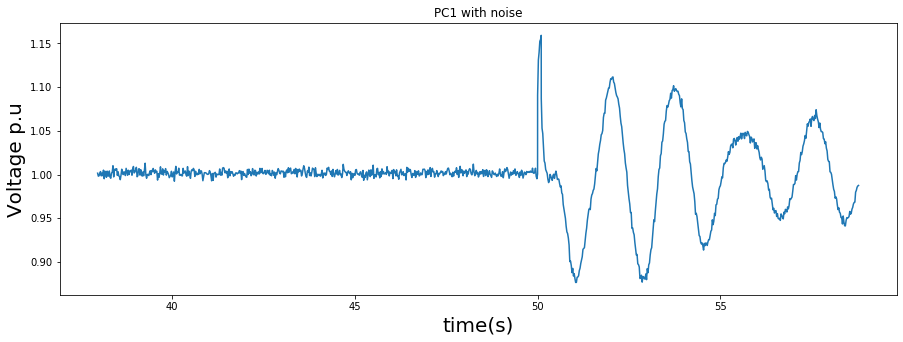

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13
kd 41
o 1
N 5


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


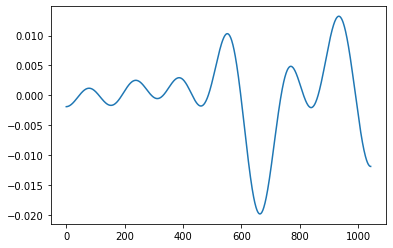

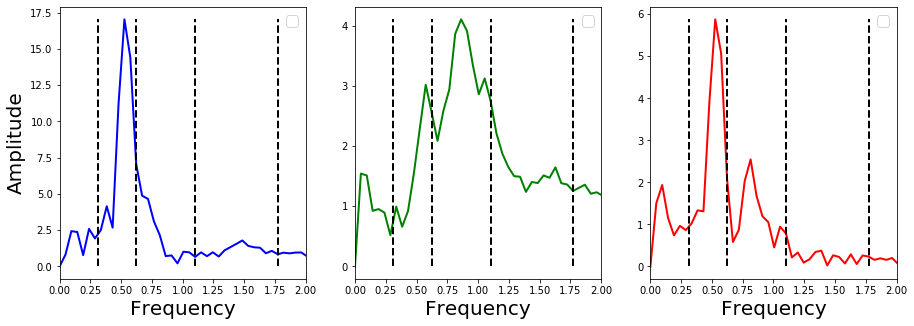

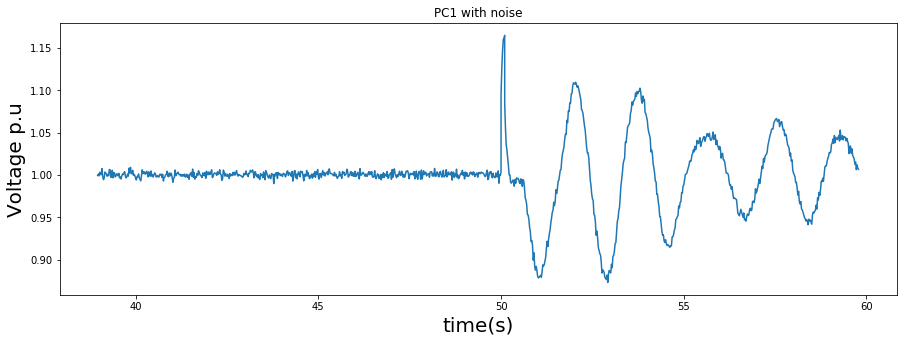

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 7
ll: 13
kd 41
o 1
N 6


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


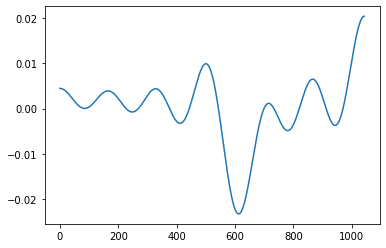

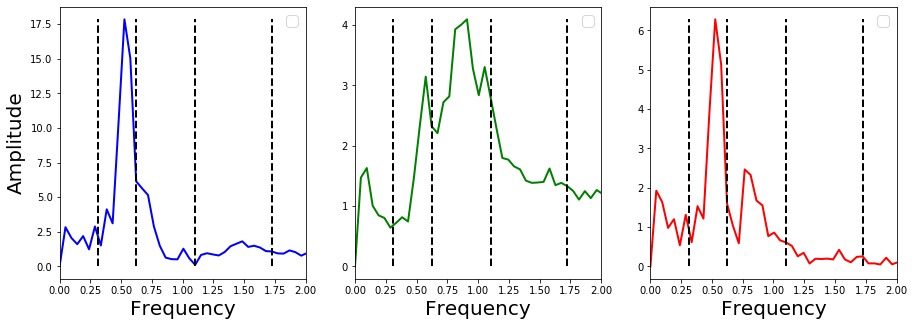

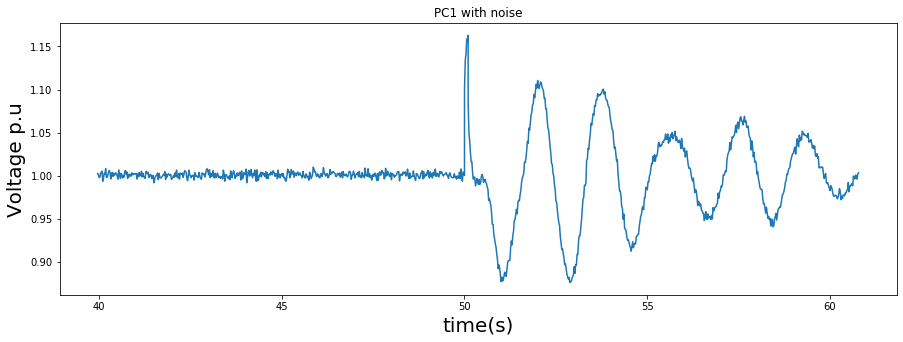

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 5


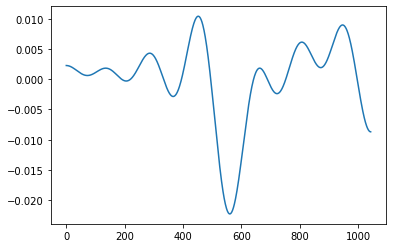

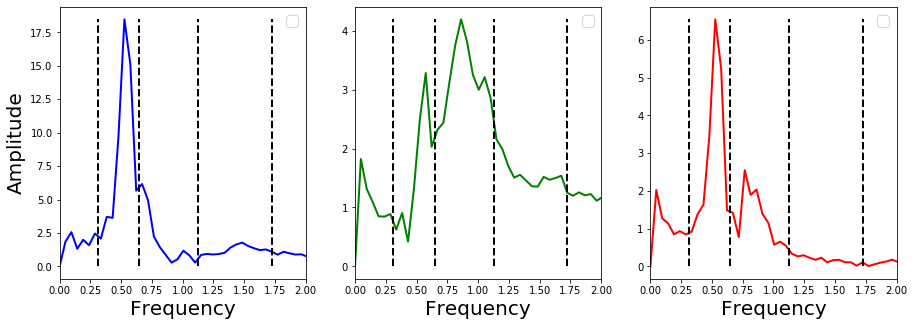

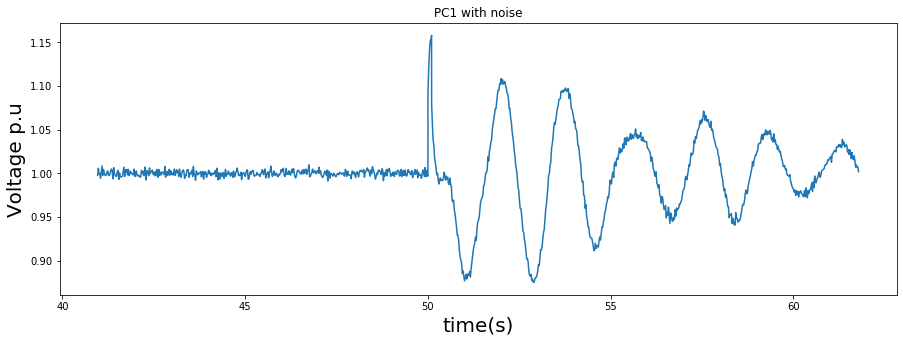

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 7
ll: 13
kd 41
o 1
N 5


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


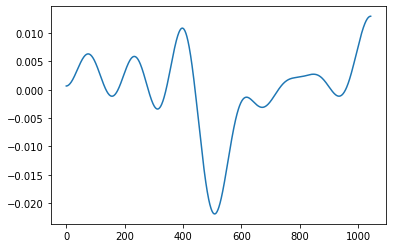

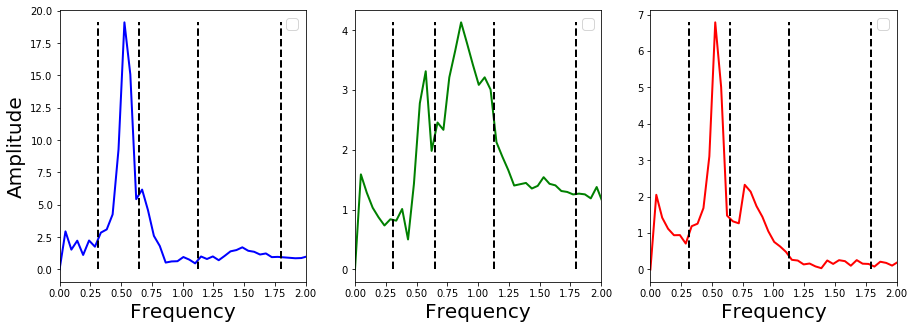

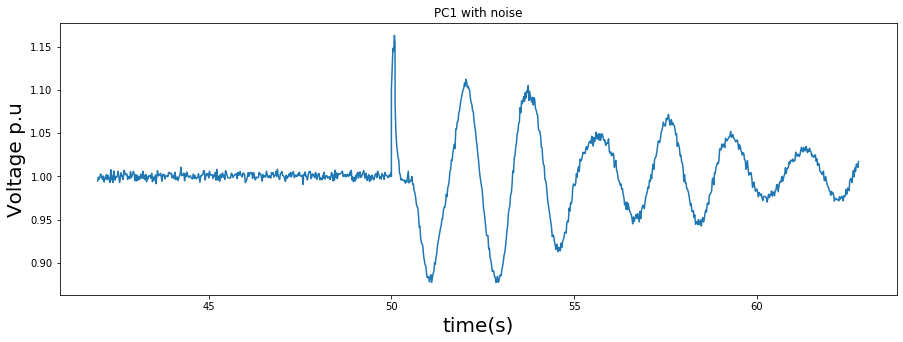

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 7
ll: 13
kd 41
o 1
N 6


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


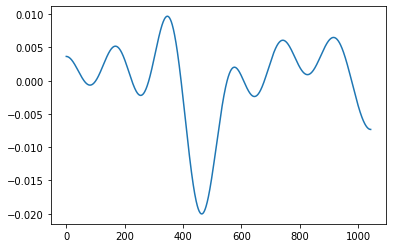

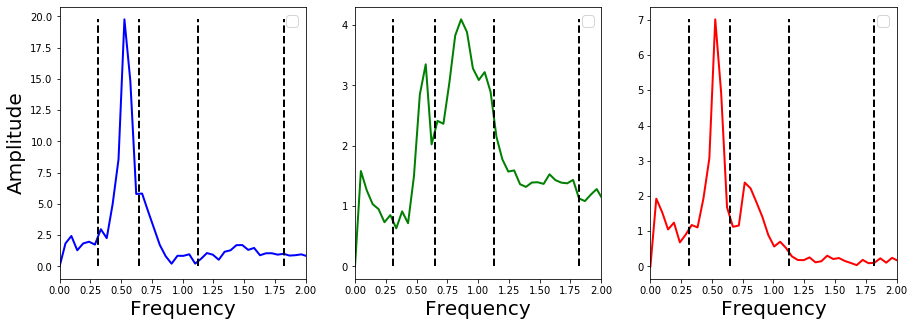

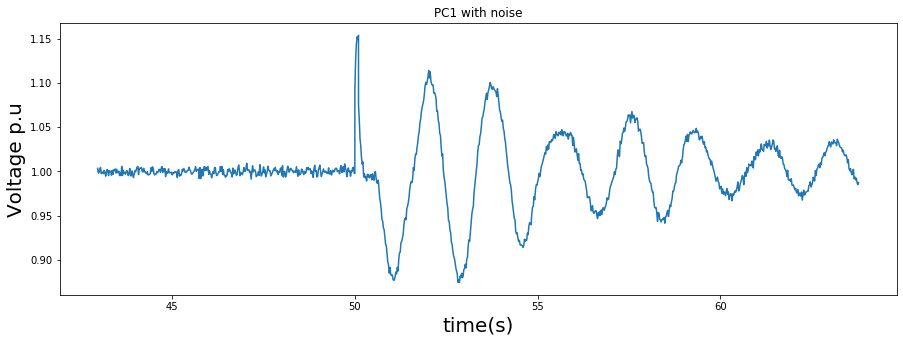

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13
kd 41
o 1
N 6


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


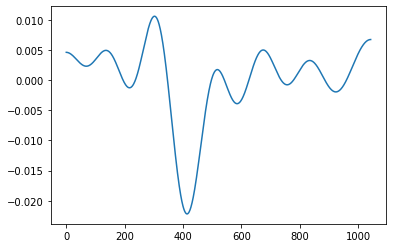

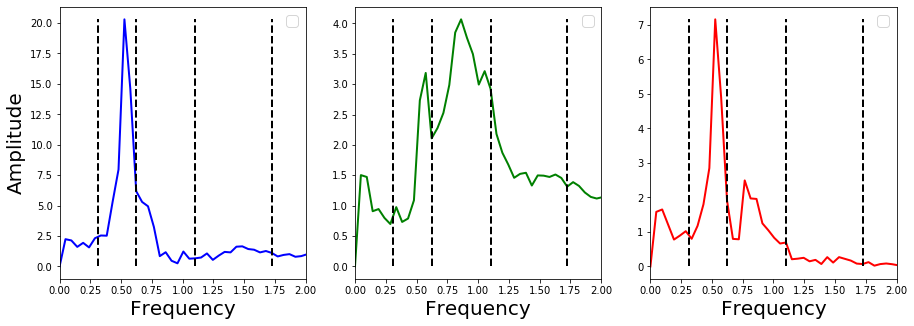

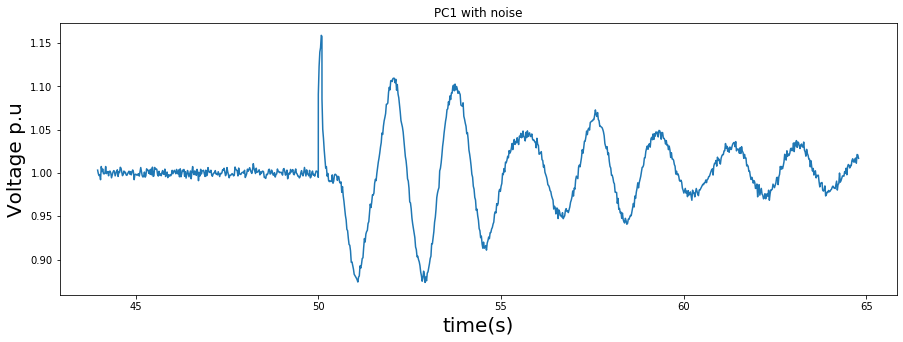

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 7
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 6


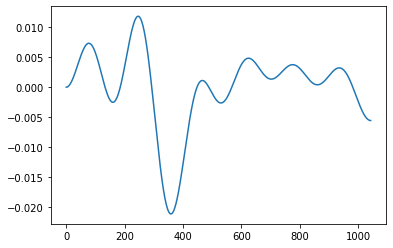

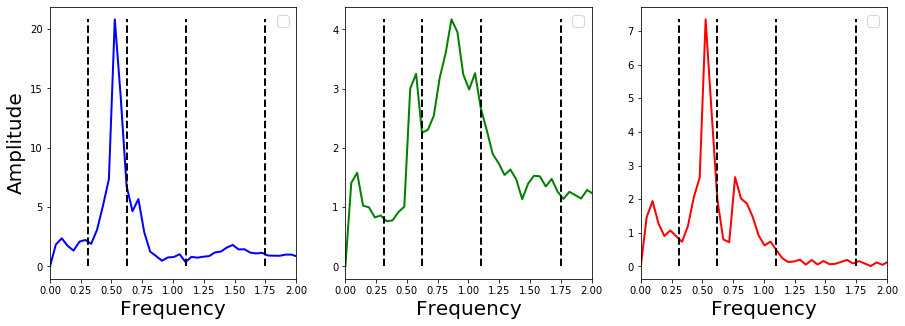

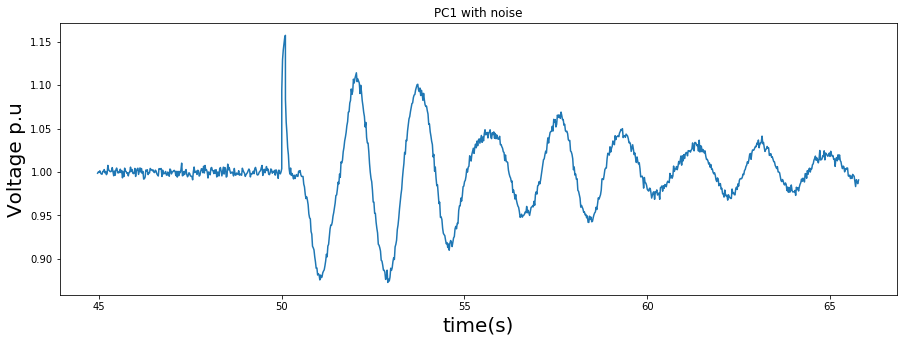

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13
kd 41
o 1
N 6


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


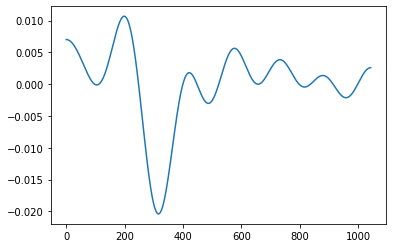

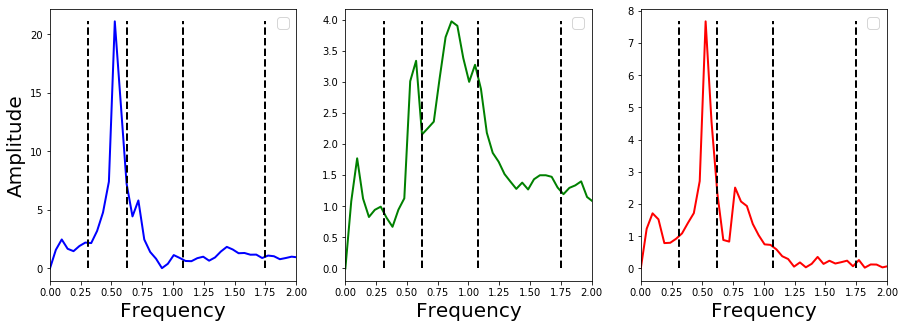

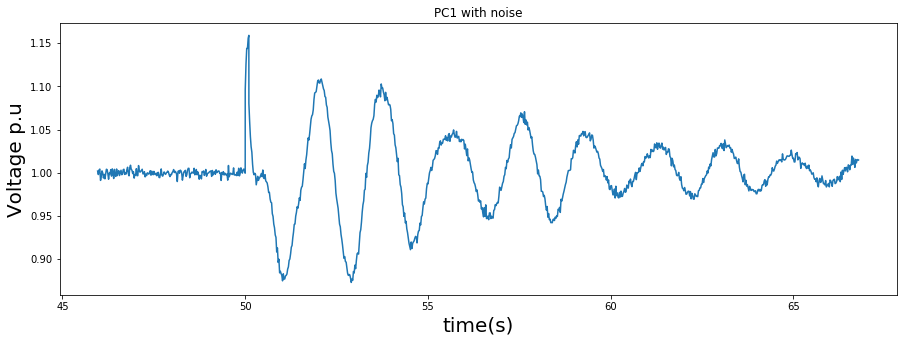

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13
kd 41
o 1
N 5


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


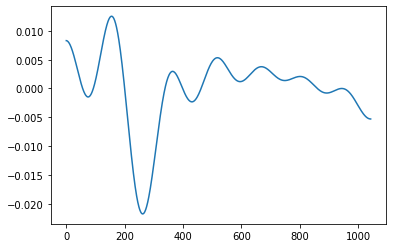

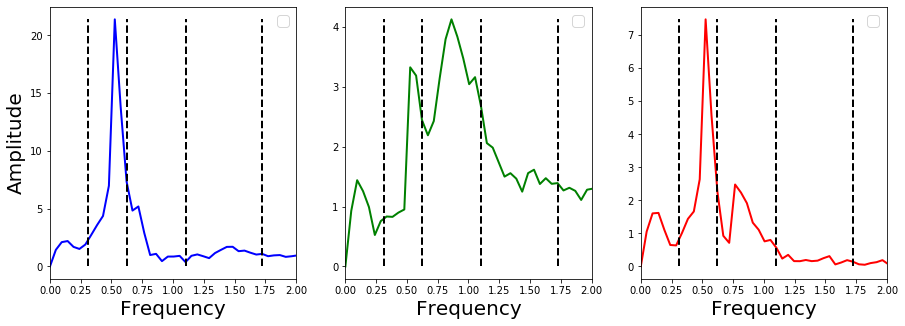

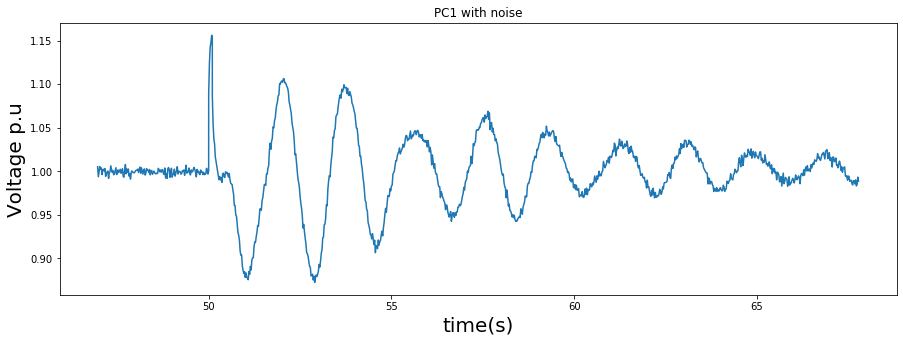

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 7
ll: 13
kd 41
o 1
N

No handles with labels found to put in legend.


 6


No handles with labels found to put in legend.
No handles with labels found to put in legend.


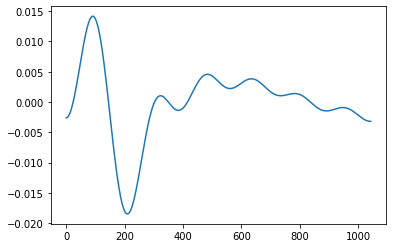

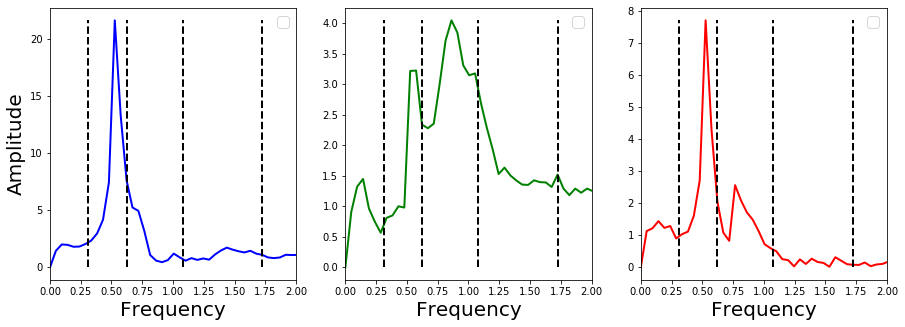

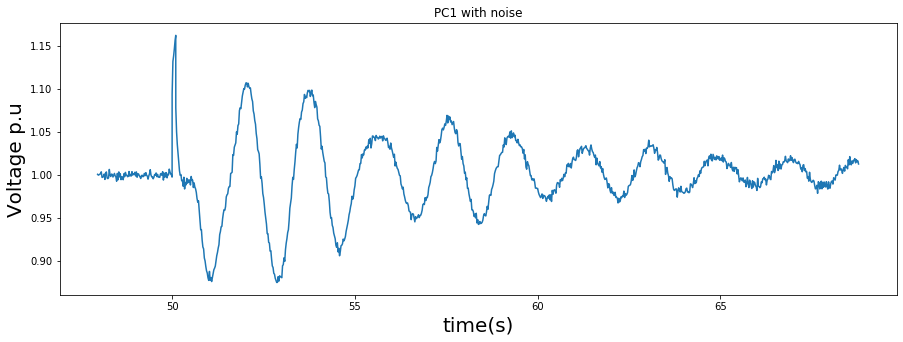

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 5


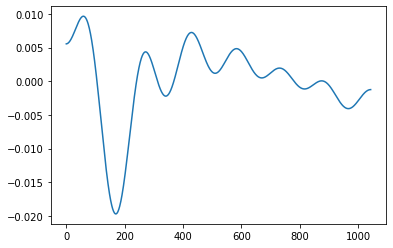

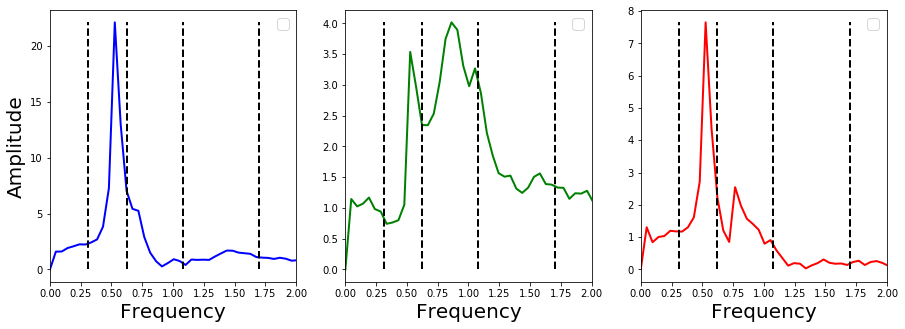

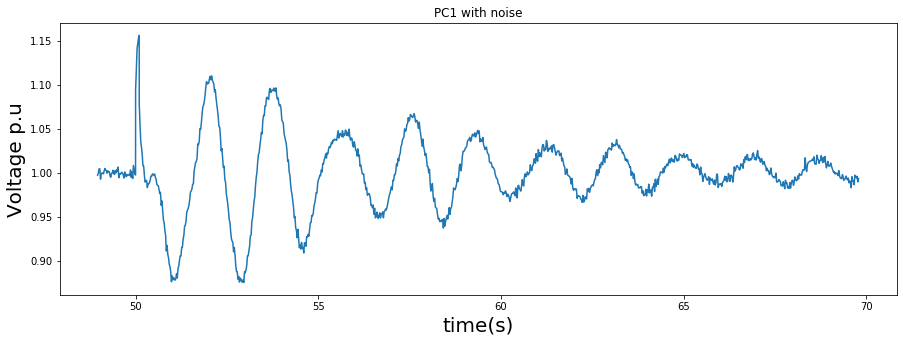

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 8
ll: 13
kd 41
o 1
N 6


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


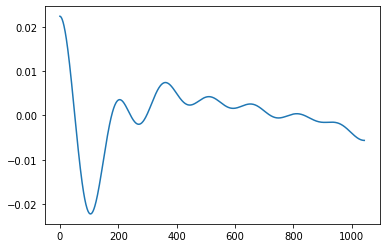

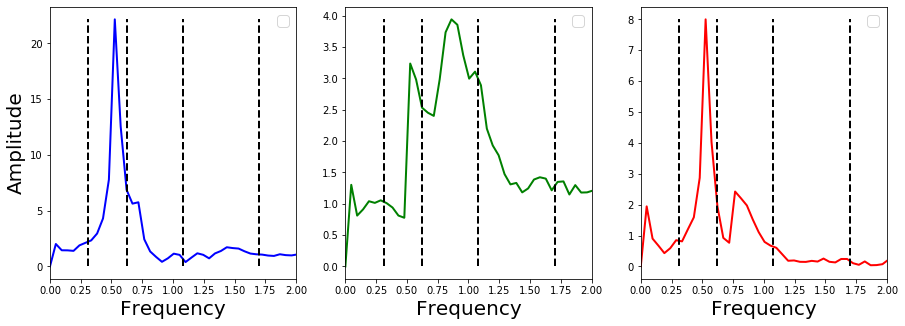

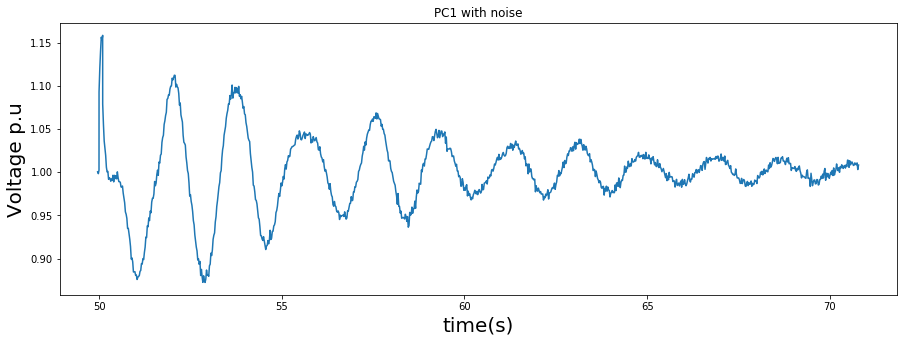

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 7
ll: 13
kd 41
o 1
N 6


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


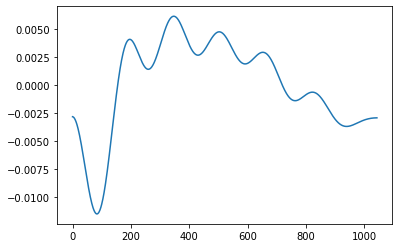

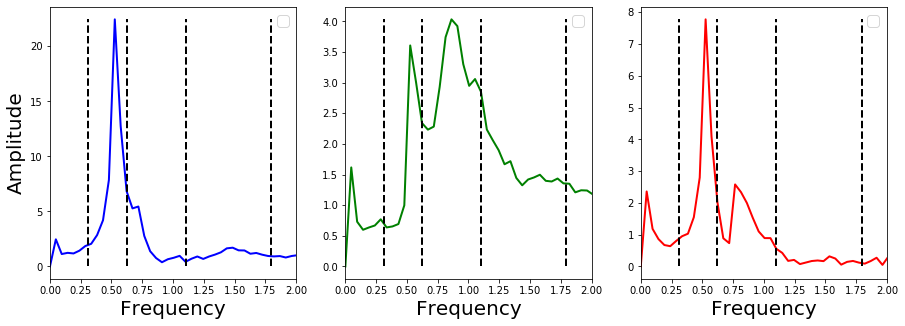

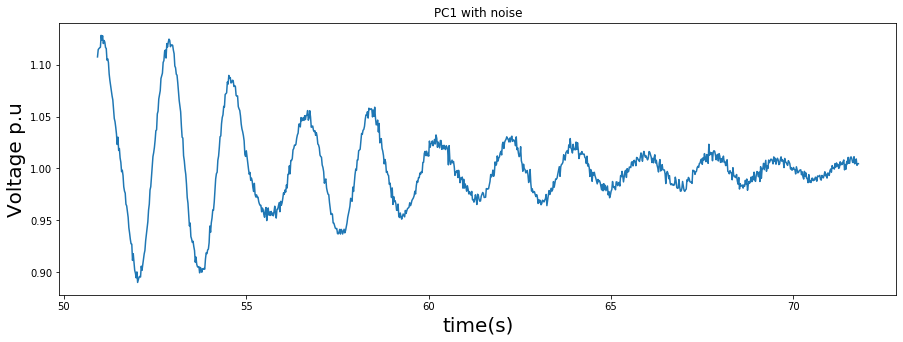

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 4
ll: 13
kd 41
o 1
N 3


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


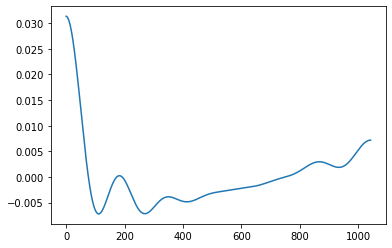

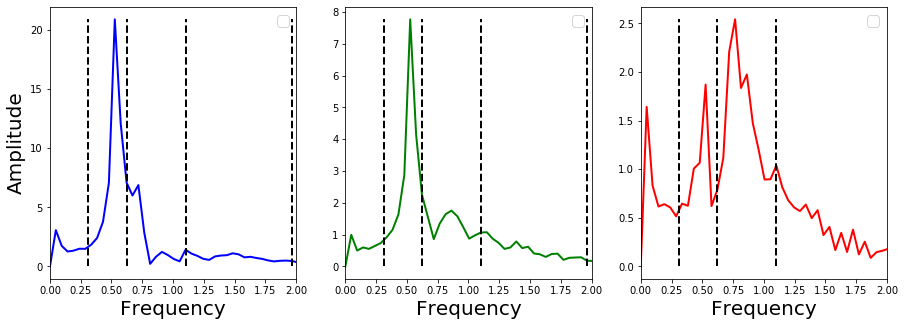

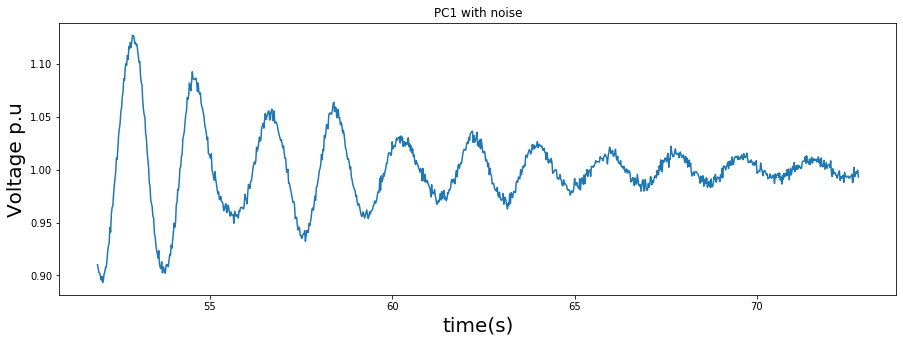

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 4
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 3


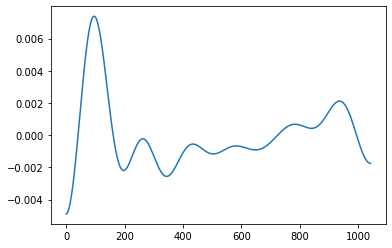

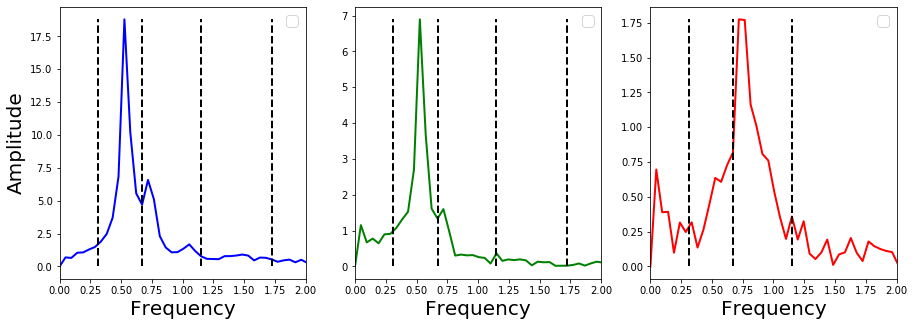

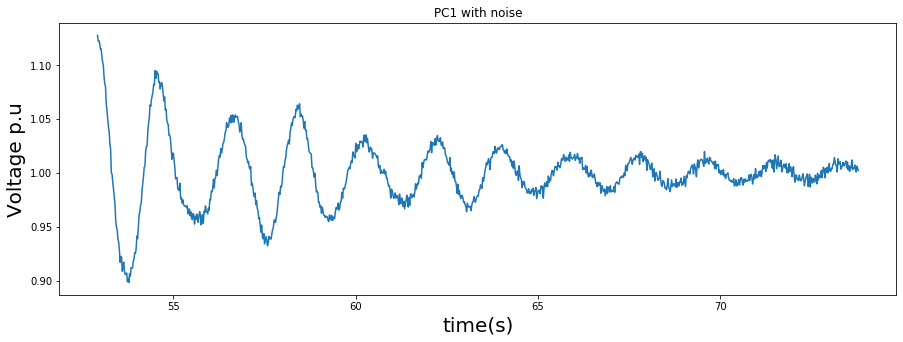

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 5
ll: 13
kd 41
o 1
N 4


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


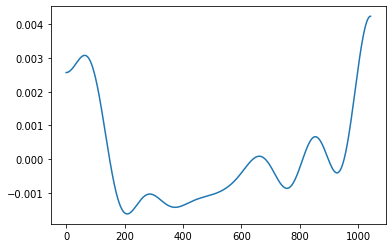

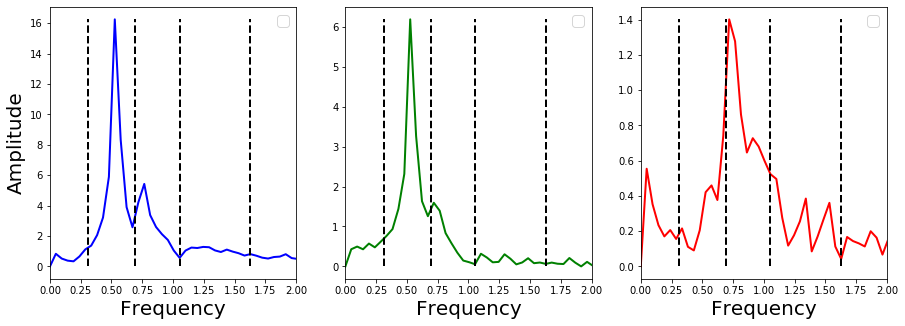

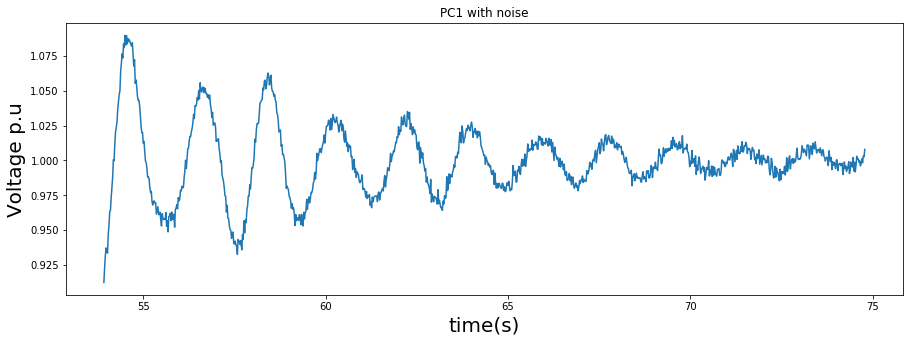

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 3
ll: 13
kd 41
o 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


N 3


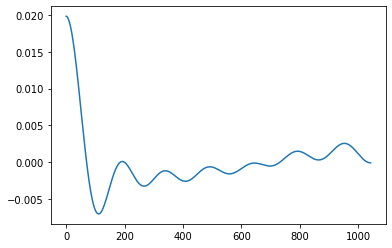

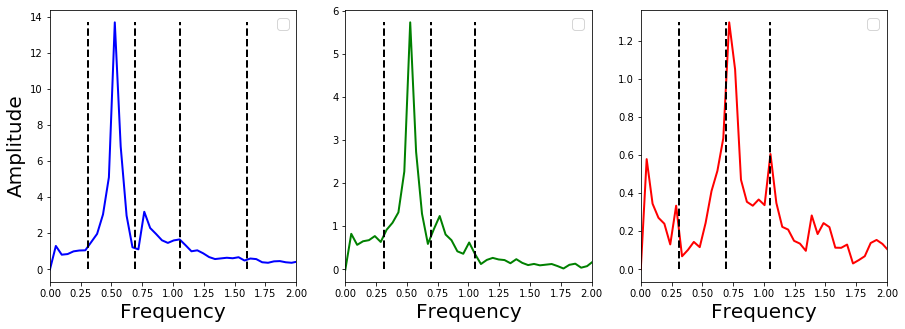

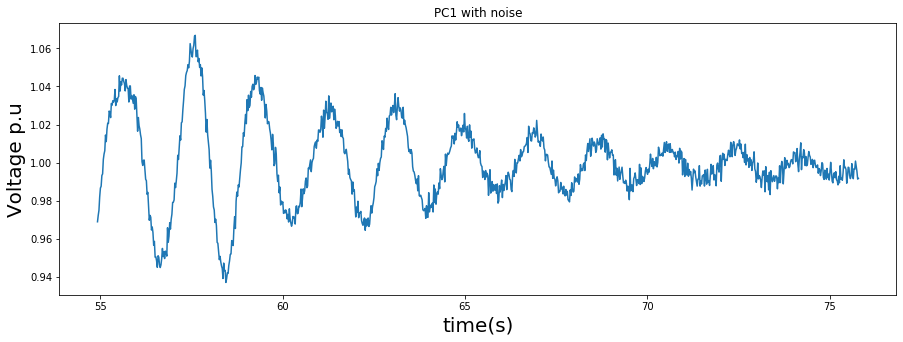

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd

No handles with labels found to put in legend.


 41
o 1
N 2


No handles with labels found to put in legend.
No handles with labels found to put in legend.


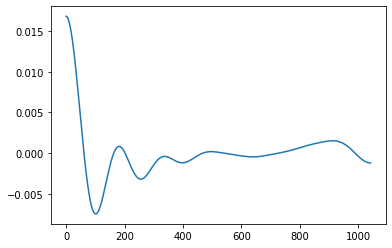

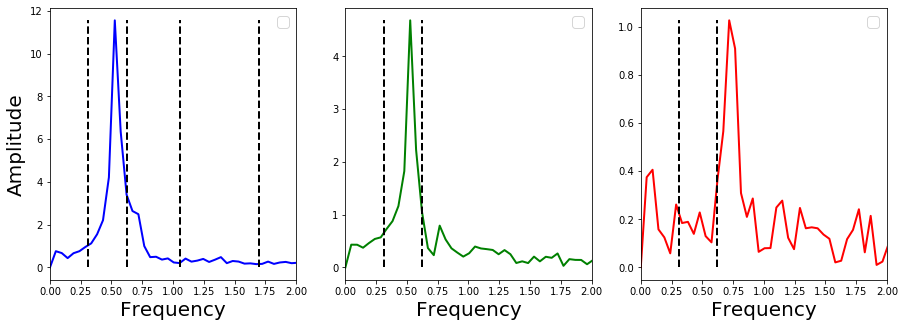

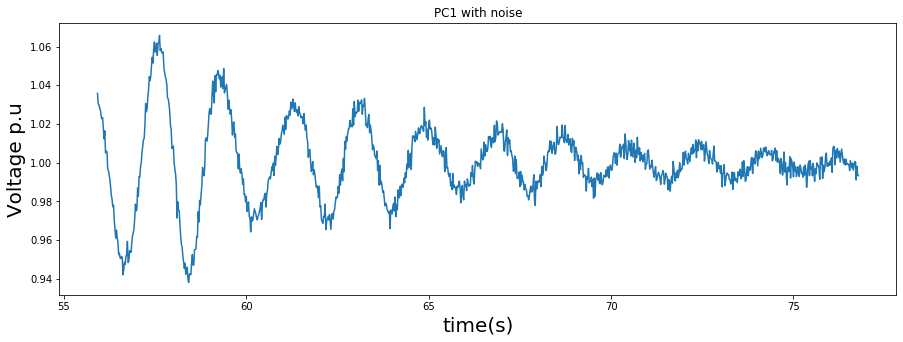

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd 41
o 1
N 2


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


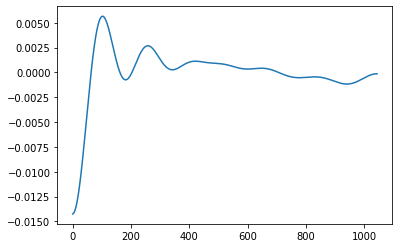

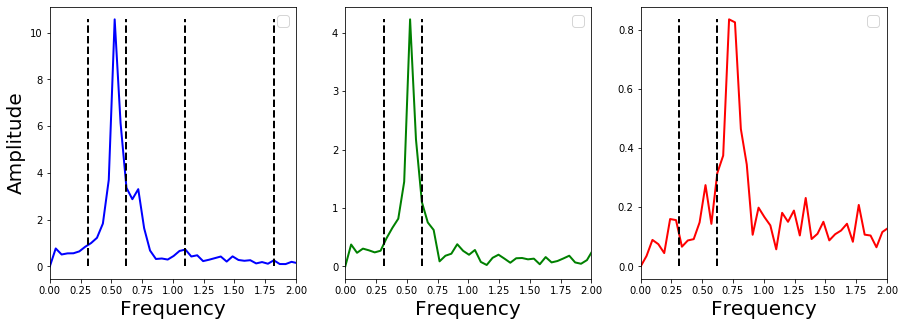

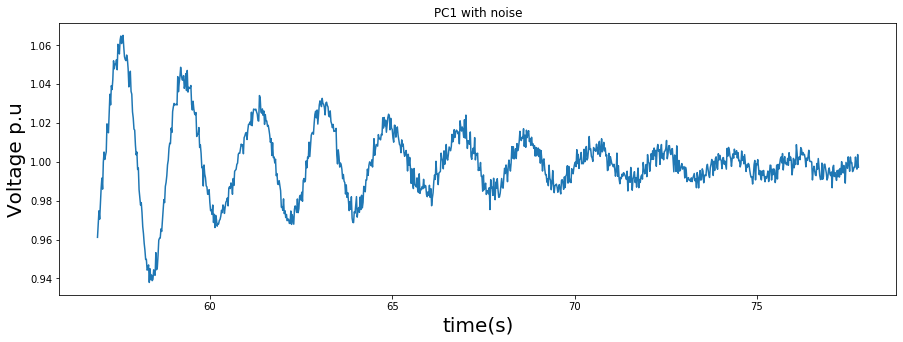

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd 41
o 1
N 2


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


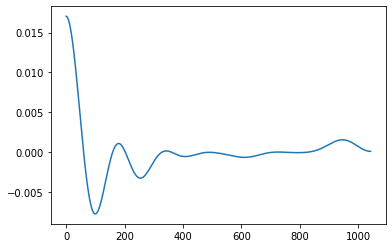

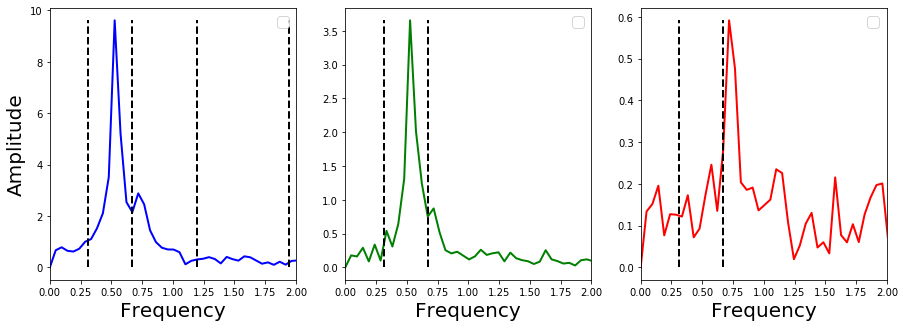

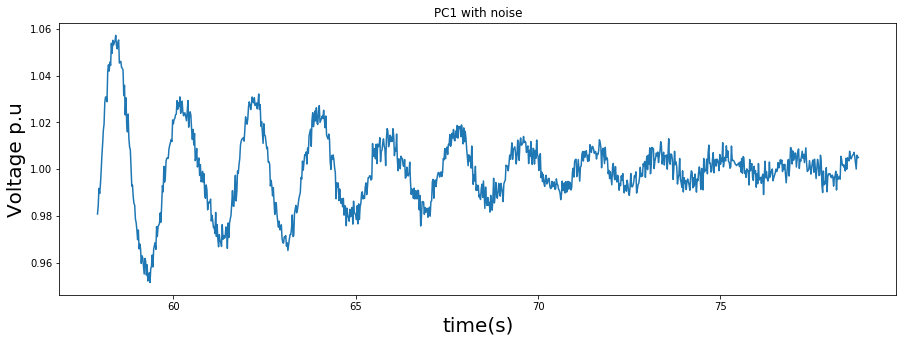

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd 41
o 1
N 2


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


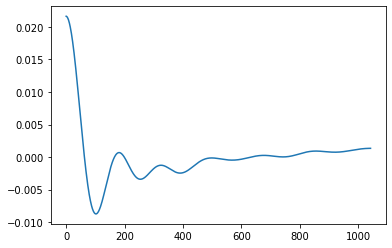

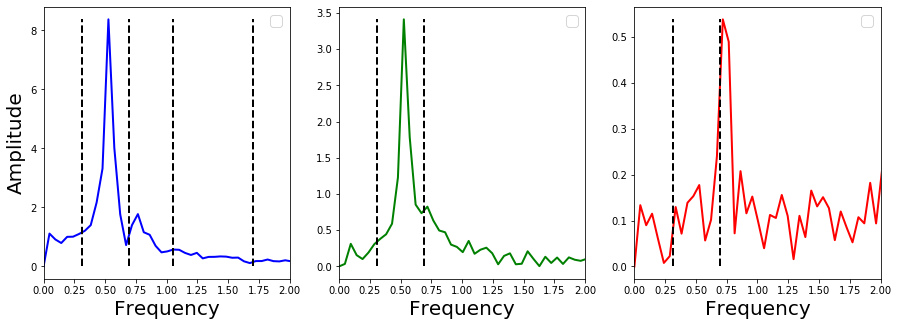

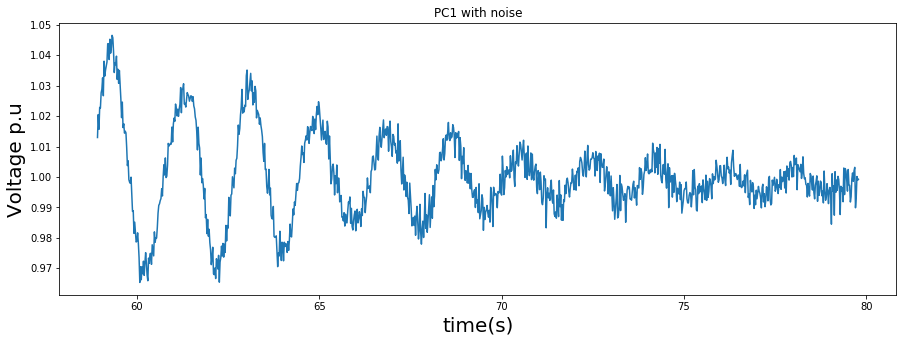

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd 41
o 1
N 2


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


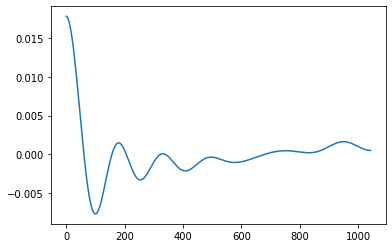

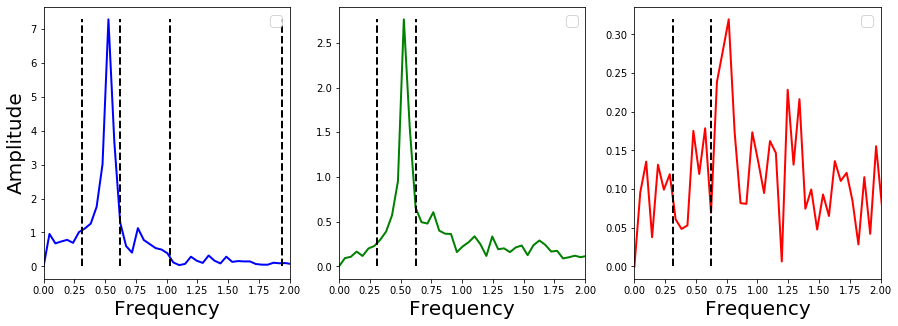

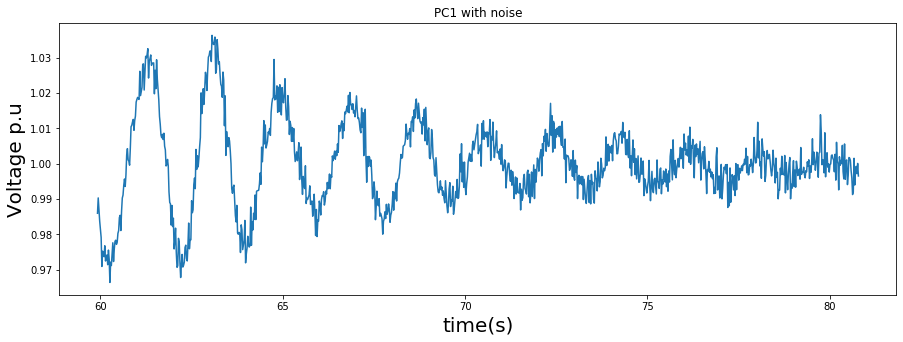

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


kd 41
o 1
N 2


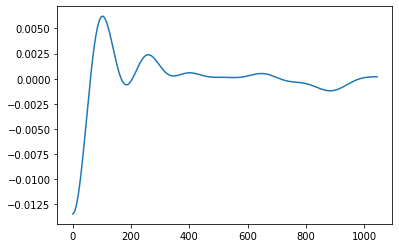

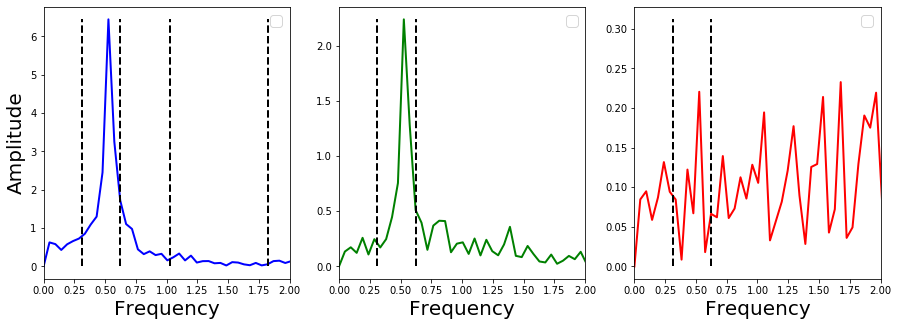

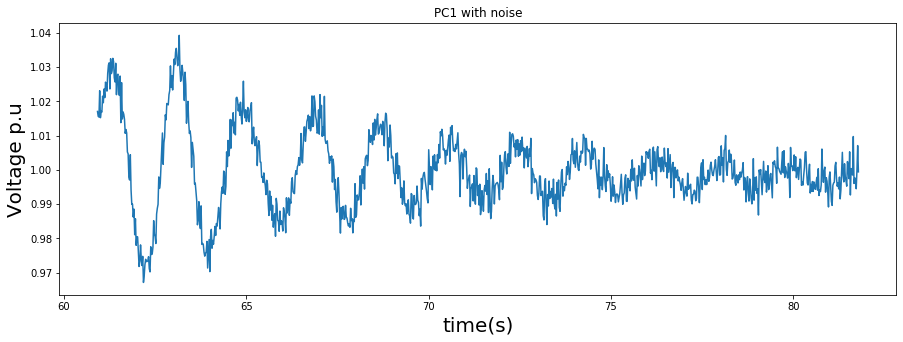

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd 41

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.



o 1
N 2


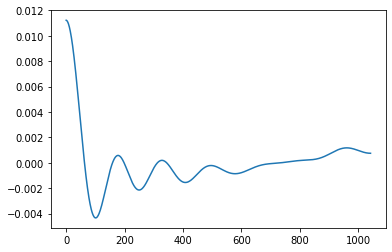

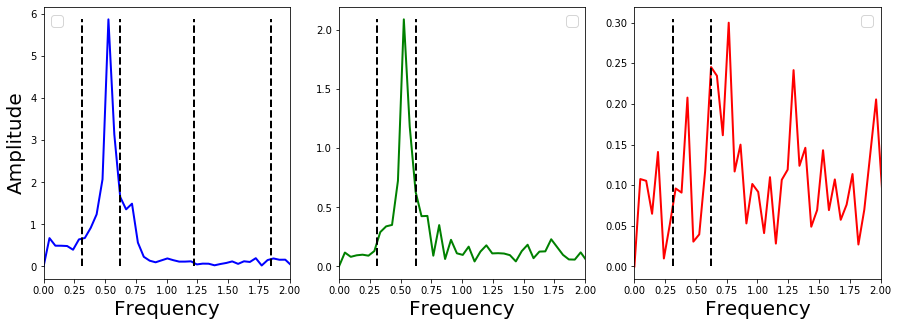

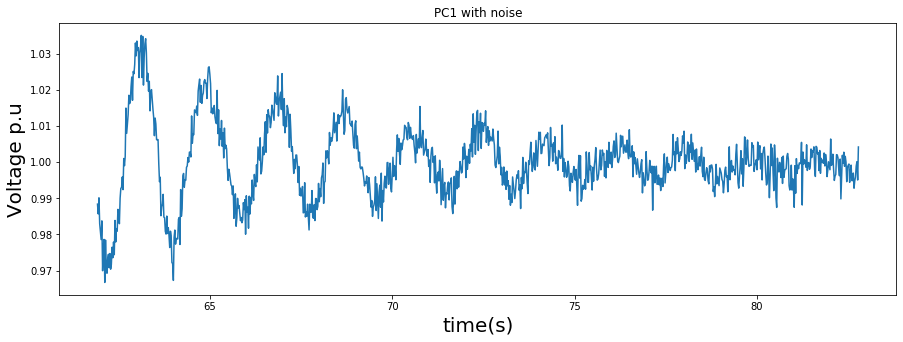

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd 41
o 1
N 2


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


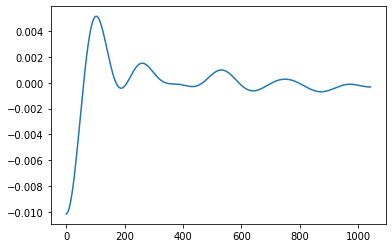

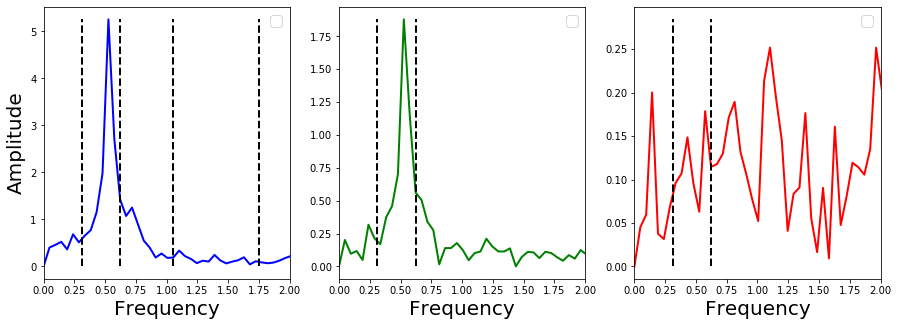

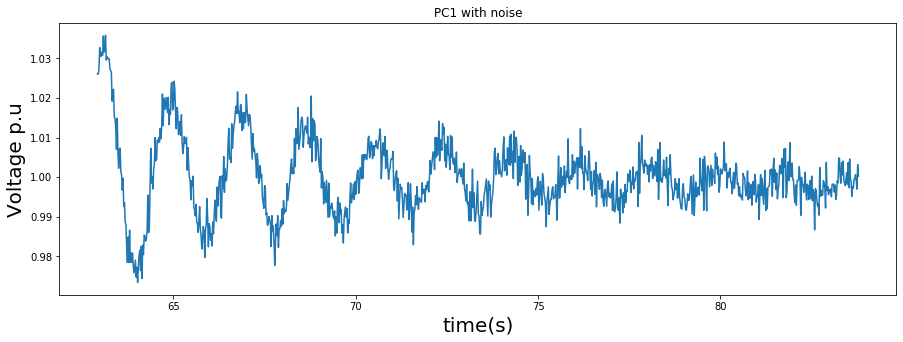

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd 41
o 1
N 2


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


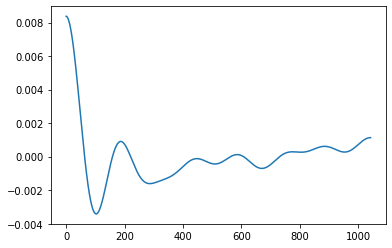

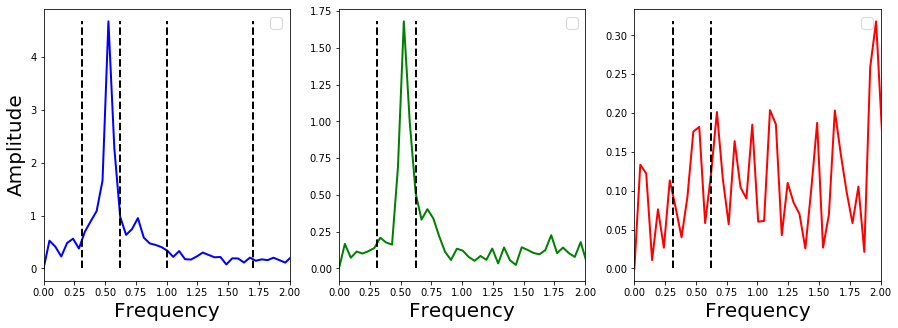

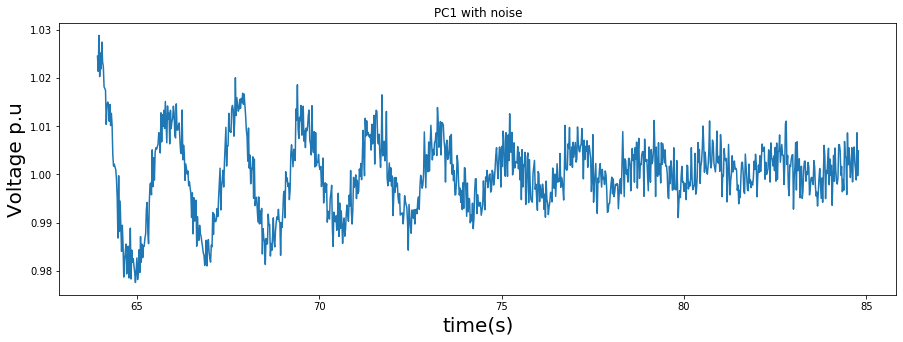

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 2


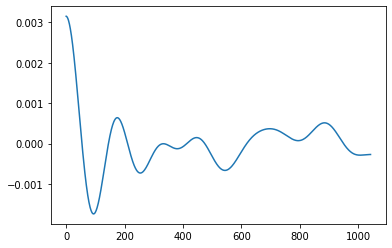

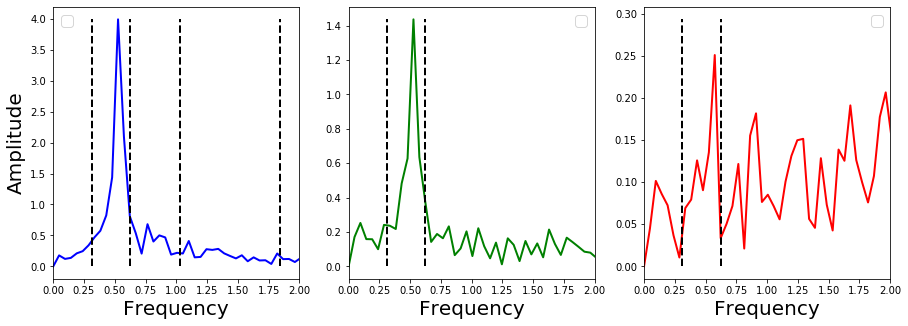

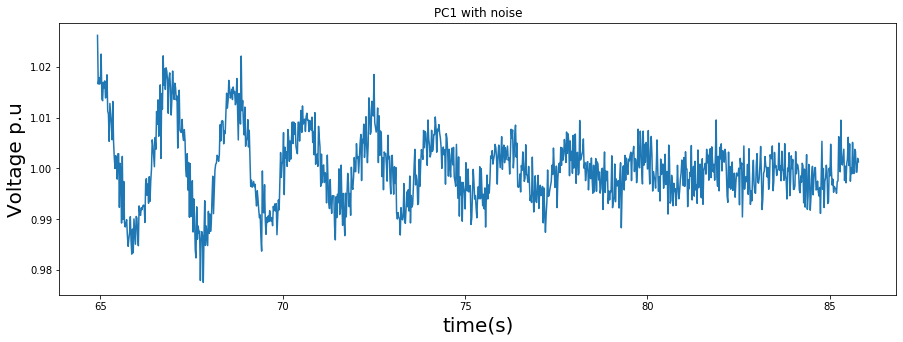

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 2


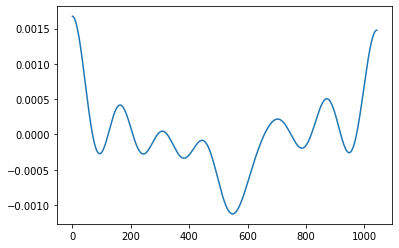

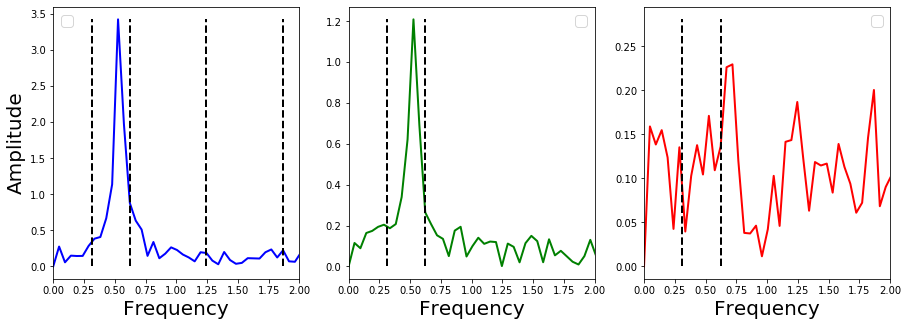

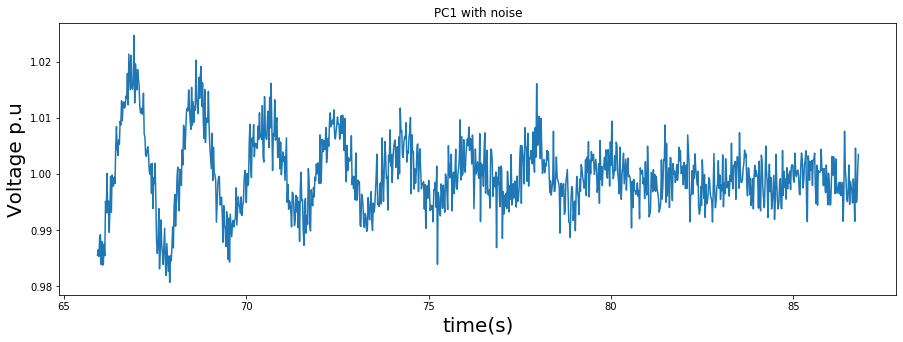

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd 41
o 1
N 2


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


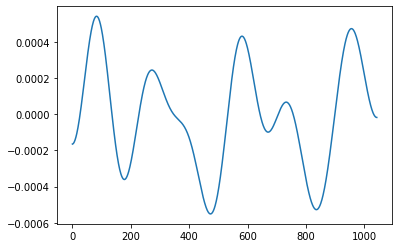

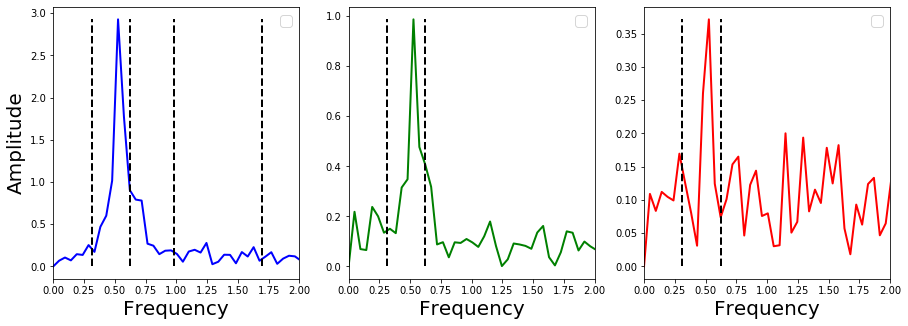

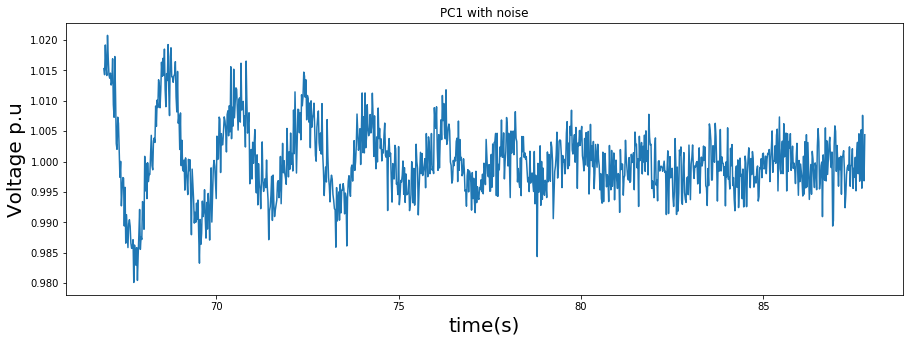

ll: 13
kd 41
o 1
N 41
ll: 13


No handles with labels found to put in legend.


kd 41
o 1
N 2
ll: 13
kd 41
o 1
N 2


No handles with labels found to put in legend.
No handles with labels found to put in legend.


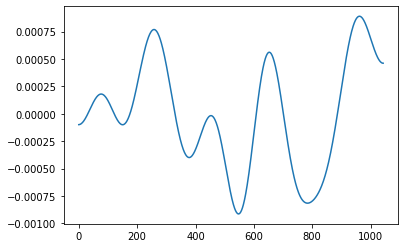

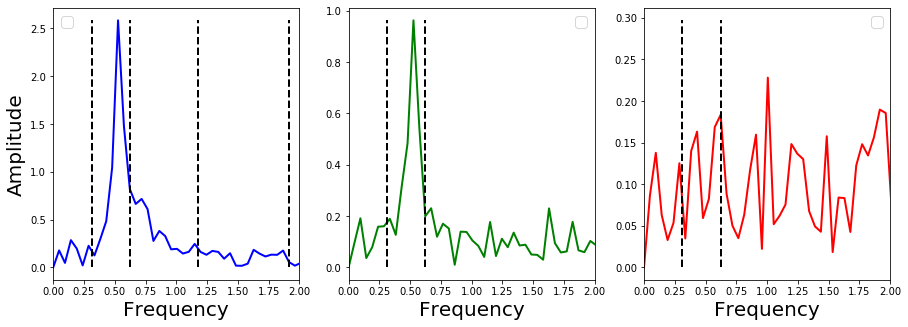

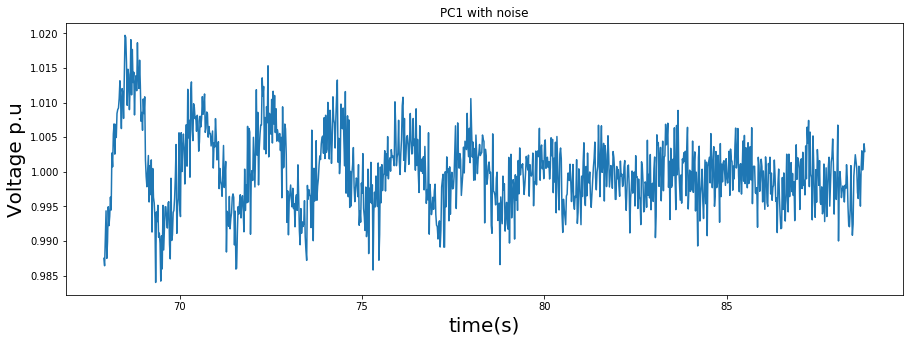

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 1


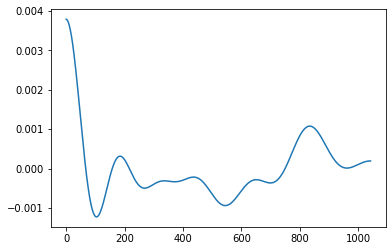

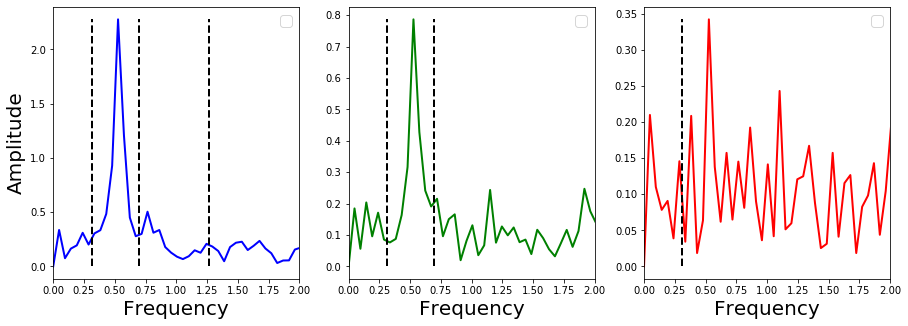

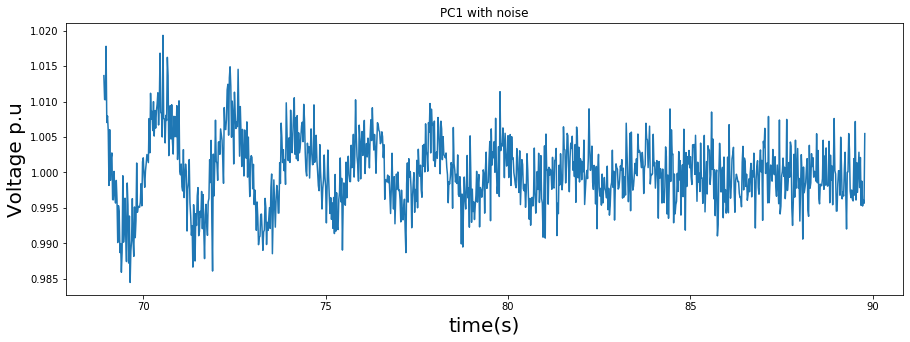

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 2
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


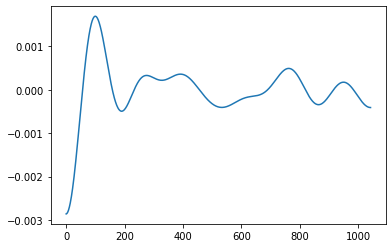

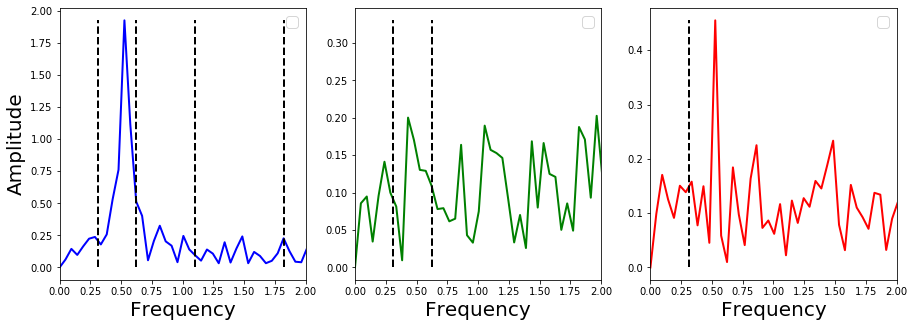

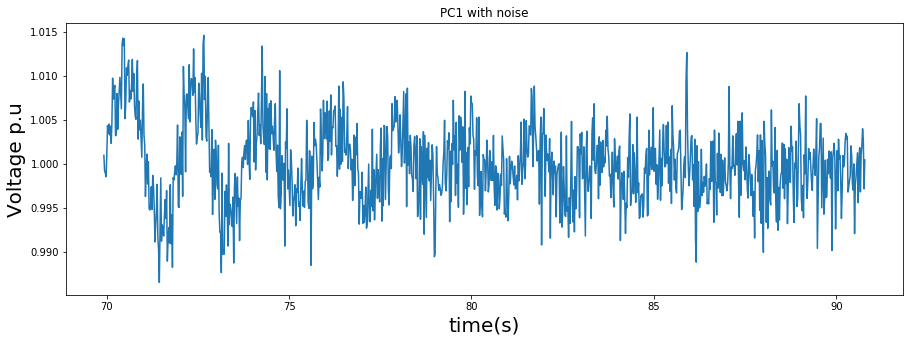

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


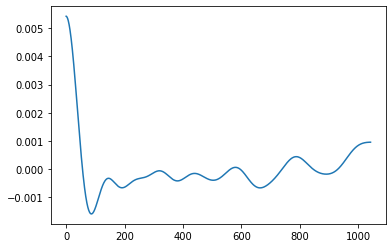

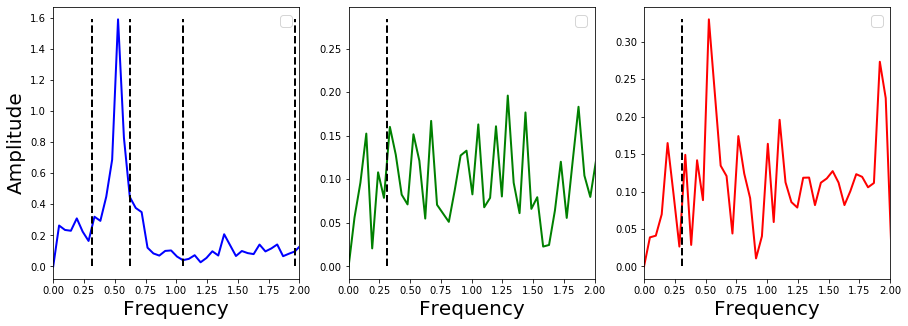

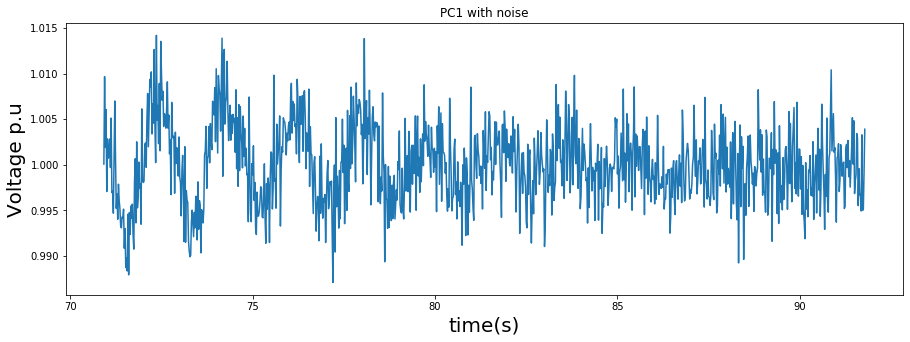

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


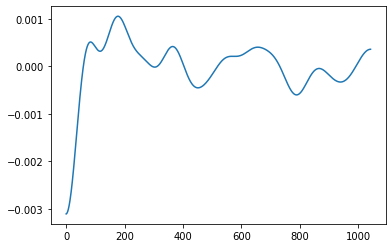

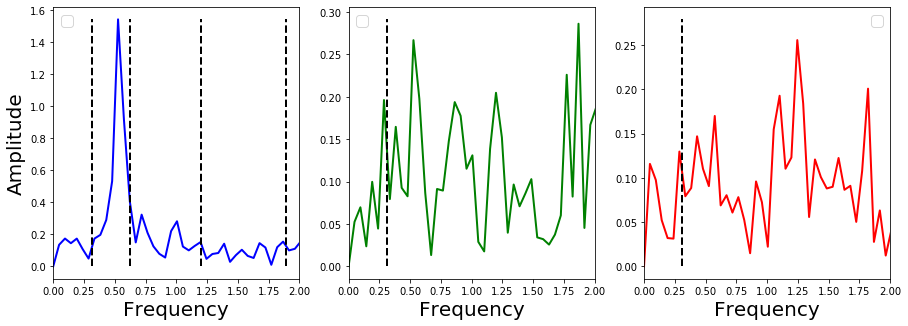

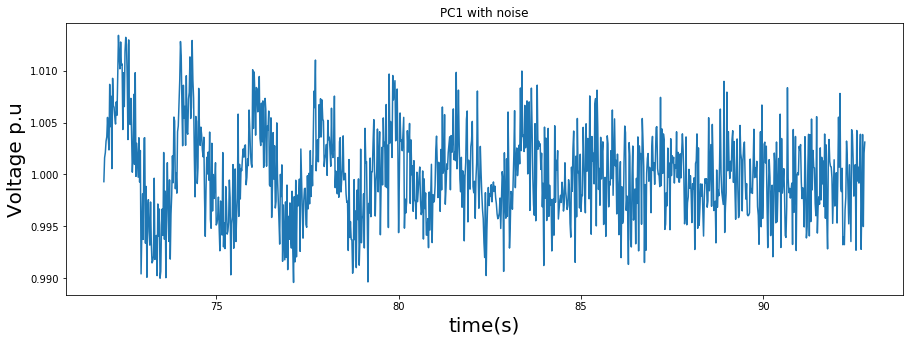

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


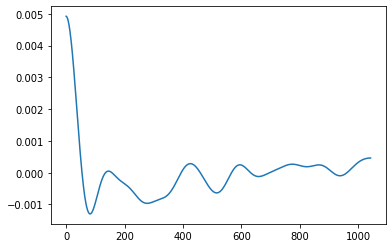

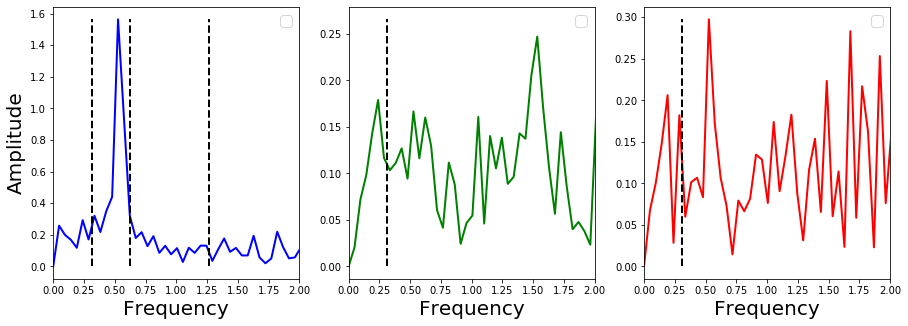

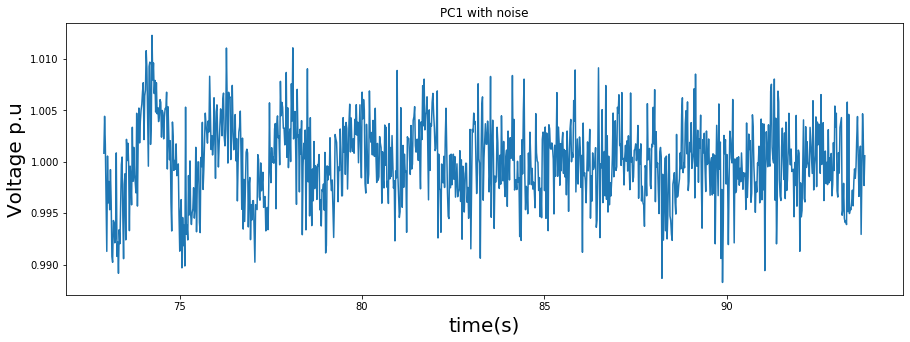

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


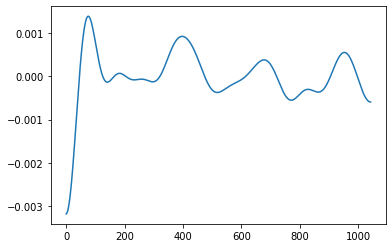

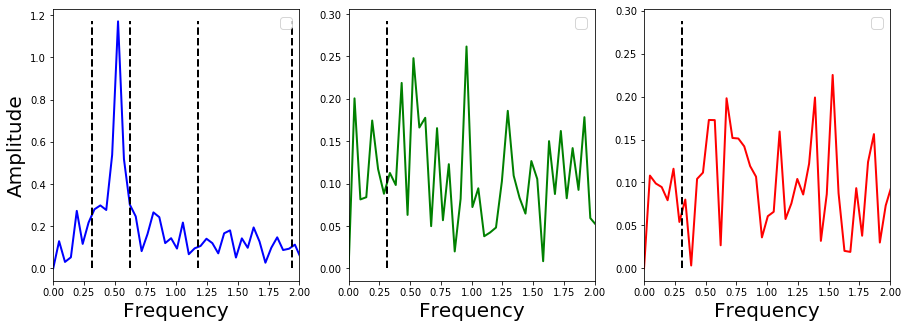

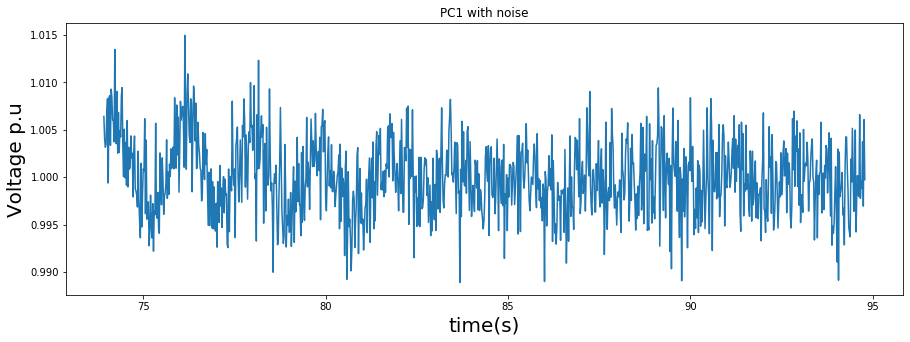

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


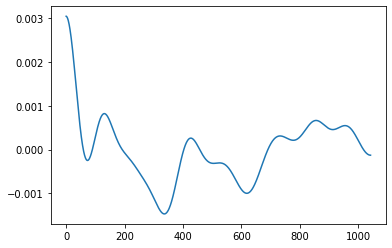

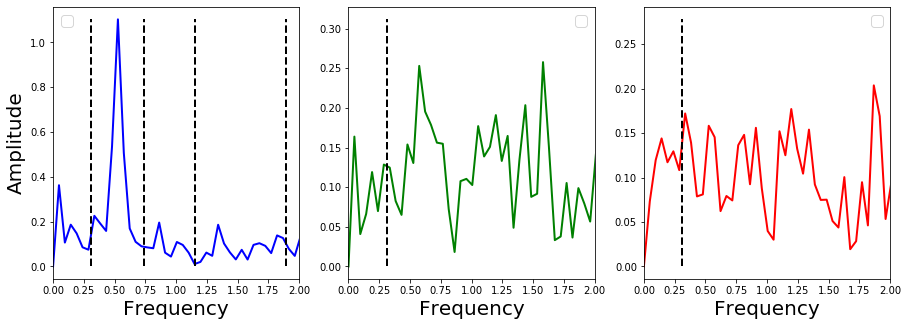

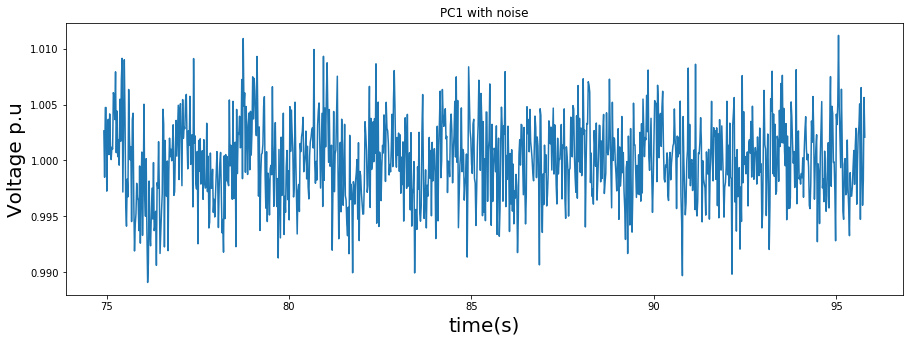

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


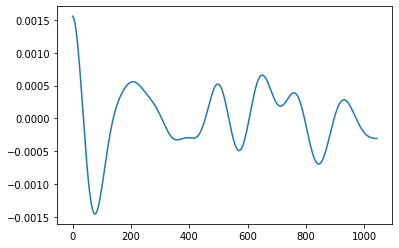

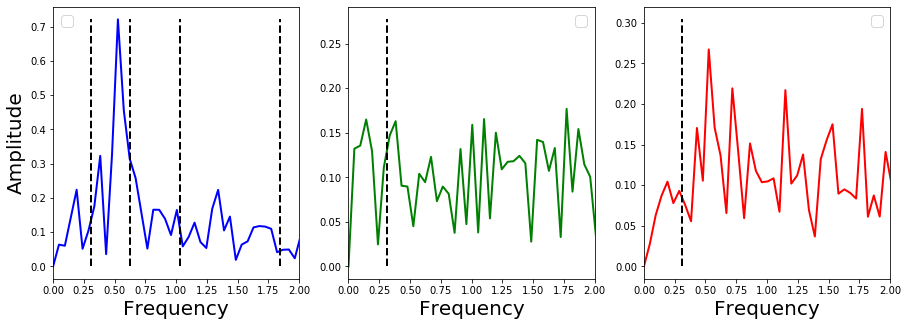

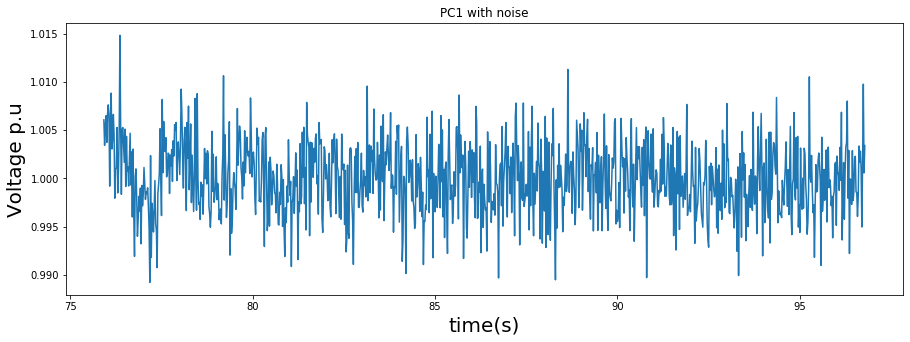

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 1


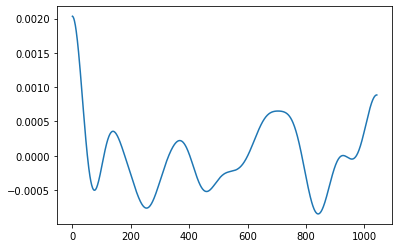

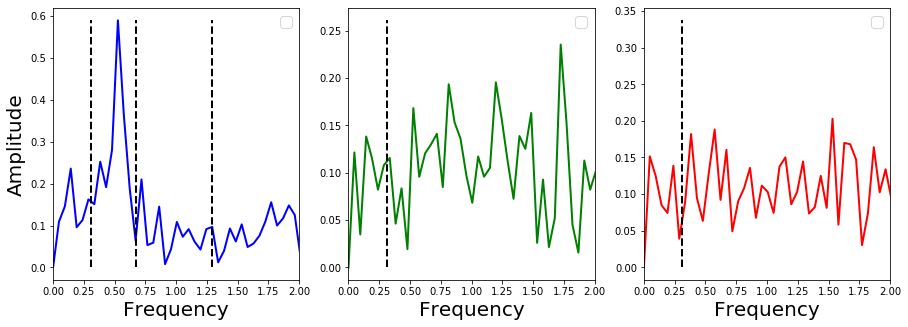

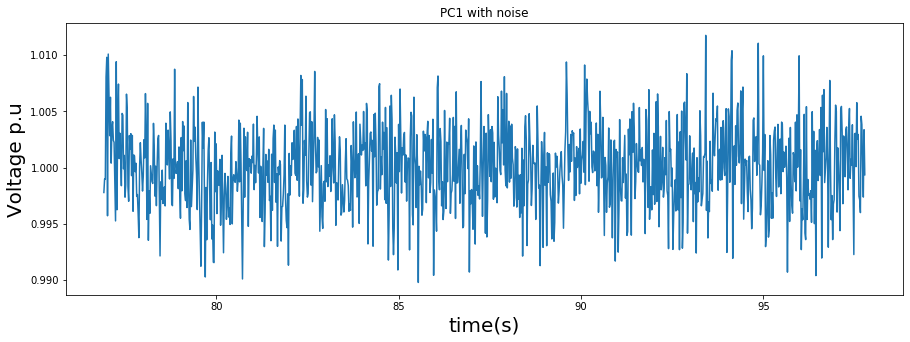

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd 41
o 1
N 1


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


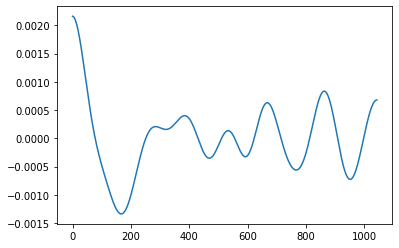

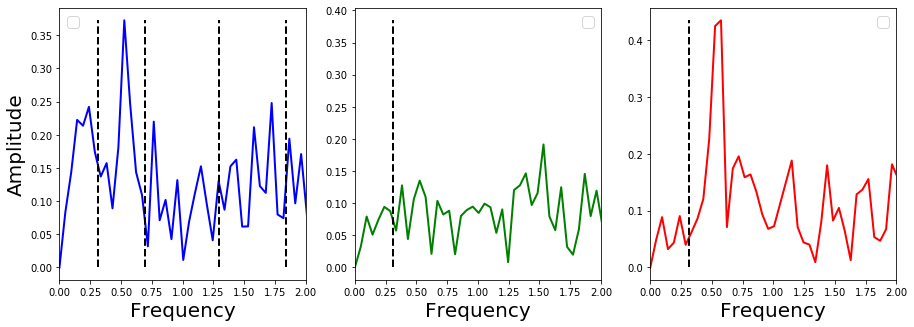

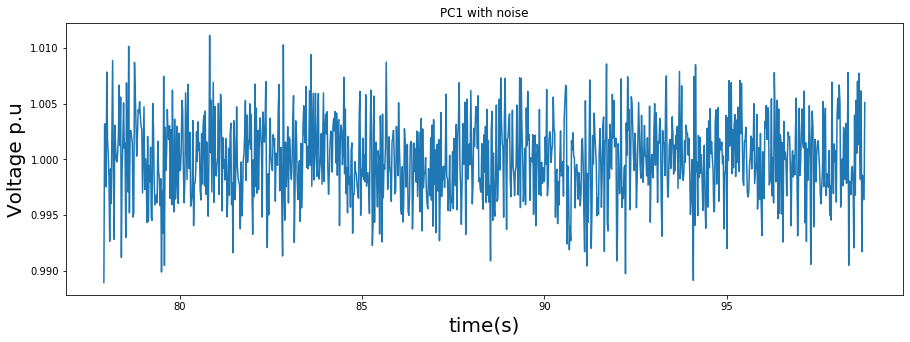

ll: 13
kd 41
o 1
N 41
ll: 13
kd 41
o 1
N 1
ll: 13
kd

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


 41
o 1
N 1


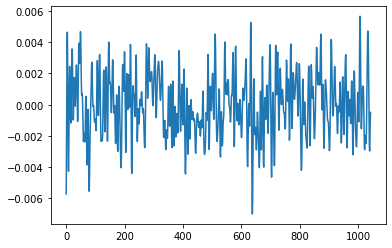

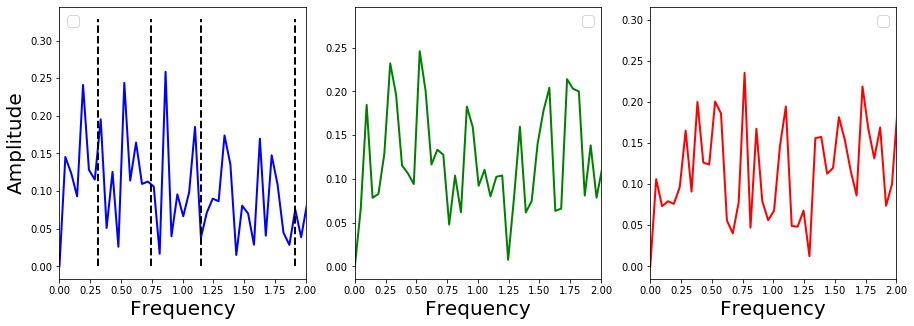

In [340]:
get_boundaries(vm,50,994,a=2)

In [336]:
def get_ratio(pf,lim1,lim2):
    X = pf
    S=X.shape[0]-lim2
    U = S//lim1
    Y = []
    Z = []
    ge = []
    gp= []
    t1 = []
    t2 = []
    fs = 50
    while True:
        for i in range((U-1)):
            Y.append(X.iloc[(i * lim1)  : (i + 1) * lim1 + lim2])
            start = timer()


            col = list(X.head())
            data = pd.DataFrame(scale(Y[i]), columns=col)
            data1 = pd.DataFrame((Y[i]), columns=col)
            data = data.iloc[:,0:19]
            
            
            ta = data1['Time'].values
            delta_t = 0.019999
            data_without_time = data.iloc[:,1:]
             
            t1.append(ta[0])
            t2.append(ta[-1])

#             yf, ta = wpca(data1,'no','PC2')

            yf,ta = pca_noise(data1,'yes','PC1',50)
            g = yf['PC1']
    
        
            filter = 0.003
            g = signal.detrend(g)
        
    
            ewt1,boundaries1 = get_wavelet(g,0.7,0.052)
            ewt,boundaries = get_wavelet(g,0.7,0.052)
            print('shape',ewt[1].shape[0])
            
            if ewt[1].shape[0] < 2:
                IF=0
                ratio1=0
                #%% show boundaries
                ff1 = np.fft.fft(g)
                freq1=2*np.pi*np.arange(0,len(ff1))/len(ff1)

                if Fs !=-1:
                    freq1=freq1*Fs/(2*np.pi)
                    boundariesPLT1=boundaries1*Fs/(2*np.pi)
                else:
                    boundariesPLT1 = boundaries1

                ff1 = abs(ff1[:ff1.size//2])#one-sided magnitude
                freq1 = freq1[:freq1.size//2]


                fig, (ax1) = plt.subplots(1, 1, figsize=(15,5))
                ax1.plot(freq1,ff1, color = 'b', lw = 2)
                for bb in boundariesPLT1:
                    ax1.plot([bb,bb],[0,max(ff1)],'k--', lw = 2)
                    ax1.set_ylabel('Amplitude',size = 20)
                for ax in fig.axes:
                    matplotlib.pyplot.sca(ax)
                    plt.legend()
                    plt.show()
            elif ewt[1].shape[0]> 2:
                a = 2
                b = 0
                c = -1
                Fs = 54
                analytic_signal = hilbert(ewt[:,a])
                amplitude_envelope = np.abs(analytic_signal)
                instantaneous_phase = np.unwrap(np.angle(analytic_signal))
                instantaneous_frequency = (np.diff(instantaneous_phase) /
                                            (2.0*np.pi) * fs)


                IA = amplitude_envelope
                IF = instantaneous_frequency
                #===============================================
                xs = ta
                data = ewt[:,a]
                #==========================================
                if data.all() == 0:
                    end = timer()
                    ge.append(np.mean(IF))
                    ratiob = 0
                    gp.append(ratiob)
                    Z.append(end - start)
                else:
    #                 peakind = signal.find_peaks_cwt(data, np.arange(1,20,0.5))
                    peakind = signal.find_peaks_cwt(data, np.arange(1,2))
                    peak = pd.DataFrame(data[peakind],peakind)      
                    AE = lowpassfilter(IA,filter)
                    dp1 = AE[peak.index[b]:peak.index[c]]
                    N = peak.index[b:c]
                    n = len(N)
                    delta1 = []
                    damp1 = []
                    ratio1 = []
                    for i in range(0,dp1.shape[0]-1):
                        d1 = (np.log(dp1[i]/dp1[i+1]))
                        d1=np.sum(d1/n)
                        d2 = d1/(np.sqrt(2*math.pi)**2 + (d1)**2)
                        d3 = d2
                        ratio1.append(d3)
                        damp1.append(d2)

                    ge.append(np.mean(IF))
                    gp.append(sum(ratio1))


                print('--------------------------------------------EWT------------------------------------')
                print( 'I_frequency:', np.mean(IF))
                print( 'I_damping:', sum(ratio1))
                print('--------------------------------------------VMD------------------------------------')




        break
    return(ge,gp,Z,t1,t2)


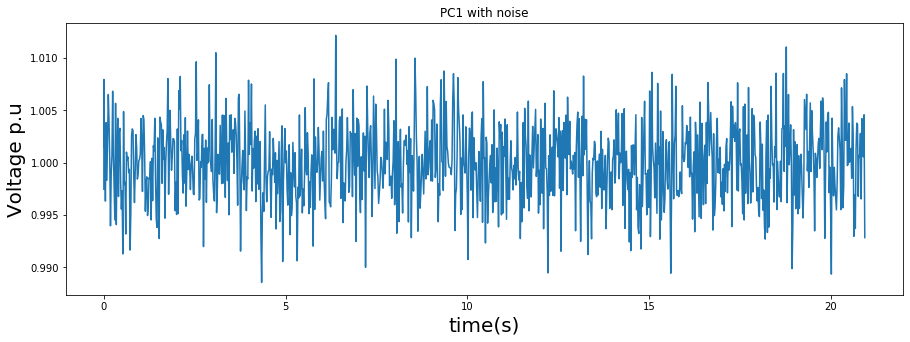

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


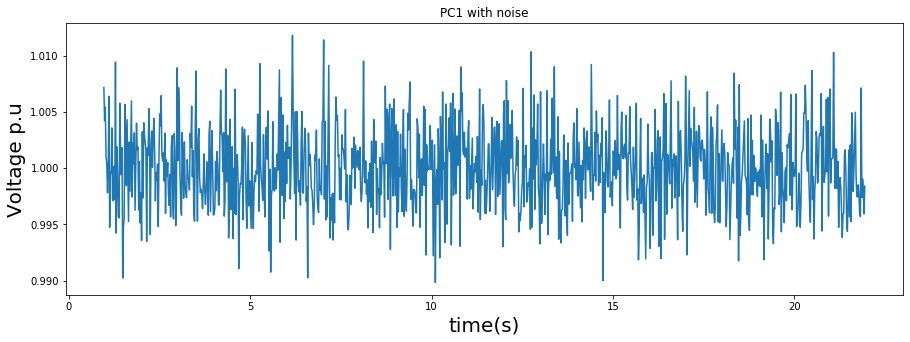

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


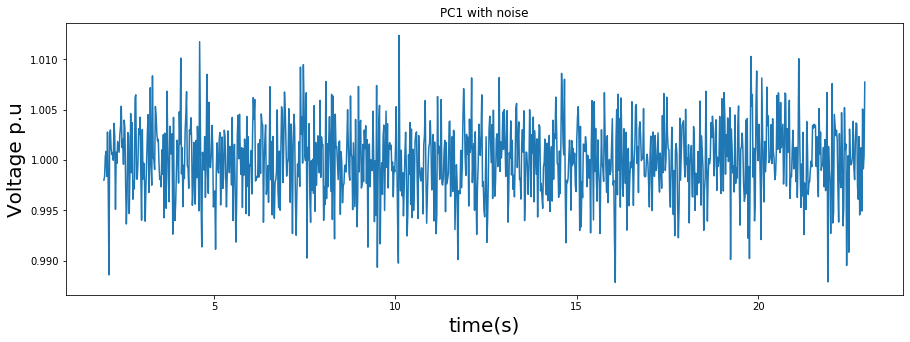

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


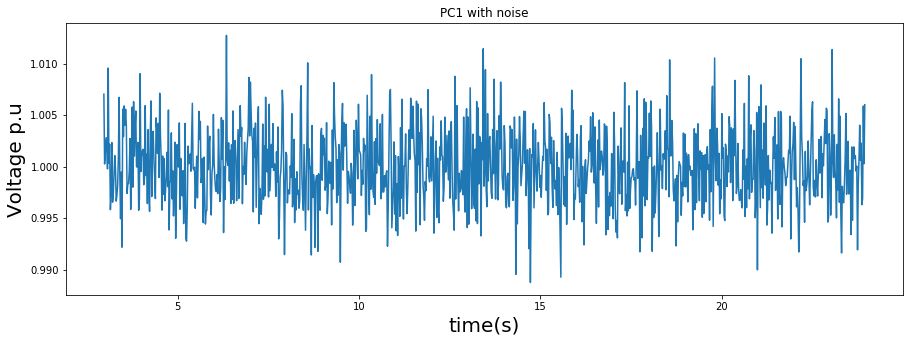

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


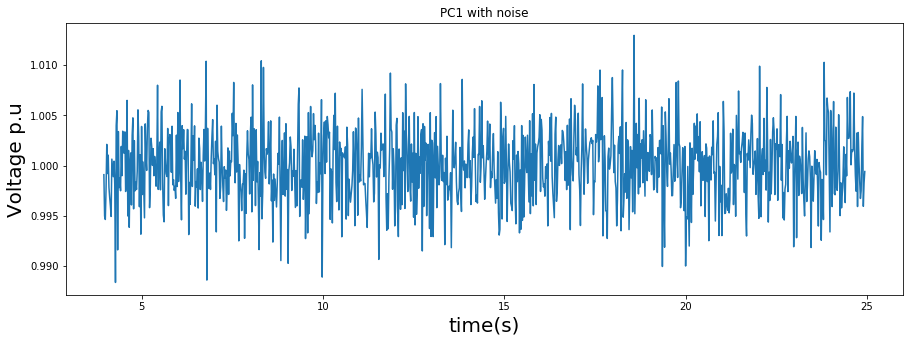

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


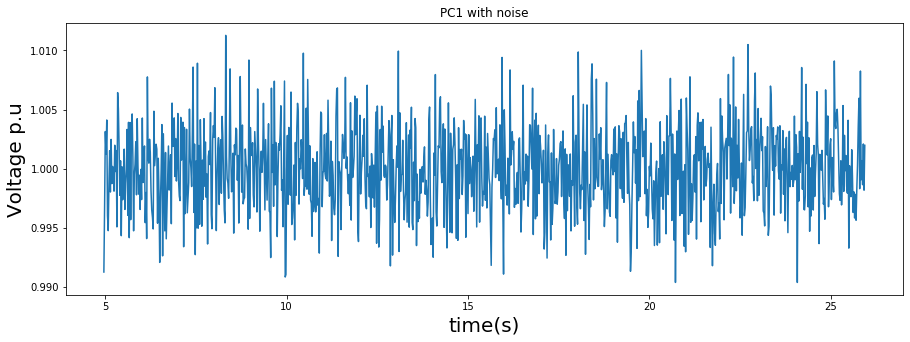

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


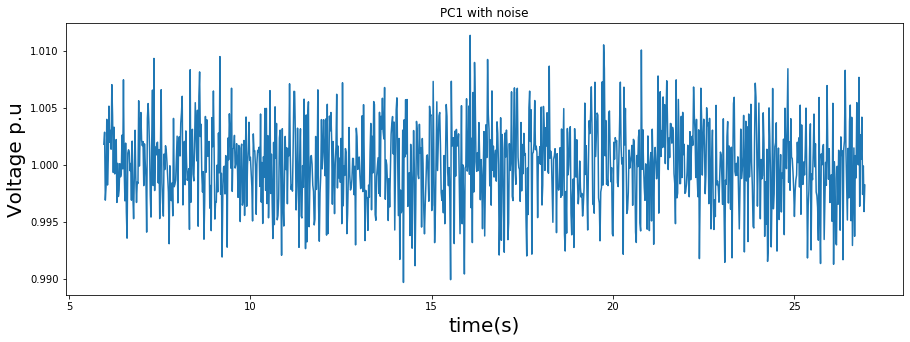

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


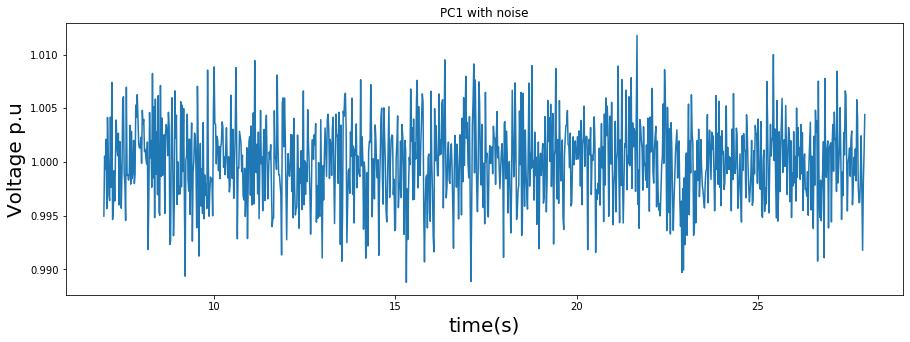

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


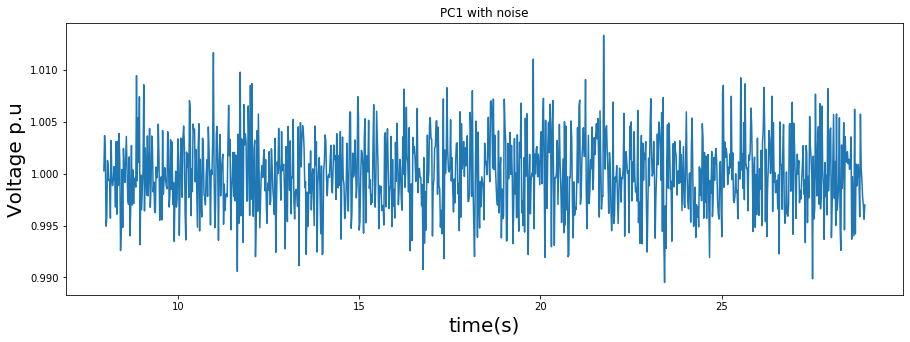

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


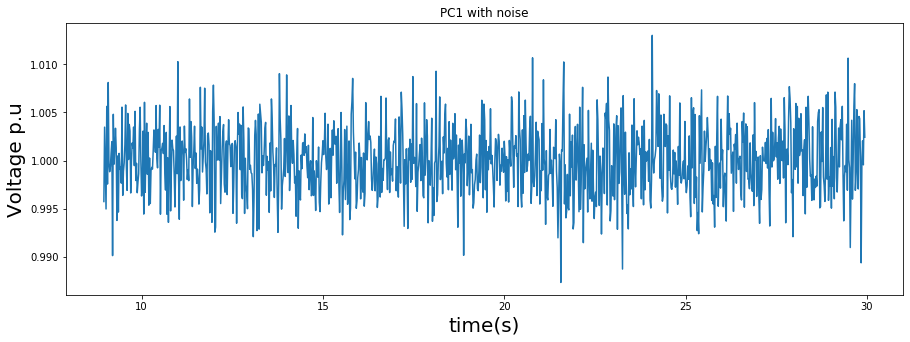

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


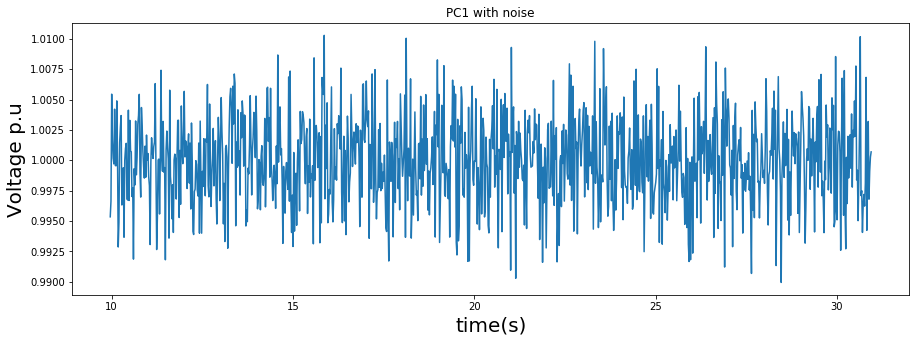

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


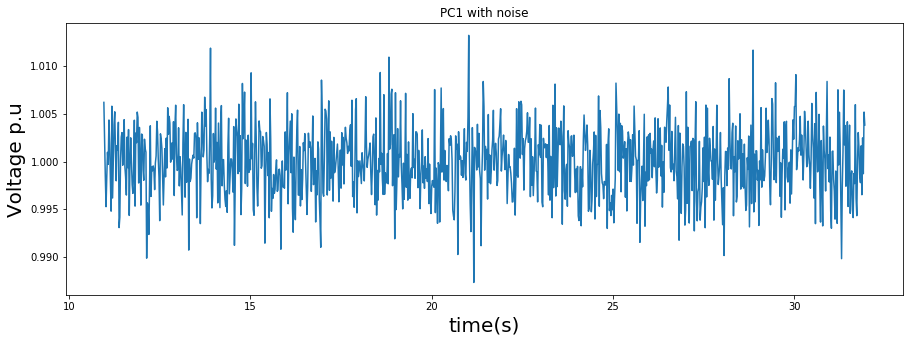

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


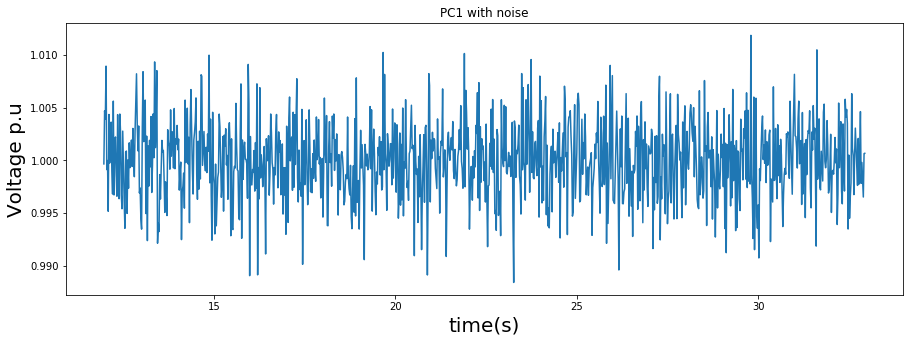

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


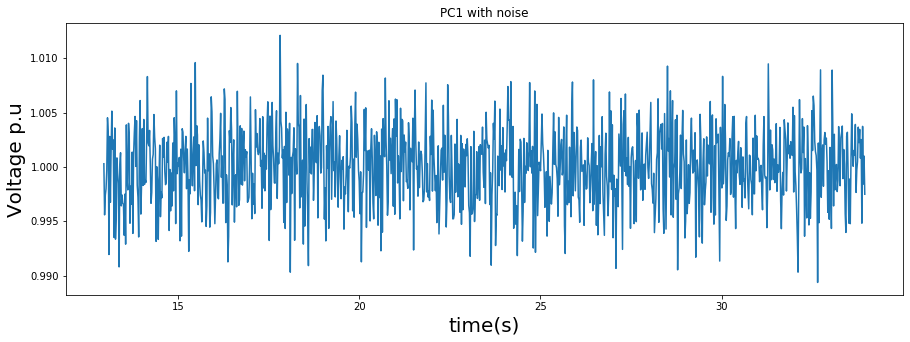

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


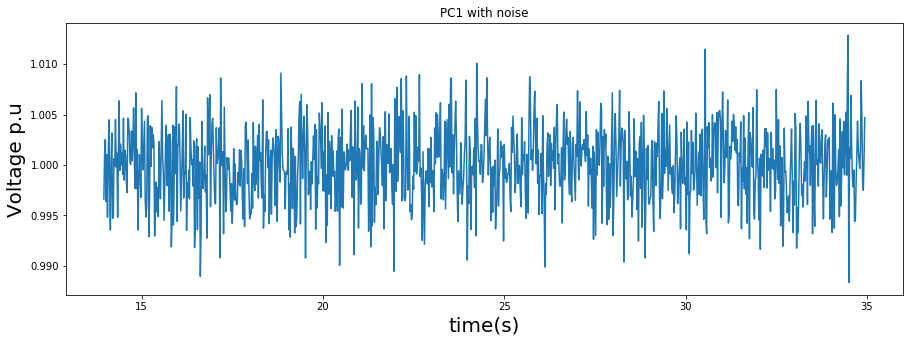

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


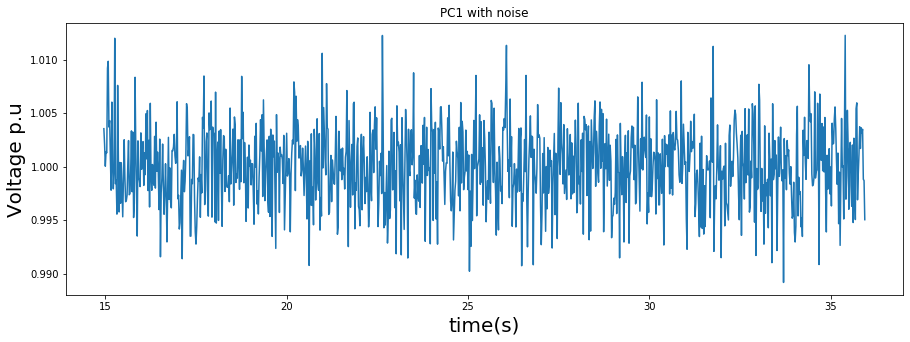

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


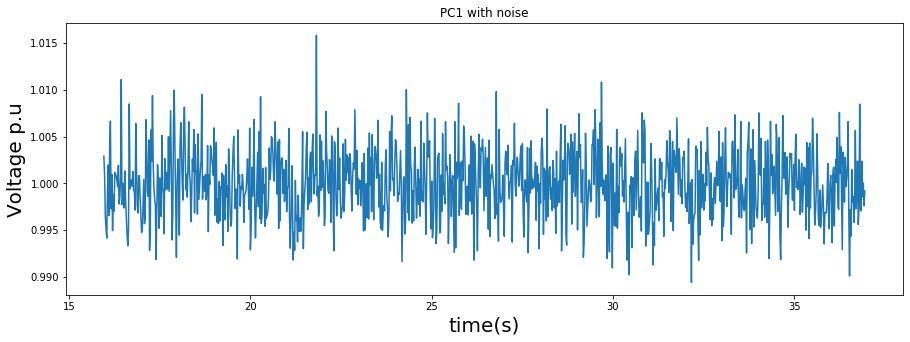

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


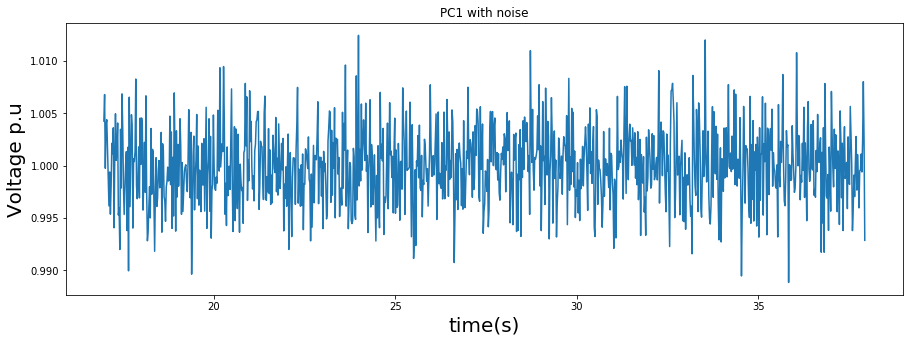

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


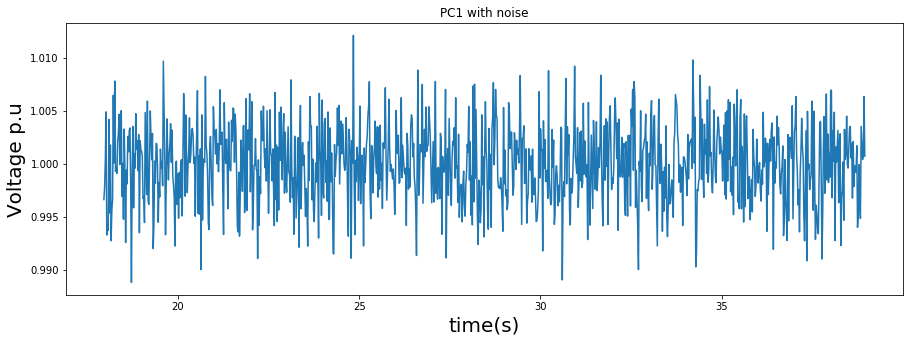

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


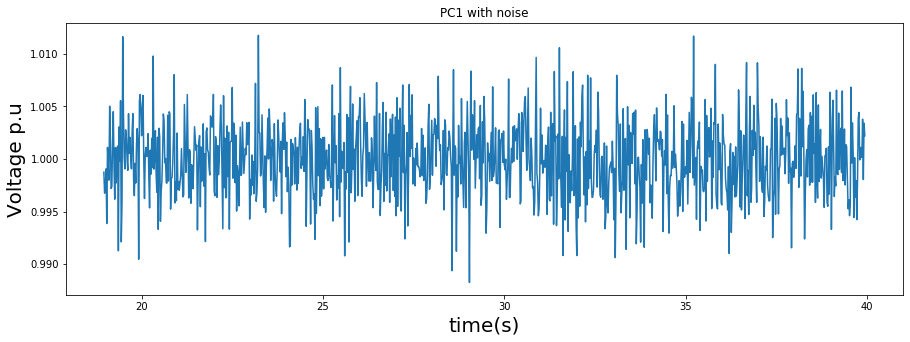

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


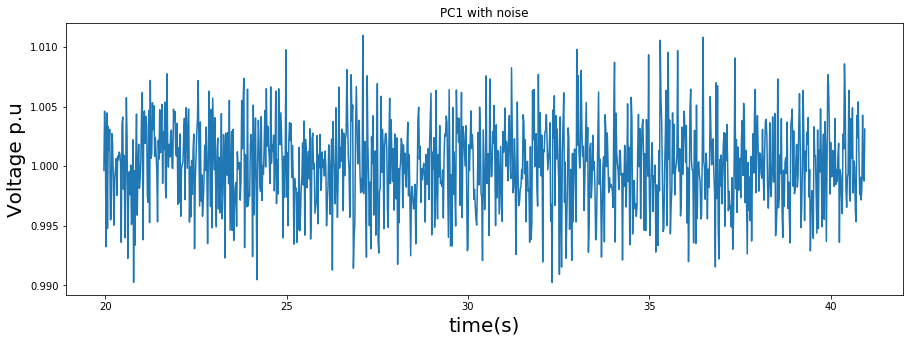

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


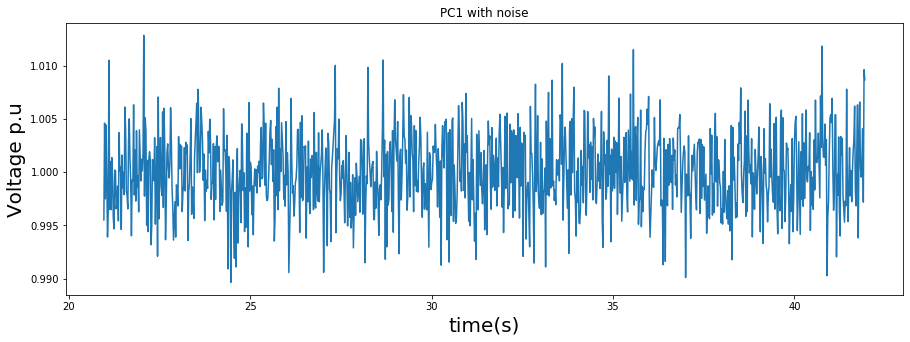

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


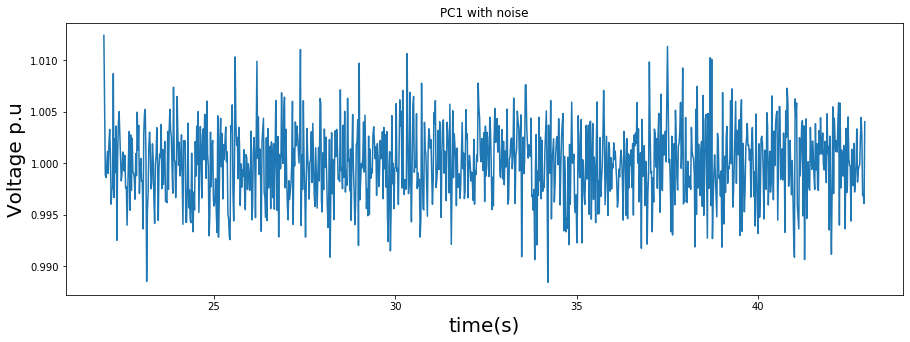

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


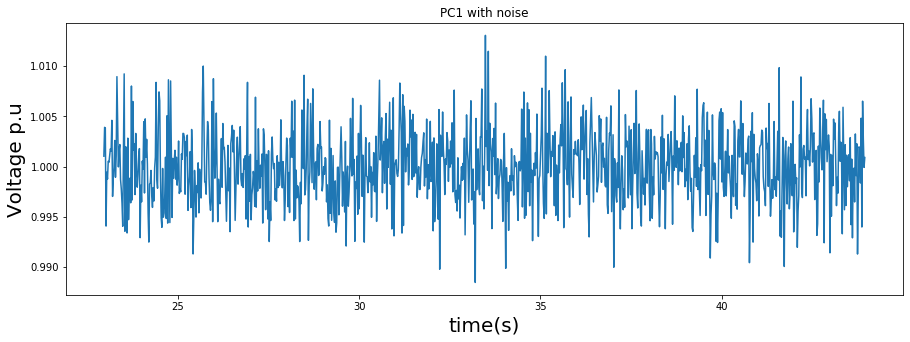

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


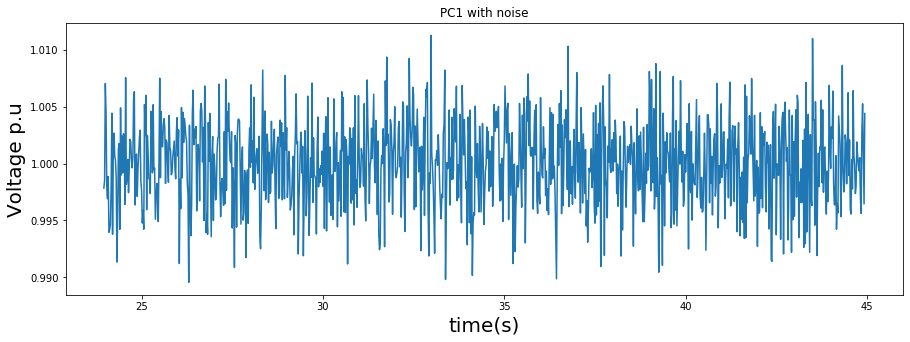

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


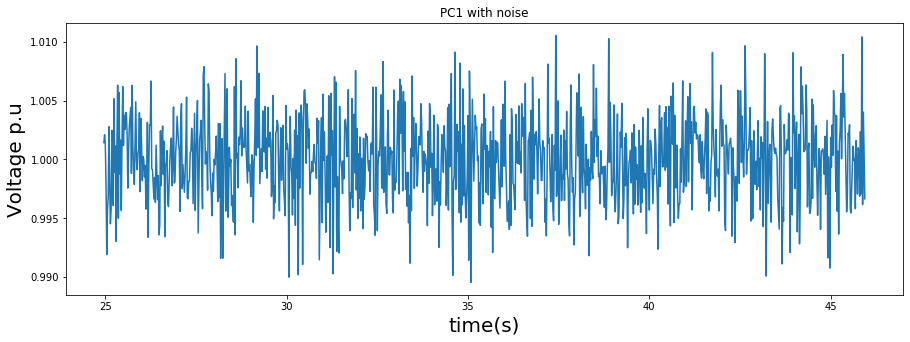

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


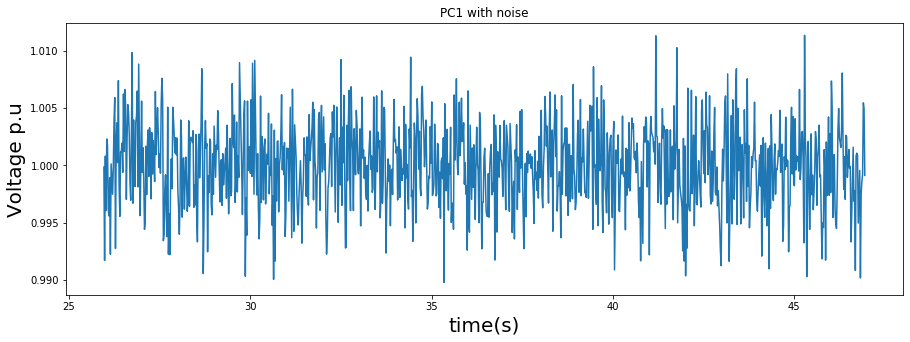

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


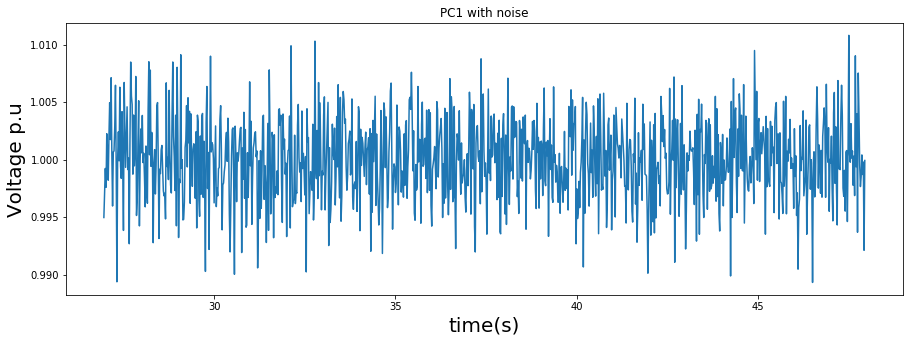

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


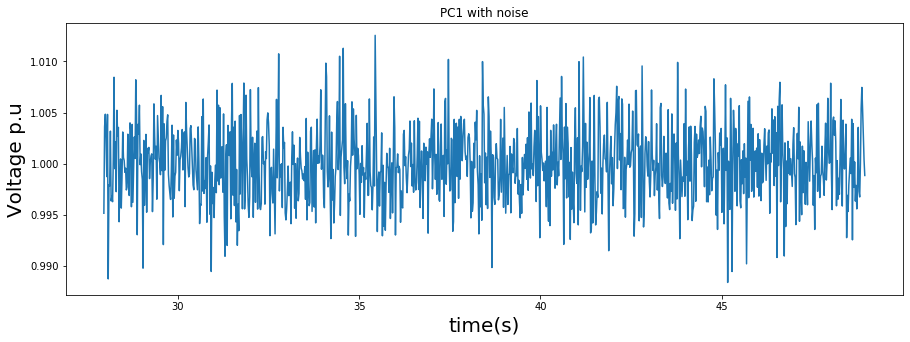

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


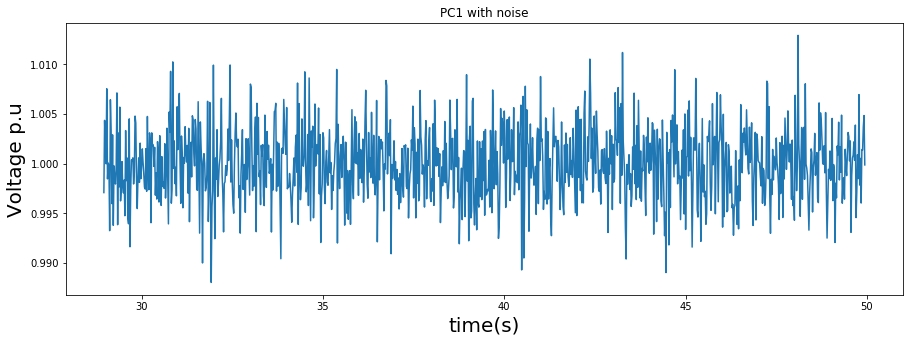

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


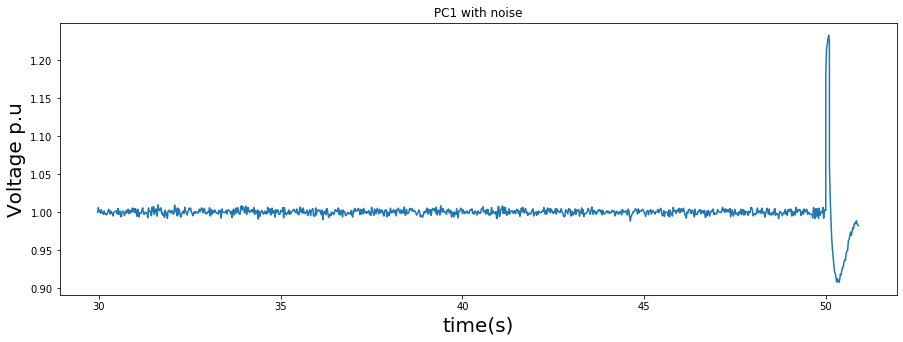

ll: 8
kd 66
o 1
N 13
ll: 8
kd 66
o 1
N 13
shape 14
--------------------------------------------EWT------------------------------------
I_frequency: 0.8494752819336934
I_damping: -0.043096059375431914
--------------------------------------------VMD------------------------------------


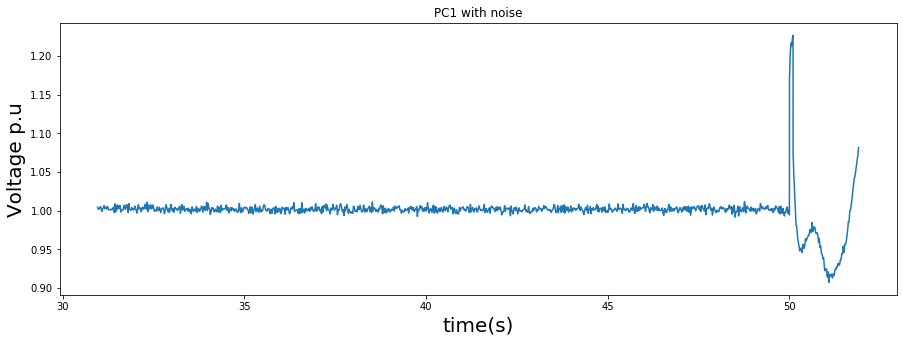

ll: 8
kd 66
o 1
N 13
ll: 8
kd 66
o 1
N 13
shape 14
--------------------------------------------EWT------------------------------------
I_frequency: 0.42321870237501763
I_damping: -0.055292090303873165
--------------------------------------------VMD------------------------------------


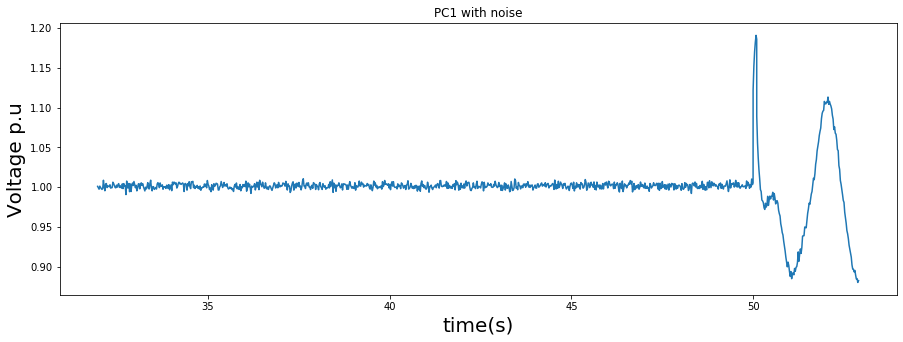

ll: 8
kd 66
o 1
N 12
ll: 8
kd 66
o 1
N 12
shape 13
--------------------------------------------EWT------------------------------------
I_frequency: 0.47099962053613476
I_damping: -0.06073689076552991
--------------------------------------------VMD------------------------------------


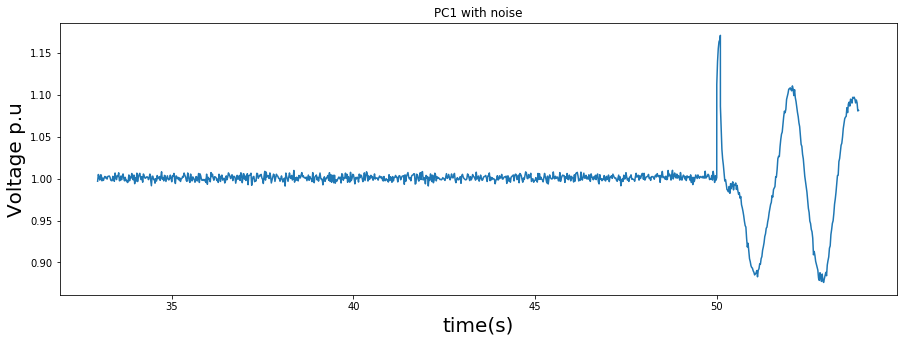

ll: 8
kd 66
o 1
N 10
ll: 8
kd 66
o 1
N 10
shape 11
--------------------------------------------EWT------------------------------------
I_frequency: 0.47105032674832203
I_damping: -0.0060092515544862765
--------------------------------------------VMD------------------------------------


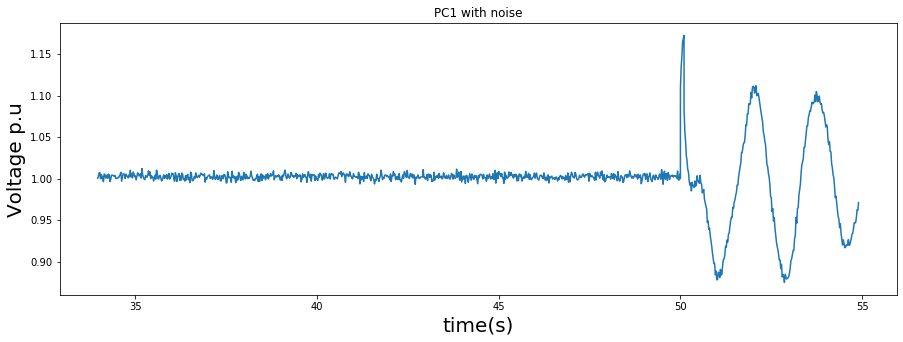

ll: 8
kd 66
o 1
N 9
ll: 8
kd 66
o 1
N 9
shape 10
--------------------------------------------EWT------------------------------------
I_frequency: 0.6141833874239986
I_damping: -0.039538084390602315
--------------------------------------------VMD------------------------------------


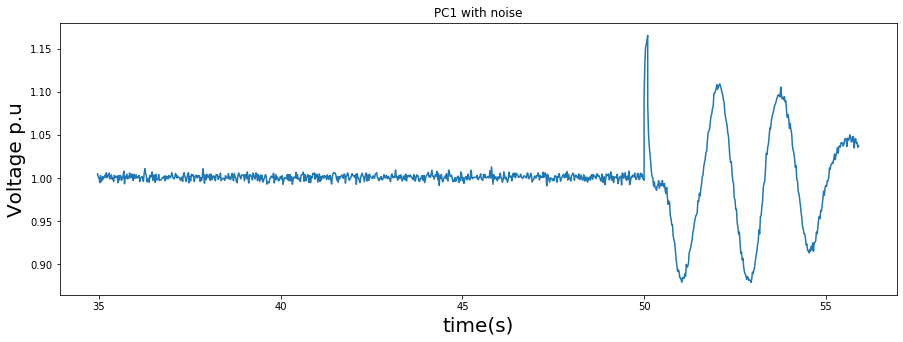

ll: 8
kd 66
o 1
N 10
ll: 8
kd 66
o 1
N 10
shape 11
--------------------------------------------EWT------------------------------------
I_frequency: 0.4239362788054868
I_damping: -0.011602450433768001
--------------------------------------------VMD------------------------------------


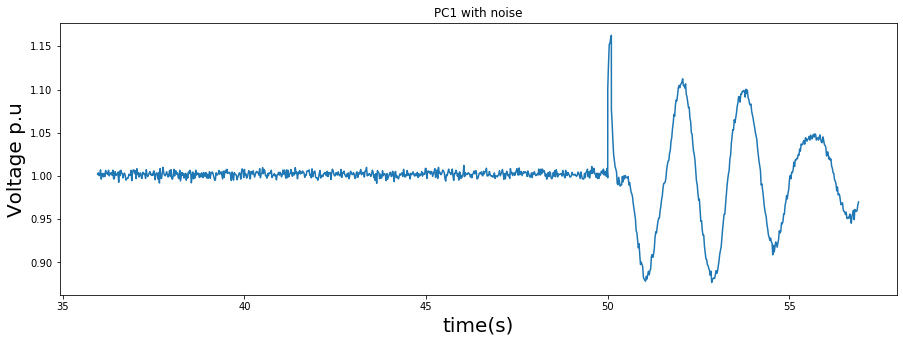

ll: 8
kd 66
o 1
N 9
ll: 8
kd 66
o 1
N 9
shape 10
--------------------------------------------EWT------------------------------------
I_frequency: 0.47178640881699446
I_damping: -0.055924095860500504
--------------------------------------------VMD------------------------------------


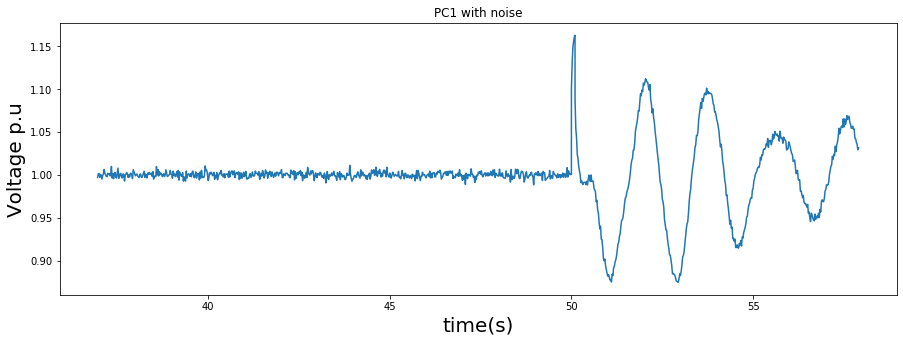

ll: 8
kd 66
o 1
N 10
ll: 8
kd 66
o 1
N 10
shape 11
--------------------------------------------EWT------------------------------------
I_frequency: 0.47137188596252666
I_damping: -0.020753939680784296
--------------------------------------------VMD------------------------------------


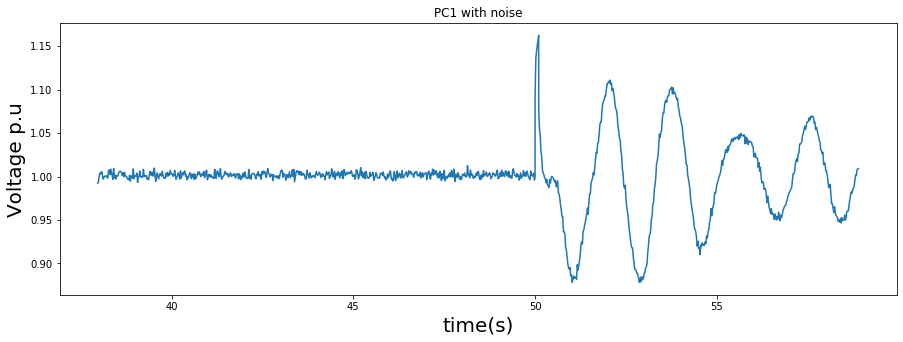

ll: 8
kd 66
o 1
N 9
ll: 8
kd 66
o 1
N 9
shape 10
--------------------------------------------EWT------------------------------------
I_frequency: 0.5192602764502579
I_damping: -0.03769782236839066
--------------------------------------------VMD------------------------------------


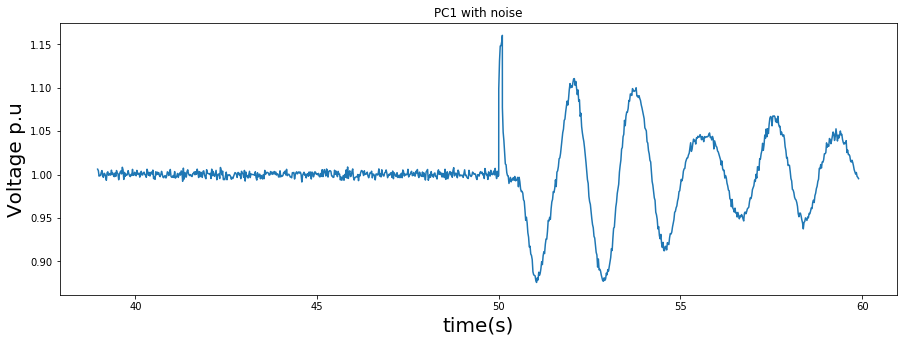

ll: 8
kd 66
o 1
N 10
ll: 8
kd 66
o 1
N 10
shape 11
--------------------------------------------EWT------------------------------------
I_frequency: 0.6557553061383253
I_damping: -0.0269110232200511
--------------------------------------------VMD------------------------------------


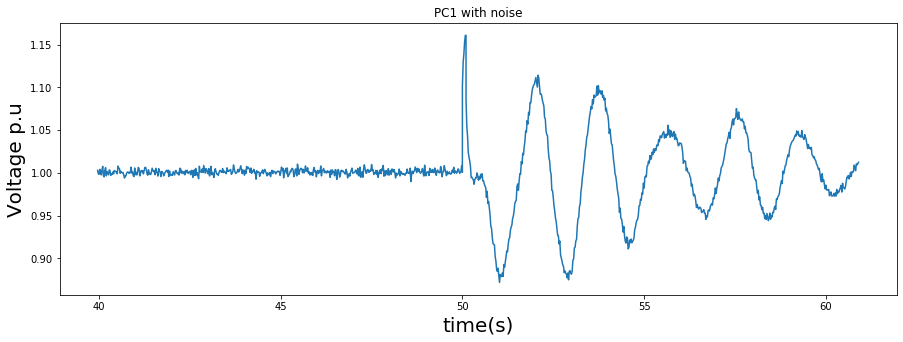

ll: 8
kd 66
o 1
N 10
ll: 8
kd 66
o 1
N 10
shape 11
--------------------------------------------EWT------------------------------------
I_frequency: 0.5179513513359938
I_damping: -0.036337779547108554
--------------------------------------------VMD------------------------------------


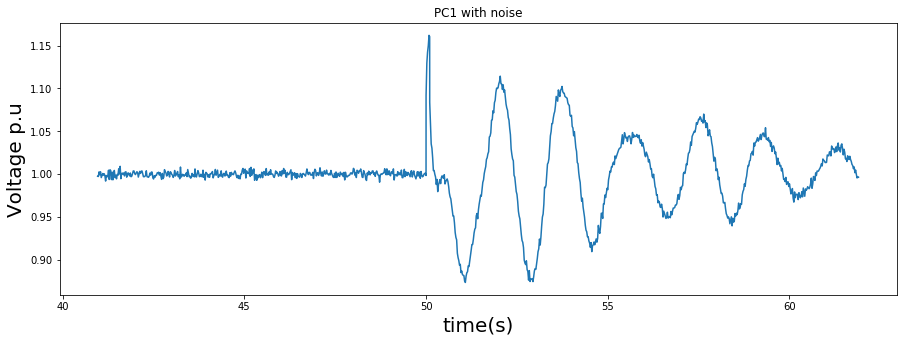

ll: 8
kd 66
o 1
N 9
ll: 8
kd 66
o 1
N 9
shape 10
--------------------------------------------EWT------------------------------------
I_frequency: 0.5185511799672791
I_damping: -0.021121956771563494
--------------------------------------------VMD------------------------------------


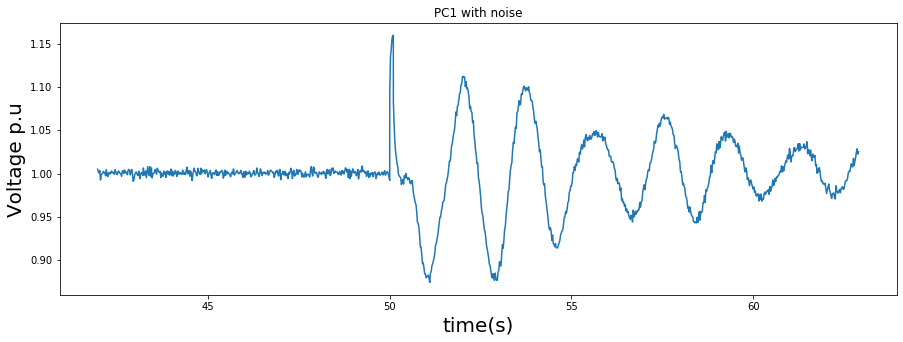

ll: 8
kd 66
o 1
N 10
ll: 8
kd 66
o 1
N 10
shape 11
--------------------------------------------EWT------------------------------------
I_frequency: 0.522221084497878
I_damping: -0.016790973208644373
--------------------------------------------VMD------------------------------------


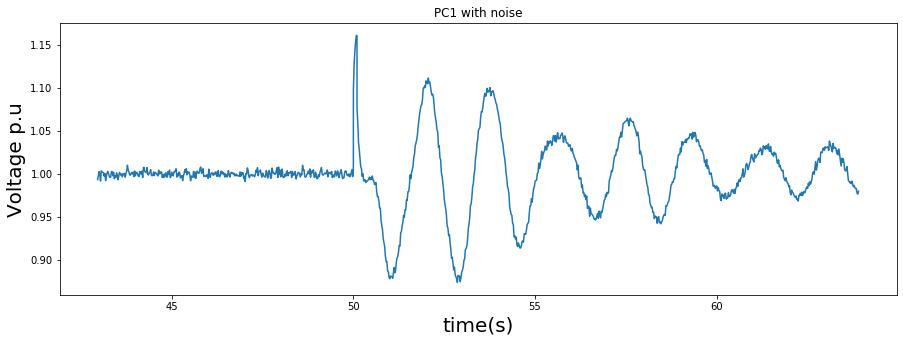

ll: 8
kd 66
o 1
N 9
ll: 8
kd 66
o 1
N 9
shape 10
--------------------------------------------EWT------------------------------------
I_frequency: 0.520039592403662
I_damping: -0.007143116376038906
--------------------------------------------VMD------------------------------------


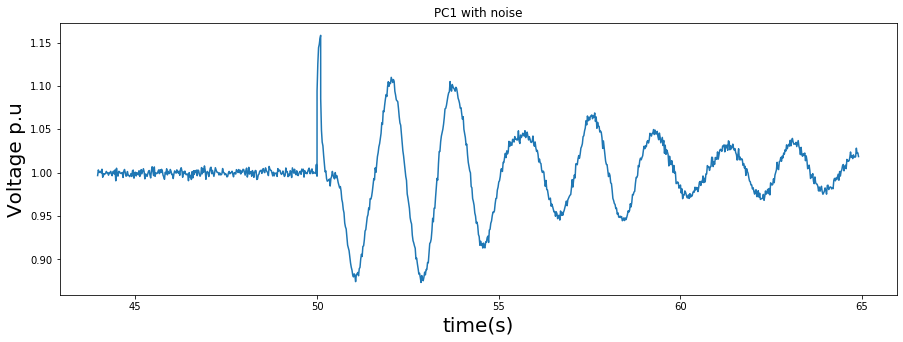

ll: 8
kd 66
o 1
N 8
ll: 8
kd 66
o 1
N 8
shape 9
--------------------------------------------EWT------------------------------------
I_frequency: 0.5182057692113131
I_damping: -0.024521357227611132
--------------------------------------------VMD------------------------------------


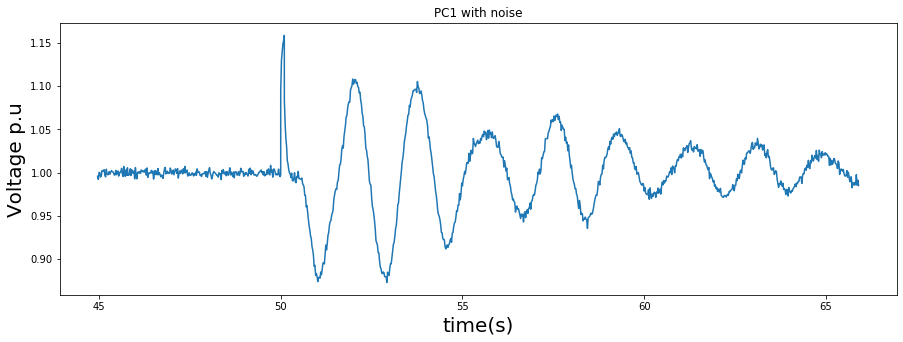

ll: 8
kd 66
o 1
N 8
ll: 8
kd 66
o 1
N 8
shape 9
--------------------------------------------EWT------------------------------------
I_frequency: 0.5236044796075305
I_damping: -0.0035394795307210694
--------------------------------------------VMD------------------------------------


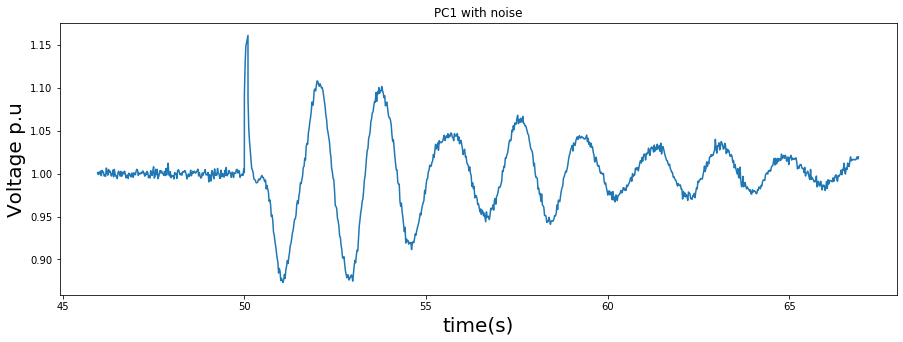

ll: 8
kd 66
o 1
N 9
ll: 8
kd 66
o 1
N 9
shape 10
--------------------------------------------EWT------------------------------------
I_frequency: 0.5223171573168209
I_damping: 0.005333353931551901
--------------------------------------------VMD------------------------------------


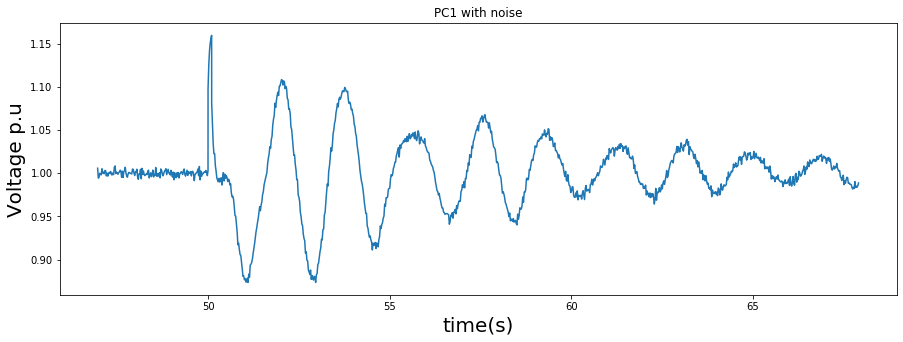

ll: 8
kd 66
o 1
N 8
ll: 8
kd 66
o 1
N 8
shape 9
--------------------------------------------EWT------------------------------------
I_frequency: 0.5218084443159484
I_damping: 0.002456100906878811
--------------------------------------------VMD------------------------------------


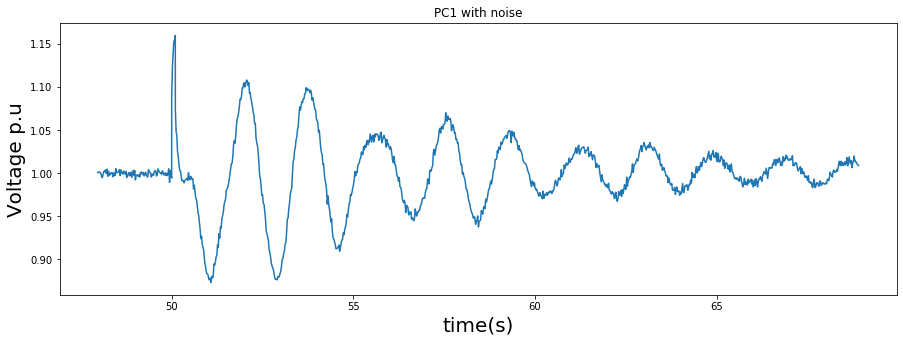

ll: 8
kd 66
o 1
N 8
ll: 8
kd 66
o 1
N 8
shape 9
--------------------------------------------EWT------------------------------------
I_frequency: 0.5239807721049993
I_damping: -6.0268812451073905e-05
--------------------------------------------VMD------------------------------------


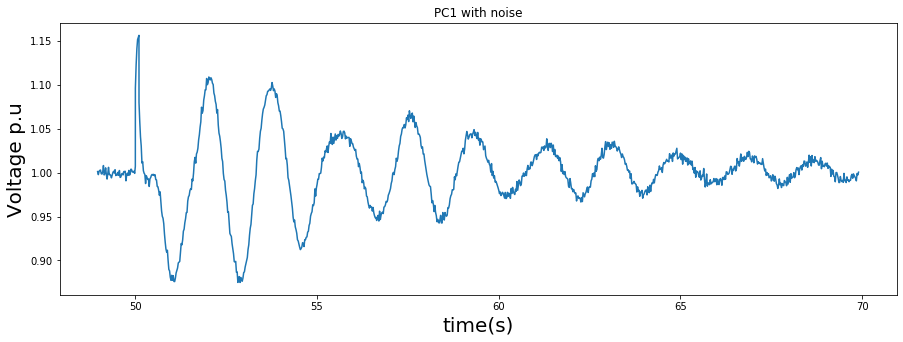

ll: 8
kd 66
o 1
N 8
ll: 8
kd 66
o 1
N 8
shape 9
--------------------------------------------EWT------------------------------------
I_frequency: 0.5219160899344885
I_damping: 0.03156131930692376
--------------------------------------------VMD------------------------------------


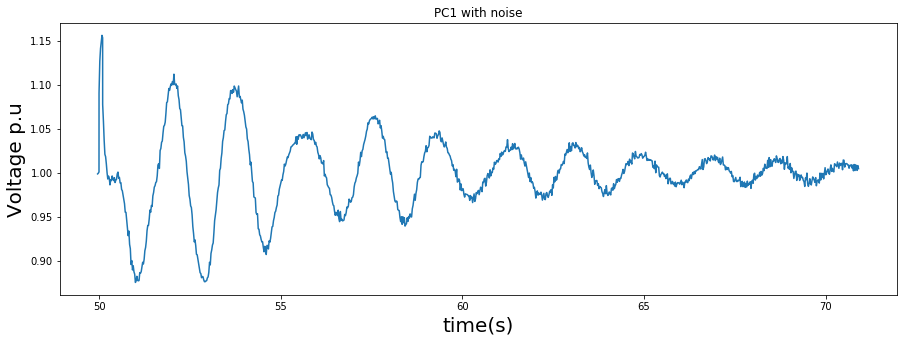

ll: 8
kd 66
o 1
N 9
ll: 8
kd 66
o 1
N 9
shape 10
--------------------------------------------EWT------------------------------------
I_frequency: 0.5190498425294471
I_damping: 0.025668364833794987
--------------------------------------------VMD------------------------------------


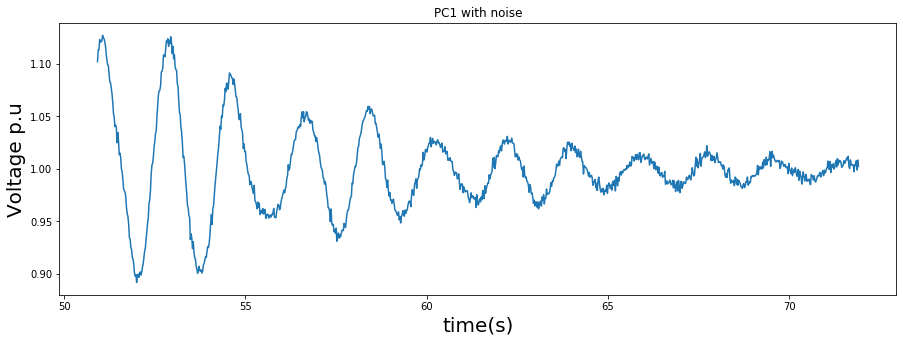

ll: 8
kd 66
o 1
N 5
ll: 8
kd 66
o 1
N 5
shape 6
--------------------------------------------EWT------------------------------------
I_frequency: 0.5187428818030644
I_damping: 0.03552934173173117
--------------------------------------------VMD------------------------------------


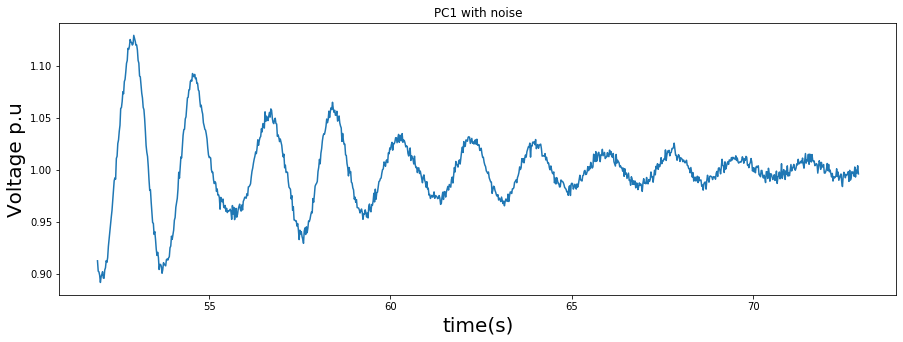

ll: 8
kd 66
o 1
N 5
ll: 8
kd 66
o 1
N 5
shape 6
--------------------------------------------EWT------------------------------------
I_frequency: 0.5185186781975737
I_damping: 0.04866989841287695
--------------------------------------------VMD------------------------------------


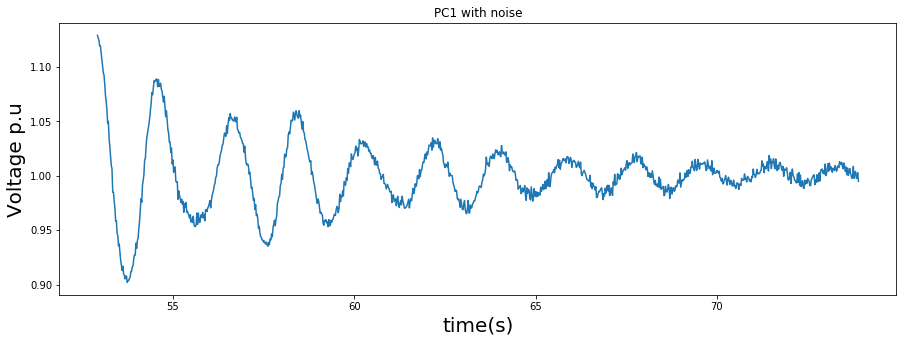

ll: 8
kd 66
o 1
N 5
ll: 8
kd 66
o 1
N 5
shape 6
--------------------------------------------EWT------------------------------------
I_frequency: 0.5184040119319706
I_damping: 0.04194225556246217
--------------------------------------------VMD------------------------------------


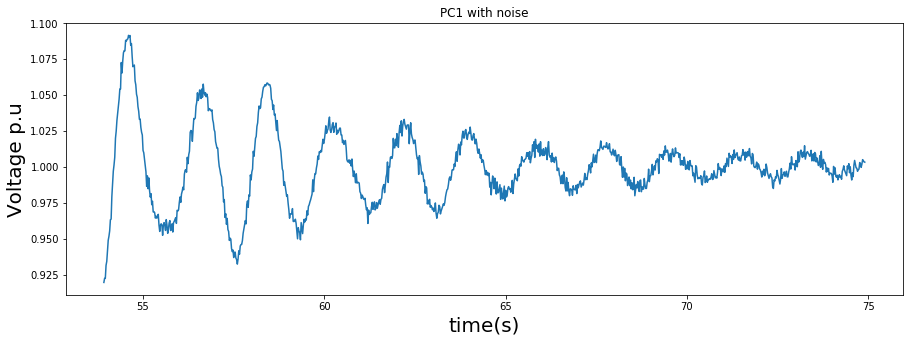

ll: 8
kd 66
o 1
N 4
ll: 8
kd 66
o 1
N 4
shape 5
--------------------------------------------EWT------------------------------------
I_frequency: 0.5659400602904466
I_damping: 0.0358883574804679
--------------------------------------------VMD------------------------------------


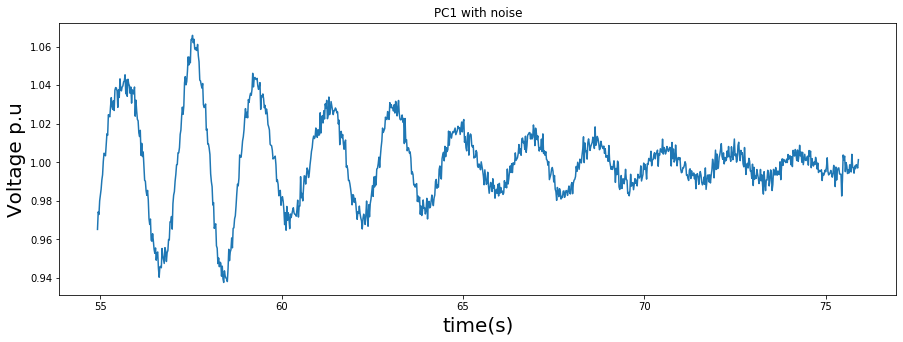

ll: 8
kd 66
o 1
N 3
ll: 8
kd 66
o 1
N 3
shape 4
--------------------------------------------EWT------------------------------------
I_frequency: 0.5659373469325807
I_damping: 0.03583849017308274
--------------------------------------------VMD------------------------------------


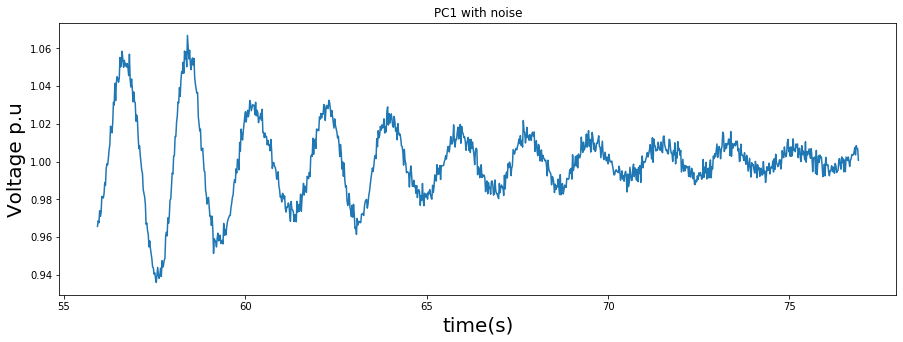

ll: 8
kd 66
o 1
N 3
ll: 8
kd 66
o 1
N 3
shape 4
--------------------------------------------EWT------------------------------------
I_frequency: 0.5658576503885266
I_damping: 0.03560479874157789
--------------------------------------------VMD------------------------------------


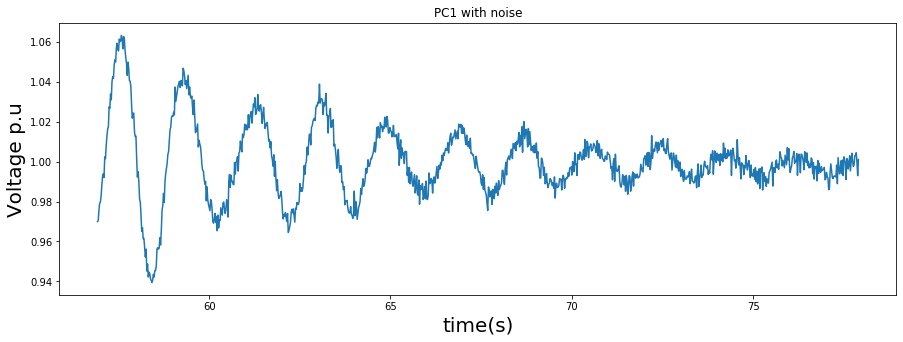

ll: 8
kd 66
o 1
N 3
ll: 8
kd 66
o 1
N 3
shape 4
--------------------------------------------EWT------------------------------------
I_frequency: 0.5657710456711939
I_damping: 0.03553046535752801
--------------------------------------------VMD------------------------------------


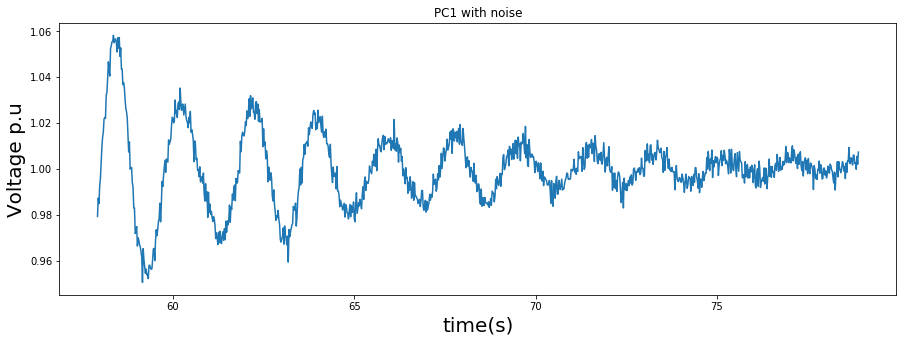

ll: 8
kd 66
o 1
N 3
ll: 8
kd 66
o 1
N 3
shape 4
--------------------------------------------EWT------------------------------------
I_frequency: 0.5653322595368702
I_damping: 0.026031043561336634
--------------------------------------------VMD------------------------------------


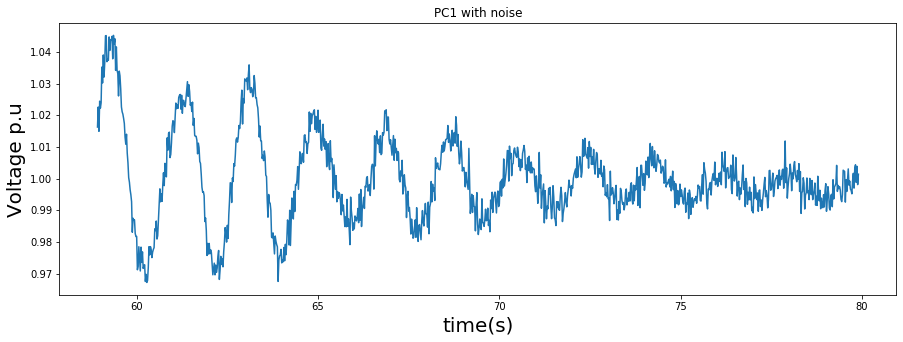

ll: 8
kd 66
o 1
N 3
ll: 8
kd 66
o 1
N 3
shape 4
--------------------------------------------EWT------------------------------------
I_frequency: 0.564177303266366
I_damping: 0.013301563894116658
--------------------------------------------VMD------------------------------------


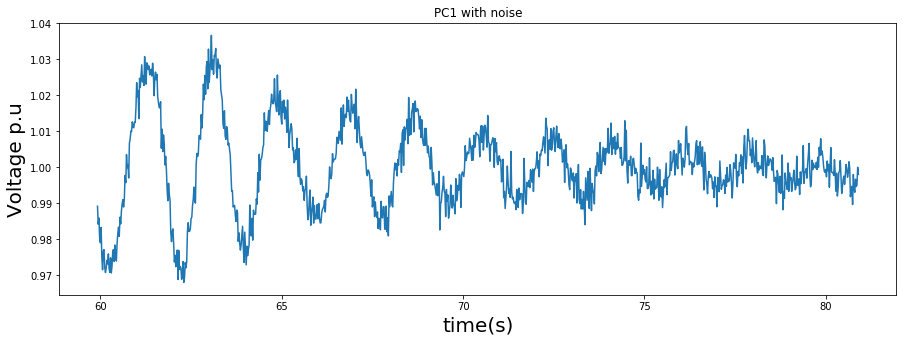

ll: 8
kd 66
o 1
N 2
ll: 8
kd 66
o 1
N 2
shape 3
--------------------------------------------EWT------------------------------------
I_frequency: 1.2309867688740823
I_damping: 0.00234076170354582
--------------------------------------------VMD------------------------------------


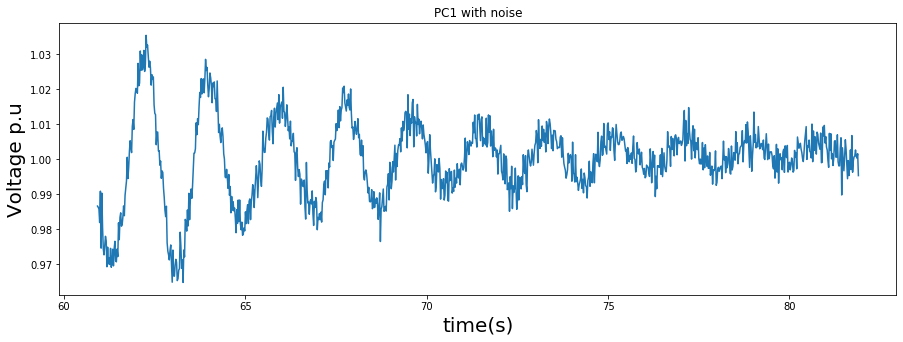

ll: 8
kd 66
o 1
N 2
ll: 8
kd 66
o 1
N 2
shape 3
--------------------------------------------EWT------------------------------------
I_frequency: 6.617365940824067
I_damping: 0.0016534471768936219
--------------------------------------------VMD------------------------------------


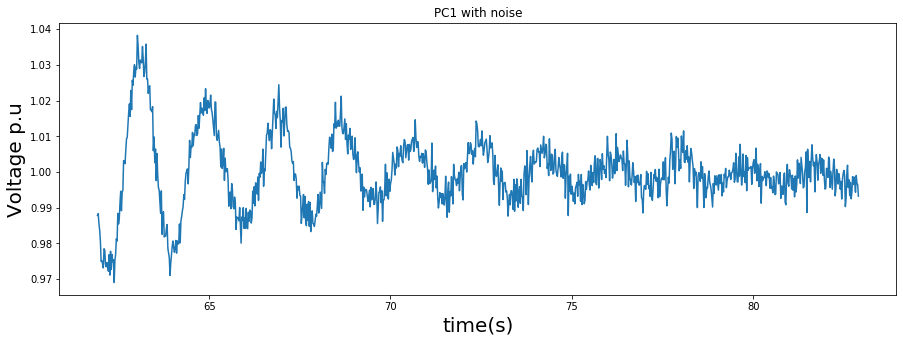

ll: 8
kd 66
o 1
N 3
ll: 8
kd 66
o 1
N 3
shape 4
--------------------------------------------EWT------------------------------------
I_frequency: 0.5191370349645512
I_damping: 0.03578486255352463
--------------------------------------------VMD------------------------------------


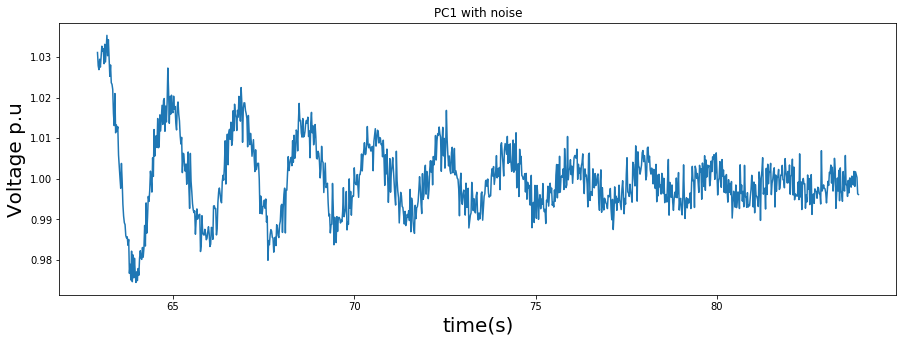

ll: 8
kd 66
o 1
N 2
ll: 8
kd 66
o 1
N 2
shape 3
--------------------------------------------EWT------------------------------------
I_frequency: 7.053440037470695
I_damping: 0.00047716827811551243
--------------------------------------------VMD------------------------------------


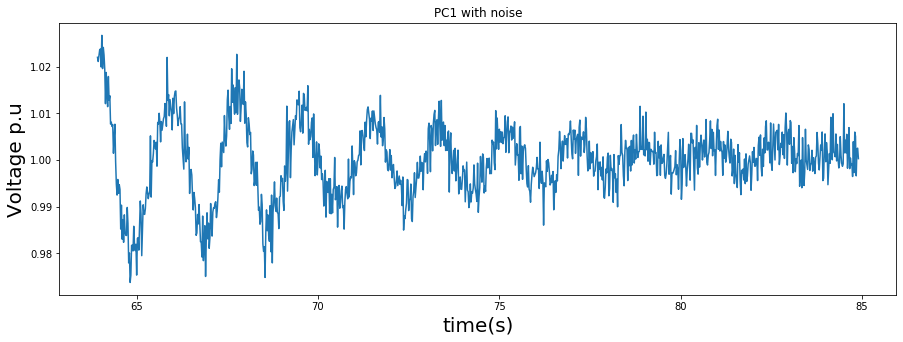

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


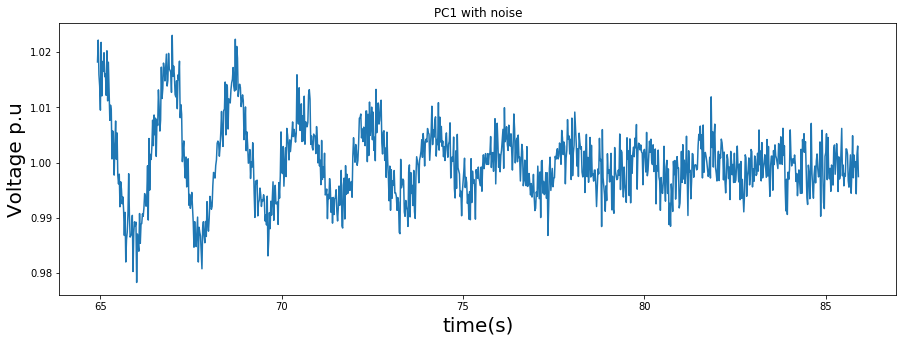

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


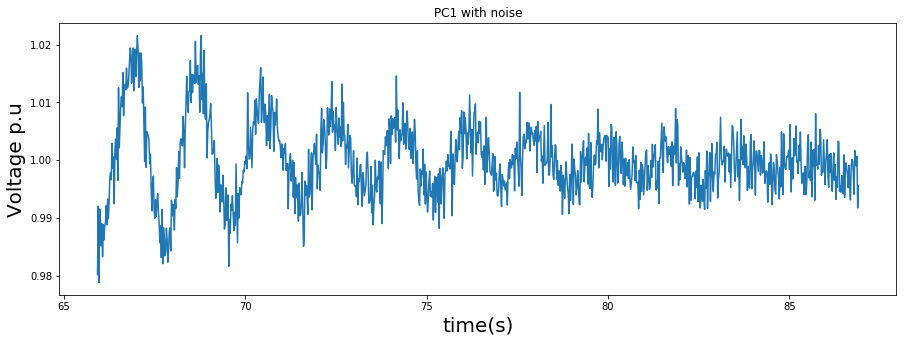

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


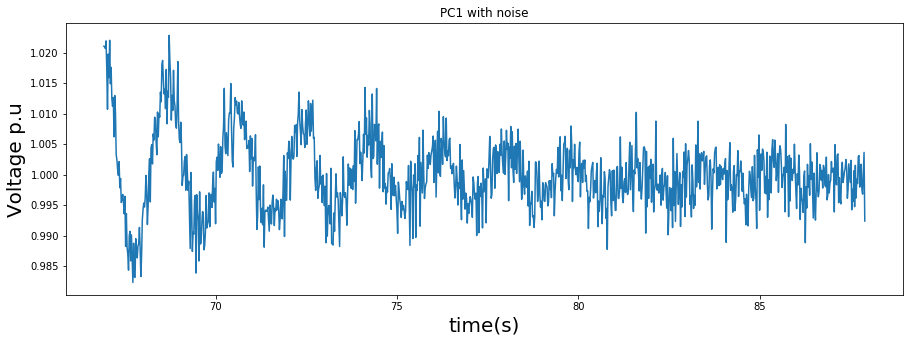

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


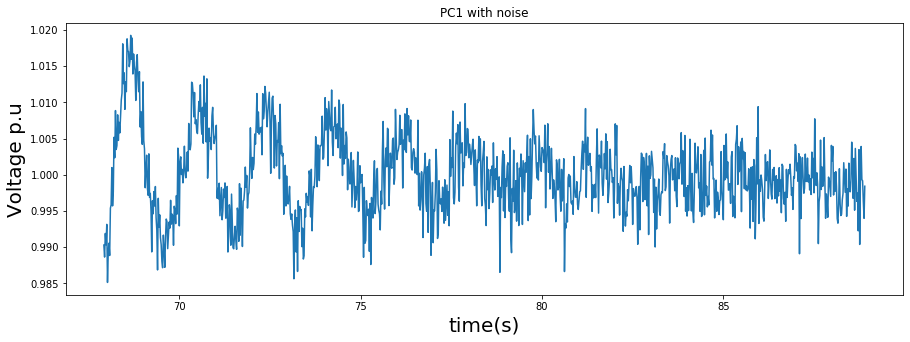

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


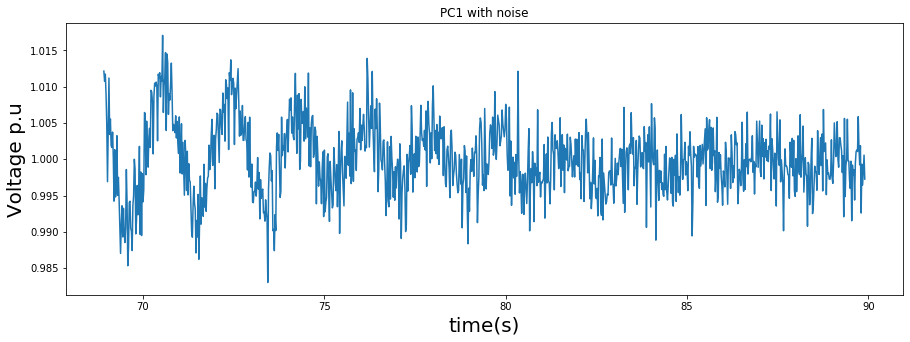

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


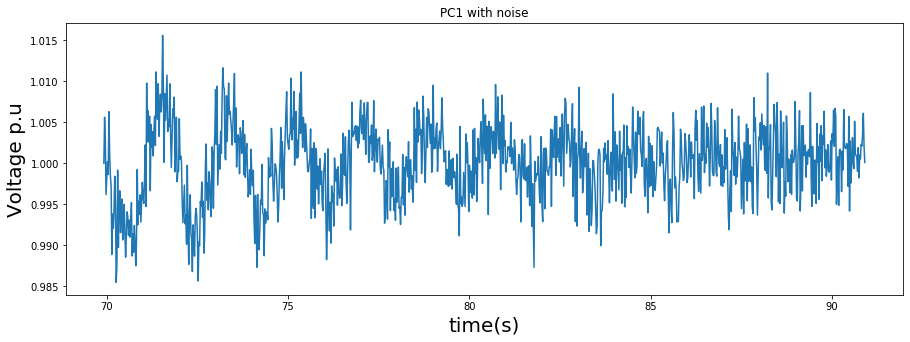

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


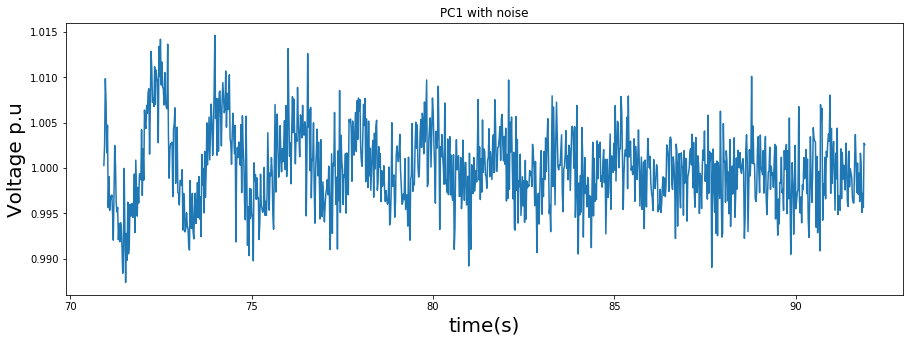

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


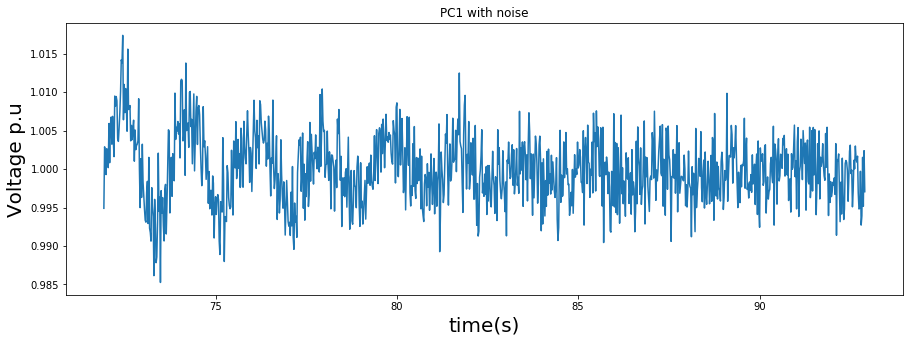

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


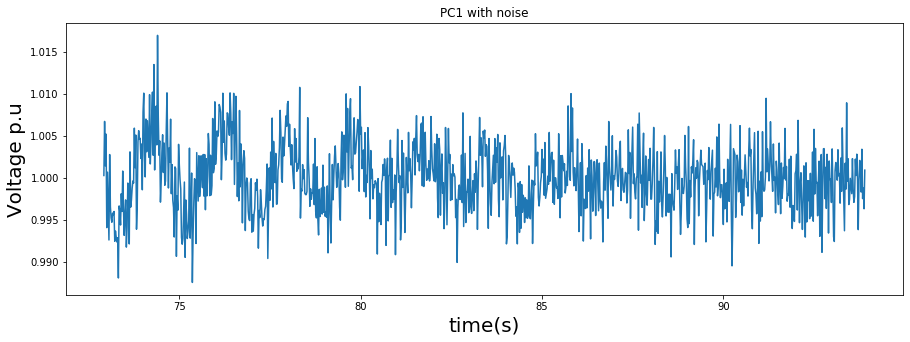

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


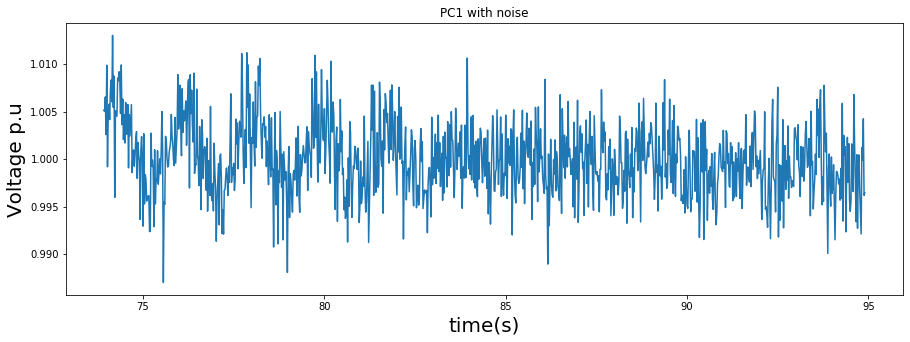

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


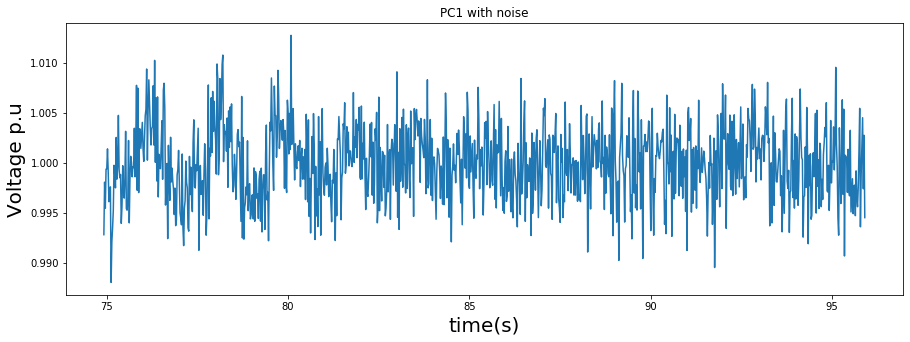

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


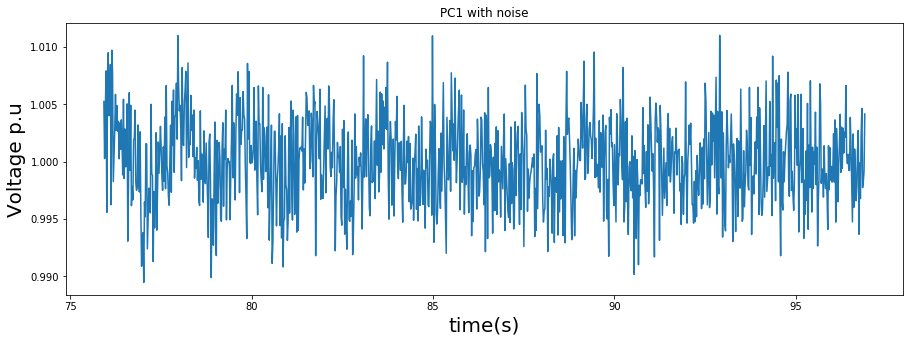

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


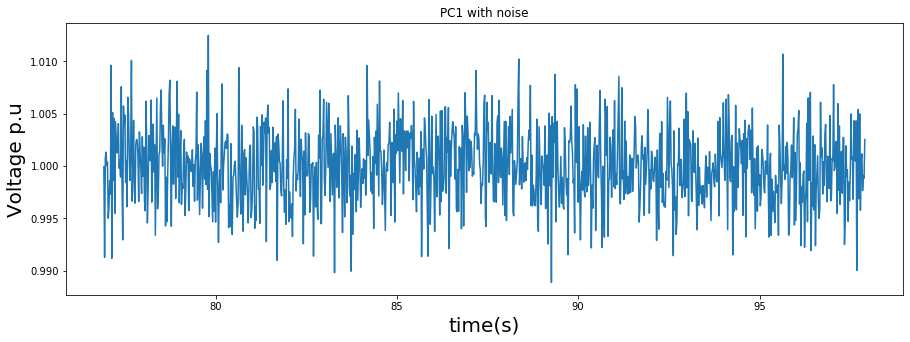

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


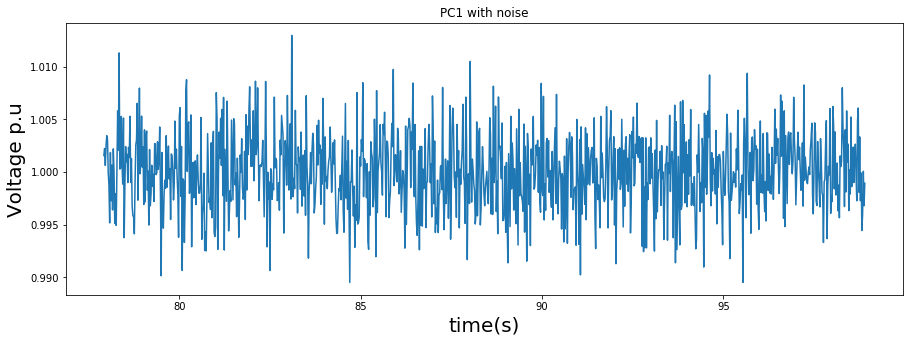

ll: 8
kd 66
o 1
N 1
ll: 8
kd 66
o 1
N 1
shape 2


In [337]:
ge,gp,Z,t1,t11 = get_ratio(vm,50,1000)

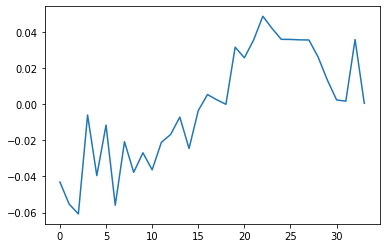

In [338]:
plt.plot(gp)

In [ ]:
# def mat_pen(y,thresh,delta_t):
#         import numpy as np
    
#        # matrix pencil method
#        # provides 
#         im_mode = y.shape[0]
#         lower_V = np.floor(im_mode / 2).astype(int)
#         # Initializes an empty mat_hankel matrix.
#         mat_hankel = np.array(())
#         # Creates a temporary mat_hankel matrix for every signal.
#         for col in y:
#             small_hank = np.zeros((im_mode - lower_V, lower_V + 1))
#             # Iterates through every row of the mat_hankel matrix.
#             for j in range(im_mode - lower_V):
#                 small_hank[j] = y[col][j:j + lower_V + 1]
#             # Vertically stacks the mat_hankel matrices, to increase its' size with more signals.
#             # The if statement is there to check for the first instance of the mat_hankel matrix, where the size is 0.
#             mat_hankel = np.vstack([mat_hankel, small_hank]) if mat_hankel.size else small_hank


#         # Takes a SVD of the mat_hankel matrix..
#         u, sigma, vh = np.linalg.svd(mat_hankel)
#         # Converts vH into v.
#         v = vh.conj().transpose()
#         # Gets the largest singular value.
#         large_val = sigma[0]
#         # Scales the values by the large singular value.
#         sigma = sigma / large_val
#         # Only keeps entries where the scaled value is greater than the threshold.
#         sigma = sigma[sigma > thresh]
#         # Rescales the singular values back to their original value.
#         sigma = sigma * large_val
#         # Creates a diagonal matrix with the singular values we kept.
#         diag_val = np.diag(sigma)

#         # Scales the size of the v matrix from SVD based on how many singular values we kept.
#         num_cols = diag_val.shape[1]
#         val_nu = v[:, 0:num_cols]

#         # Gets the v1 and v2 matrices.
#         m1 = val_nu[:-1, :]
#         m2 = val_nu[1:, :]

#         # Constructs the y1 and y2 matrices from v1/v2
#         Y1 = np.dot(m1.transpose(), m1)
#         Y2 = np.dot(m2.transpose(), m1)

#         # Gets the eigenvalues of the matrix pair.
#         z = sp.linalg.eig(Y2, Y1)[0]
        
        
#         ct_lambda = np.log(z) / delta_t
#         # Removes all complex conjugates with negative imaginary components.
#         ct_lambda = np.extract(np.imag(ct_lambda) >= 0, ct_lambda)
#         # Gets the list of frequencies.
#         freqs = np.imag(ct_lambda) / (2 * np.pi)
#         # Gets the list of damping percentages.
#         damping = -100 * (np.real(ct_lambda)) / (np.sqrt(np.square(np.real(ct_lambda)) + np.square(np.imag(ct_lambda))))
        
#         exp = np.arange(y.shape[0])
#         exp_col = np.asmatrix(exp).transpose()
#         # Constructs the Z matrix.
#         z_mat = np.power(np.asmatrix(z), exp_col)
#         # Solves for the mode shapes.
#         shape = np.linalg.lstsq(z_mat, y, rcond=None)[0]
#         # Gets the associated magnitudes and phases.
#         magnitude = np.absolute(shape)
#         angle = np.angle(shape)

#         return(freqs,damping,magnitude,angle)

SIGNAL
--------

In [ ]:
# from pylab import *
# x = linspace(0,1000,num=1000)
# y = 1 * sin(2*pi*x/10 + 0) * exp(x/500)
# # y = 0.5 * sin(2*pi*x/17 + 1.2) * exp(-x/100)
# # y = 2 * sin(2*pi*x/50 - 0.25) * exp(-x/50)
# # y = y1 + y2 + y3
# y=y
# figure(figsize=(20,10))
# plot(y)

In [ ]:
# from pylab import *
# # Fs=10 Hz
# x = linspace(0,40,num=400)
# y1 = 4  * exp((-0.05) *(1.8873*x))*(sin(0.6*pi*x)+cos(0.6*pi*x))

In [ ]:
# plt.plot(y1)

In [ ]:
# g=y1
# fs=10
# ta=x
# g=y
# fs=1
# ta=x

In [ ]:
ls=54
us=1054

In [ ]:
g=f1[ls:us]
fs=50
ta=time[ls:us]

In [ ]:
# g=f1
# fs=50
# ta = time

In [ ]:
        N = 7 #number of supports
        detect = "locmax" #detection mode: locmax, locmaxmin, locmaxminf
        reg = 'none' #spectrum regularization - it is smoothed with an average (or gaussian) filter 
        lengthFilter = 0 #length or average or gaussian filter
        sigmaFilter = 0 #sigma of gaussian filter
        
        a=3
        fs=50

#         ewt,  mfb ,boundaries = ewtpy.EWT1D(g, 
#                                             N = N,
#                                             log = 0,
#                                             detect = detect, 
#                                             completion = 0, 
#                                             reg = reg, 
#                                             lengthFilter = lengthFilter,
#                                             sigmaFilter = sigmaFilter)

        ewt,  mfb ,boundaries =  EWT1D(g, N = 5, log = 0,detect = "locmax", completion = 0,
                                       reg = 'average', lengthFilter = 10,sigmaFilter = 5, 
                                       threshold = 0, step = 0.3)
            
        
#         ewt,boundaries = get_wavelet(g,0,2)



        analytic_signal = hilbert(ewt[:,a])
        amplitude_envelope = np.abs(analytic_signal)
        instantaneous_phase = np.unwrap(np.angle(analytic_signal))
        instantaneous_frequency = (np.diff(instantaneous_phase) /
                                    (2.0*np.pi) * fs)

        
#         fig, ax = plt.subplots(figsize=(15, 5))
#         plt.plot(ta[:-1],instantaneous_frequency)
        b=2
        c=-3
        
        IA = amplitude_envelope
        IF = instantaneous_frequency
        IF1 = instantaneous_frequency
        plt.plot(IA)
        plt.show()
        plt.plot(IF)
        plt.show()
        #===============================================
        xs = ta
        data = ewt[:,a]
        peakind = signal.find_peaks_cwt(data, np.arange(1,2))
        peak = pd.DataFrame(data[peakind],peakind)
        AE = lowpassfilter(IA,0.0005)

#         dp1 = AE[peak.index[b]:peak.index[c]]
#         fp1= IF[peak.index[b]:peak.index[c]]
# #         fp2= IF[peak.index[b]:peak.index[c]]
#         N = peak.index[b:c]
#         n = len(N)
#         damp1 = []
#         ratio1 = []
#         for i in range(0,dp1.shape[0]-1):
#             d1 = 1/n*(np.log(dp1[i]/dp1[i+1]))*100
#             d2 = d1/(np.sqrt(2*math.pi)**2 + (d1)**2)
#             d3 = d2
#             ratio1.append(d3)
#             damp1.append(d2)

        print('ta',len(IA))
        tat=ta[peak.index[b]:peak.index[c]]
        IFT=IF[peak.index[b]:peak.index[c]]
        dp1 = AE[peak.index[b]:peak.index[c]]
        
            
        d1 = np.log(dp1[0]/dp1[:])
        d5= (np.log(dp1[0]/dp1[:]))/(2*pi*IFT[:]*tat[:])
        d2 = np.sqrt((d5**2)/(1+d5**2))
        print('damping',np.mean(d2))
        plt.plot(tat,d2)
        plt.xlabel('Time (s)')
        plt.ylabel('DR')
        plt.show()

            
            
#         dp1 = AE[peak.index[b]:peak.index[c]]
#         fp1= IF[peak.index[b]:peak.index[c]]
# #         fp2= IF[peak.index[b]:peak.index[c]]
#         N = peak.index[b:c]
#         n = len(N)
#         damp1 = []
#         ratio1 = []
#         for i in range(0,dp1.shape[0]-1):
#             d1 = 1/n*(np.log(dp1[0]/dp1[i+1]))
#             d5= d1/(2*pi*IF*ta[:-1])
#             d2 = np.sqrt(d5/(1+d5))
#             damp1.append(d2)
        
        
#         plt.plot(damp1)
#         plt.show()
#         fig, ax = plt.subplots(figsize=(15, 5))
#         plt.plot(ta,data+1, linewidth=0.8, linestyle='--', c = 'k')
#         plt.plot(ta,AE[:len(ta)]+1, label='envelope', c = 'k')
#         plt.plot(xs[peakind], data[peakind]+1, 'o', c = 'red',markersize=9)
#         plt.axvline(x = xs[peakind][b], c = 'b', ls = '--')
#         plt.axvline(x = xs[peakind][c], c = 'b', ls = '--')
# #         plt.title('Amplitude envelop, IMF and Damping points', size = 20)
#         plt.xlabel('Voltage p.u',size=20)
#         plt.xlabel('Time (s)',size=20)
#         plt.xticks(np.arange(ta[0],ta[-1], 3))
#         plt.show()


#         rec = lowpassfilter(damp1,0.2)
#         fig, ax = plt.subplots(figsize=(15, 5))
#         xx = ta[peak.index[b]:peak.index[c]]
#         plt.plot(xx[:-1],damp1, alpha = 0.5)
#         plt.plot(xx[:-1],rec[0:len(damp1)], ls ='--',c = 'b')
#         plt.ylabel('Damping Ratio (%)', size = 20)
#         plt.xlabel('Time (sec)', size = 20)
#         plt.axhline(y = 0, ls= ':', c = 'k', alpha =0.7)
#         plt.axhline(y = -0.0039, ls= ':', c = 'k', alpha =0.7)
#         plt.xticks(np.arange(xx[0],xx[-1],3))
#         plt.show()
#         #==============
       

In [ ]:
        N = 7 #number of supports
        detect = "locmax" #detection mode: locmax, locmaxmin, locmaxminf
        reg = 'none' #spectrum regularization - it is smoothed with an average (or gaussian) filter 
        lengthFilter = 0 #length or average or gaussian filter
        sigmaFilter = 0 #sigma of gaussian filter
        
        a=3

#         ewt,  mfb ,boundaries = ewtpy.EWT1D(g, 
#                                             N = N,
#                                             log = 0,
#                                             detect = detect, 
#                                             completion = 0, 
#                                             reg = reg, 
#                                             lengthFilter = lengthFilter,
#                                             sigmaFilter = sigmaFilter)

        ewt,  mfb ,boundaries =  EWT1D(g, N = 5, log = 0,detect = "locmax", completion = 0,
                                       reg = 'average', lengthFilter = 10,sigmaFilter = 5, 
                                       threshold = 0, step = 0.3)
            
        
#         ewt,boundaries = get_wavelet(g,0,2)



        analytic_signal = hilbert(ewt[:,a])
        amplitude_envelope = np.abs(analytic_signal)
        instantaneous_phase = np.unwrap(np.angle(analytic_signal))
        instantaneous_frequency = (np.diff(instantaneous_phase) /
                                    (2.0*np.pi) * fs)

        
#         fig, ax = plt.subplots(figsize=(15, 5))
#         plt.plot(ta[:-1],instantaneous_frequency)
        
        IA = amplitude_envelope
        IF = instantaneous_frequency
        IF1 = instantaneous_frequency
        plt.plot(IA)
        plt.show()
        plt.plot(IF)
        plt.show()
        #===============================================
        xs = ta
        data = ewt[:,a]
        peakind = signal.find_peaks_cwt(data, np.arange(1,2))
        peak = pd.DataFrame(data[peakind],peakind)
        AE = lowpassfilter(IA,0.0000000000000000005)
        b=2
        c=-3
        dp1 = AE[peak.index[b]:peak.index[c]]
        fp1= IF[peak.index[b]:peak.index[c]]
#         fp2= IF[peak.index[b]:peak.index[c]]
        N = peak.index[b:c]
        n = len(N)
        damp1 = []
        ratio1 = []
        for i in range(0,dp1.shape[0]-1):
            d1 = 1/n*(np.log(dp1[i]/dp1[i+1]))*100
            d2 = d1/(np.sqrt(2*math.pi)**2 + (d1)**2)
            d3 = d2
            ratio1.append(d3)
            damp1.append(d2)

        print('ta',len(IA))
        

        
        plt.plot(damp1)
        plt.show()
        fig, ax = plt.subplots(figsize=(15, 5))
        plt.plot(ta,data+1, linewidth=0.8, linestyle='--', c = 'k')
        plt.plot(ta,AE[:len(ta)]+1, label='envelope', c = 'k')
        plt.plot(xs[peakind], data[peakind]+1, 'o', c = 'red',markersize=9)
        plt.axvline(x = xs[peakind][b], c = 'b', ls = '--')
        plt.axvline(x = xs[peakind][c], c = 'b', ls = '--')
#         plt.title('Amplitude envelop, IMF and Damping points', size = 20)
        plt.xlabel('Voltage p.u',size=20)
        plt.xlabel('Time (s)',size=20)
        plt.xticks(np.arange(ta[0],ta[-1], 3))
        plt.show()


        rec = lowpassfilter(damp1,0.2)
        fig, ax = plt.subplots(figsize=(15, 5))
        xx = ta[peak.index[b]:peak.index[c]]
        plt.plot(xx[:-1],damp1, alpha = 0.5)
        plt.plot(xx[:-1],rec[0:len(damp1)], ls ='--',c = 'b')
        plt.ylabel('Damping Ratio (%)', size = 20)
        plt.xlabel('Time (sec)', size = 20)
        plt.axhline(y = 0, ls= ':', c = 'k', alpha =0.7)
        plt.axhline(y = -0.0039, ls= ':', c = 'k', alpha =0.7)
        plt.xticks(np.arange(xx[0],xx[-1],3))
        plt.show()
        #==============
       

In [ ]:
print(np.mean(IF),np.sum(ratio1))

In [ ]:

        n = len(N)
        damp2 = []
        ratio2 = []
        for i in range(0,dp1.shape[0]-1):
            d1 = 1/(n)*(np.log(dp1[0]/dp1[i+1]))
            d2 = np.sqrt((d1**2)/((2*math.pi)**2 + (d1)**2))
            d3 = d2
            ratio2.append(d3)
            damp2.append(d2)
        print(np.mean(d2))
        plt.plot(xx[:-1],damp2)
        plt.xlabel('Time (s)')
        plt.ylabel('DR')
        plt.show()
        plt.plot(xx,fp1)
        plt.show()

In [ ]:

        n = len(N)
        damp2 = []
        ratio2 = []
        for i in range(0,dp1.shape[0]-1):
            d1 = 1/(n)*(np.log(dp1[0]/dp1[i+1]))
            d2 = d1/(np.sqrt(2*math.pi)**2 + (d1)**2)
            d3 = d2
            ratio2.append(d3)
            damp2.append(d2)
        plt.plot(xx[:-1],damp2)
        plt.show()
        plt.plot(xx,fp1)
        plt.show()

In [ ]:
ts1=xx[:-1]
ds1=damp2

#CALCULATE MATRIX PENCIL
---------

In [ ]:
# g=f2[ls:us]
# fs=50
# ta=time[ls:us]

In [ ]:
# x=ta

In [ ]:
# delta_t=x[3]-x[2]

In [ ]:
# delta_t=ta[3]-ta[2]

In [ ]:
# sigg=pd.DataFrame()
# sigg['PC1']=g
# sigg['Time']=ta
# sic=pd.DataFrame(g)

In [ ]:
# freqs,damping,magnitude,angle= mat_pen(sic,0.002,delta_t)

In [ ]:
# freqs,damping

#CALCULATE DAMPING FROM PAPER
--------

In [ ]:
# # pc,ttt= pca_noise(um,'yes','PC1',40)

# aa=2600
# bb=5000

# vm= vol_mag.iloc[aa:bb,0:20].reset_index(drop=False)
# um= vol_mag.iloc[aa:bb,1:20].reset_index(drop=False)
# time = vol_mag.iloc[aa:bb,].index

# t =ttt
# f1 = pc['PC1']
# f2 = pc['PC2']
# f3 = pc['PC3']

In [ ]:
# plt.plot(f1[54:1104])

In [ ]:
ls=54
us=1054

In [ ]:
g=f2[ls:us]
fs=50
ta=time[ls:us]

In [ ]:
len(ta)

In [ ]:
        N = 7 #number of supports
        detect = "locmax" #detection mode: locmax, locmaxmin, locmaxminf
        reg = 'none' #spectrum regularization - it is smoothed with an average (or gaussian) filter 
        lengthFilter = 0 #length or average or gaussian filter
        sigmaFilter = 0 #sigma of gaussian filter
        
        a=3

#         ewt,  mfb ,boundaries = ewtpy.EWT1D(g, 
#                                             N = N,
#                                             log = 0,
#                                             detect = detect, 
#                                             completion = 0, 
#                                             reg = reg, 
#                                             lengthFilter = lengthFilter,
#                                             sigmaFilter = sigmaFilter)

        ewt,  mfb ,boundaries =  EWT1D(g, N = 5, log = 0,detect = "locmax", completion = 0,
                                       reg = 'average', lengthFilter = 10,sigmaFilter = 5, 
                                       threshold = 0, step = 0.3)
            
        
#         ewt,boundaries = get_wavelet(g,0,2)



        analytic_signal = hilbert(ewt[:,a])
        amplitude_envelope = np.abs(analytic_signal)
        instantaneous_phase = np.unwrap(np.angle(analytic_signal))
        instantaneous_frequency = (np.diff(instantaneous_phase) /
                                    (2.0*np.pi) * fs)

        
#         fig, ax = plt.subplots(figsize=(15, 5))
#         plt.plot(ta[:-1],instantaneous_frequency)
        
        IA = amplitude_envelope
        IF = instantaneous_frequency
        IF2 = instantaneous_frequency
        #===============================================
        xs = ta
        data = ewt[:,a]
        peakind = signal.find_peaks_cwt(data, np.arange(1,2))
        peak = pd.DataFrame(data[peakind],peakind)
        AE = lowpassfilter(IA,0.00005)
        b=0
        c=-1
        dp1 = AE[peak.index[b]:peak.index[c]]
        fp2= IF[peak.index[b]:peak.index[c]]
        N = peak.index[b:c]
        n = len(N)
        damp1 = []
        ratio1 = []
        for i in range(0,dp1.shape[0]-1):
            d1 = 1/n*(np.log(dp1[i]/dp1[i+1]))*100
            d2 = d1/(np.sqrt(2*math.pi)**2 + (d1)**2)
            d3 = d2
            ratio1.append(d3)
            damp1.append(d2)


            
        fig, ax = plt.subplots(figsize=(15, 5))
        plt.plot(ta,data+1, linewidth=0.8, linestyle='--', c = 'k')
        plt.plot(ta,AE[:len(ta)]+1, label='envelope', c = 'k')
        plt.plot(xs[peakind], data[peakind]+1, 'o', c = 'red',markersize=9)
        plt.axvline(x = xs[peakind][b], c = 'b', ls = '--')
        plt.axvline(x = xs[peakind][c], c = 'b', ls = '--')
#         plt.title('Amplitude envelop, IMF and Damping points', size = 20)
        plt.xlabel('Voltage p.u',size=20)
        plt.xlabel('Time (s)',size=20)
        plt.xticks(np.arange(ta[0],ta[-1], 3))
        plt.show()


        rec = lowpassfilter(damp1,0.2)
        fig, ax = plt.subplots(figsize=(15, 5))
        xx = ta[peak.index[b]:peak.index[c]]
        plt.plot(xx[:-1],damp1, alpha = 0.5)
        plt.plot(xx[:-1],rec[0:len(damp1)], ls ='--',c = 'b')
        plt.ylabel('Damping Ratio (%)', size = 20)
        plt.xlabel('Time (sec)', size = 20)
        plt.axhline(y = 0, ls= ':', c = 'k', alpha =0.7)
        plt.axhline(y = -0.0039, ls= ':', c = 'k', alpha =0.7)
        plt.xticks(np.arange(xx[0],xx[-1],3))
        plt.show()
        #==============
       

In [ ]:
print(np.mean(IF),np.sum(ratio1))

In [ ]:

        n = len(N)
        damp3 = []
        ratio3 = []
        for i in range(0,dp1.shape[0]-1):
            d1 = 1/(n)*(np.log(dp1[0]/dp1[i+1]))
            d2 = np.sqrt((d1**2)/(2*math.pi)**2 + (d1)**2)
            ratio3.append(d2)
            damp3.append(d2)
        plt.plot(xx[:-1],damp3)
        plt.show()

In [ ]:

        n = len(N)
        damp3 = []
        ratio3 = []
        for i in range(0,dp1.shape[0]-1):
            d1 = 1/(n)*(np.log(dp1[0]/dp1[i+1]))
            d2 = np.sqrt((d1**2)/(2*math.pi)**2 + (d1)**2))
            ratio3.append(d2)
            damp3.append(d2)
        plt.plot(xx[:-1],damp3)
        plt.show()


In [ ]:
ts2=xx[:-1]
ds2=damp3

In [ ]:
plt.plot(ds1)
plt.plot(ds2)

In [ ]:
plt.plot(fp2)

In [ ]:
f1=lowpassfilter(IF1,0.04)
f2=lowpassfilter(IF2,0.04)

In [ ]:
plt.plot(f1[10:-160])
plt.plot(f2[10:-160])

In [ ]:
len(ds1),len(ds2)

In [ ]:
len(ts1),len(ts2)

In [ ]:
ts2=xx[:-1]
ds2= damp3

In [ ]:
lm=60
um=749

In [ ]:
lmm=80
umm=769

In [ ]:
f1=lowpassfilter(IF1,0.04)

In [ ]:
f2=lowpassfilter(IF2,0.044)

In [ ]:
fig, (ax2,ax1) = plt.subplots(2, 1,gridspec_kw={'hspace': 0.05, 'wspace': 0.02},figsize=(15,6),sharex=True)
ax1.plot(ts1[lmm:umm],ds1[lmm:umm],lw=4,label='Mode2')
ax1.plot(ts2[lm:um],ds2[lm:um],lw=4,label='Mode1')
ax1.margins(0.02,0.07)
ax1.set_yticks(np.arange(0, 0.05, 0.01))


ax2.plot(ts1[lmm:umm],f1[lmm:umm],lw=4,)
ax2.plot(ts2[lm:um],f2[lm:um],lw=4)
ax2.margins(0.02,0.9)
ax2.axhline(0.742,c='k',ls='--')
ax2.axhline(0.537,c='k',ls='--')
ax2.set_ylabel('Freq. Hz',size=20)
ax1.set_ylabel('Damping',size=20)
ax1.set_xlabel('Time (s)',size=20)
for ax in fig.axes:
    matplotlib.pyplot.sca(ax)
    
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    leg1 = plt.legend(loc='upper right', fontsize = 17)
    leg2 = ax1.legend(['BM ratio= 3.7 % '], loc='upper left',fontsize =17)
    leg3 = ax1.legend(['BM ratio = 3.9 %'], loc='lower right',fontsize =17)
ax1.grid(b=True, which='major', color='#666666', linestyle='-',alpha=0.5)
ax2.grid(b=True, which='major', color='#666666', linestyle='-',alpha=0.5)

labelx = -0.07  # axes coords
for ax in fig.axes:
    ax.yaxis.set_label_coords(labelx, 0.5)
  
plt.legend()
plt.show()

In [ ]:
# plt.plot(IA)

In [ ]:
# gs1=pd.DataFrame(ds1)
# gs2=pd.DataFrame(ds2)

In [ ]:
# gs1.to_csv('damp1.csv')
# gs2.to_csv('damp1.csv')

In [ ]:
# ff1=pd.read_csv('IF1.csv')
# ff2=pd.read_csv('IF2.csv')

In [ ]:
plt.plot(IF)

In [ ]:
avf=np.mean(IF)

In [ ]:
avf

In [ ]:
# wd=np.diff(instantaneous_phase[100:-200])
# nk=(1/wd)*np.diff(log(IA[100:-200]))
# damm=np.sqrt((nk)**2/(1+(nk)**2))
# plt.plot(lowpassfilter(damm,0.2))

In [ ]:
# np.mean(damm)

CALCULATE DAMPING FROM THE PAPER
=================================
'C:\Users\Ambreen\Desktop\ALL_FOLDERS_FOR_PAPER\DAMPING\DNPING RATIO'

In [ ]:
al=2
bl=2
# Coomputing X and Y
X = ta
Y = log(IA)
plt.plot(X,Y)

In [ ]:
# Mean X and Y
mean_x = np.mean(X)
mean_y = np.mean(Y)
 
# Total number of values
n = len(X)


# Using the formula to calculate 'm' and 'c'
numer = 0
denom = 0
for i in range(n):
    numer += (X[i] - mean_x) * (Y[i] - mean_y)
    denom += (X[i] - mean_x) ** 2

m = numer / denom
c = mean_y - (m * mean_x)
 
# Printing coefficients
print("Coefficients")
print(m, c)


In [ ]:
CC=m
CC

In [ ]:
# Coomputing X and Y
X = ta
Y = instantaneous_phase


In [ ]:
plt.plot(X,Y)

In [ ]:
# Mean X and Y
mean_x1 = np.mean(X)
mean_y1 = np.mean(Y)
 
# Total number of values
n = len(X)


# Using the formula to calculate 'm' and 'c'
numer1 = 0
denom1 = 0
for i in range(n):
    numer1 += (X[i] - mean_x1) * (Y[i] - mean_y1)
    denom1 += (X[i] - mean_x1) ** 2
    m1 = numer1 / denom1
    c1 = mean_y1 - (m * mean_x1)
 
# Printing coefficients
print("Coefficients")
print(m1, c1)


In [ ]:
m1

In [ ]:
print(CC,m1)

In [ ]:
dd=np.sqrt((m1)**2 + (CC)**2)
dd

In [ ]:
ratio= (-(CC)/dd)*100
print('Ratio:',ratio)

In [ ]:
omn=np.sqrt((0.5445294730127853)**2+(-0.13386395360709746)**2)

In [ ]:
idr=(1/(omn))*diff(np.log(IA[0]/IA))

In [ ]:
plt.plot(lowpassfilter(idr,0.2))
# plt.ylim(-10,10)

In [ ]:
plt.plot(IA)

In [ ]:
        ta=ta
        N = 4 #number of supports
        detect = "locmax" #detection mode: locmax, locmaxmin, locmaxminf
        reg = 'none' #spectrum regularization - it is smoothed with an average (or gaussian) filter 
        lengthFilter = 0 #length or average or gaussian filter
        sigmaFilter = 0 #sigma of gaussian filter
        
        a=1

        ewt,  mfb ,boundaries = ewtpy.EWT1D(g, 
                                            N = N,
                                            log = 0,
                                            detect = detect, 
                                            completion = 0, 
                                            reg = reg, 
                                            lengthFilter = lengthFilter,
                                            sigmaFilter = sigmaFilter)
        
        
#         ewt,boundaries = get_wavelet(g,1,0.1)



        analytic_signal = hilbert(ewt[:,a])
        amplitude_envelope = np.abs(analytic_signal)
        instantaneous_phase = np.unwrap(np.angle(analytic_signal))
        instantaneous_frequency = (np.diff(instantaneous_phase) /
                                    (2.0*np.pi) * fs)

        
#         fig, ax = plt.subplots(figsize=(15, 5))
#         plt.plot(ta[:-1],instantaneous_frequency)
        
        IA = amplitude_envelope
        IF = instantaneous_frequency




In [ ]:
len(IA)

In [ ]:
aa=100
bb=950


In [ ]:
AS=log(IA[0]/IA[aa:bb])

In [ ]:
BS=2*pi*IF[aa:bb]*ta[aa:bb]

In [ ]:
Cv=AS[0:len(BS)]/BS

In [ ]:
damping=np.sqrt(Cv**2/(1+Cv**2))

In [ ]:
plt.plot(lowpassfilter(damping,1))
# plt.axhline(-0.029)

In [ ]:
plt.plot(Cv)
plt.axhline(-0.0029)

In [ ]:
np.mean(Cv)